In [ ]:
.!pip install torch torchvision numpy monai tqdm


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 120.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 91.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 61.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 13.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 25.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 28.1 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalling

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
from torch.utils.data import DataLoader, Dataset
import numpy as np
import monai
from tqdm import tqdm

# Custom Dataset
class GliomaDataset(Dataset):
    def __init__(self, images, masks, transform=None):
        self.images = images
        self.masks = masks
        self.transform = transform

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        image = self.images[idx]
        mask = self.masks[idx]

        if self.transform:
            image = self.transform(image)

        return torch.tensor(image, dtype=torch.float32), torch.tensor(mask, dtype=torch.float32)

# Load Dataset (Replace with actual dataset loading)
train_images, train_masks = np.random.rand(100, 1, 256, 256), np.random.randint(0, 2, (100, 1, 256, 256))
val_images, val_masks = np.random.rand(20, 1, 256, 256), np.random.randint(0, 2, (20, 1, 256, 256))

transform = transforms.Compose([
    transforms.ToTensor(),
])

train_dataset = GliomaDataset(train_images, train_masks, transform)
val_dataset = GliomaDataset(val_images, val_masks, transform)

train_loader = DataLoader(train_dataset, batch_size=8, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=8, shuffle=False)

# Swin Transformer U-Net Model (from MONAI)
from monai.networks.nets import SwinUNETR

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = SwinUNETR(
    img_size=(256, 256),
    in_channels=1,
    out_channels=1,
    feature_size=48,
    use_checkpoint=False,
).to(device)

# Loss and Optimizer
criterion = nn.BCEWithLogitsLoss()
optimizer = optim.AdamW(model.parameters(), lr=1e-4)

# Train Function
def train(model, train_loader, optimizer, criterion, device):
    model.train()
    running_loss = 0.0
    for images, masks in tqdm(train_loader):
        images, masks = images.to(device), masks.to(device)

        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, masks)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()

    return running_loss / len(train_loader)

# Validation Function
def evaluate(model, val_loader, device):
    model.eval()
    dice_score = 0.0
    with torch.no_grad():
        for images, masks in val_loader:
            images, masks = images.to(device), masks.to(device)
            outputs = torch.sigmoid(model(images))
            preds = (outputs > 0.5).float()

            intersection = (preds * masks).sum()
            union = preds.sum() + masks.sum()
            dice_score += (2. * intersection) / (union + 1e-6)

    return dice_score / len(val_loader)

# Training Loop
num_epochs = 20
for epoch in range(num_epochs):
    train_loss = train(model, train_loader, optimizer, criterion, device)
    dice = evaluate(model, val_loader, device)

    print(f"Epoch {epoch+1}/{num_epochs}, Train Loss: {train_loss:.4f}, Dice Score: {dice:.4f}")

# Save Model
torch.save(model.state_dict(), "/content/b3.jpeg")


/usr/local/lib/python3.11/dist-packages/monai/utils/deprecate_utils.py:221: FutureWarning: monai.networks.nets.swin_unetr SwinUNETR.__init__:img_size: Argument `img_size` has been deprecated since version 1.3. It will be removed in version 1.5. The img_size argument is not required anymore and checks on the input size are run during forward().
  warn_deprecated(argname, msg, warning_category)


ValueError: Sequence must have length 3, got 2.

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
from torch.utils.data import DataLoader, Dataset
from PIL import Image
import timm
import os
import numpy as np
import cv2
import matplotlib.pyplot as plt

# -------------------- Dataset Class --------------------
class BrainstemGliomaDataset(Dataset):
    def __init__(self, image_path, transform=None):
        self.transform = transform
        if os.path.isdir(image_path):
            self.images = sorted([os.path.join(image_path, img) for img in os.listdir(image_path)])
        else:
            self.images = [image_path]  # Single image case

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img_path = self.images[idx]
        image = Image.open(img_path).convert("L")  # Grayscale

        if self.transform:
            image = self.transform(image)

        # Generate mask using Otsu's thresholding
        mask = self.generate_mask(np.array(image))

        return image, mask

  def generate_mask(self, img):
    img = np.array(img)  # Ensure it's a NumPy array
    if len(img.shape) == 3:  # If it has multiple channels, convert to grayscale
        img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    img = (img * 255).astype(np.uint8)  # Convert to uint8 format
    _, mask = cv2.threshold(img, 0, 1, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    return torch.tensor(mask, dtype=torch.float32)


# -------------------- Data Preprocessing --------------------
# -------------------- Data Preprocessing --------------------
transform = transforms.Compose([
    transforms.Grayscale(num_output_channels=1),  # Ensure single channel
    transforms.Resize((224, 224)),  # Resize to match model input size
    transforms.ToTensor(),
])

# Example Image Path (Replace with your actual path)
image_path = "/content/b3.jpeg"

# Create Dataset & DataLoader
dataset = BrainstemGliomaDataset(image_path, transform=transform)
dataloader = DataLoader(dataset, batch_size=1, shuffle=False)

# -------------------- Swin Transformer U-Net --------------------
class SwinUNet(nn.Module):
    def __init__(self, num_classes=1):
        super(SwinUNet, self).__init__()
        self.encoder = timm.create_model("swin_tiny_patch4_window7_224", pretrained=True, features_only=True)

        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(768, 512, kernel_size=2, stride=2),
            nn.ReLU(),
            nn.ConvTranspose2d(512, 256, kernel_size=2, stride=2),
            nn.ReLU(),
            nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2),
            nn.ReLU(),
            nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2),
            nn.ReLU(),
            nn.Conv2d(64, num_classes, kernel_size=1)
        )

    def forward(self, x):
        features = self.encoder(x)
        x = features[-1]  # Last feature map from Swin Transformer
        x = self.decoder(x)
        return x

# -------------------- Training Setup --------------------
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = SwinUNet(num_classes=1).to(device)
criterion = nn.BCEWithLogitsLoss()
optimizer = optim.Adam(model.parameters(), lr=0.0001)

# -------------------- Training Loop --------------------
num_epochs = 10

for epoch in range(num_epochs):
    model.train()
    epoch_loss = 0

    for images, masks in dataloader:
        images, masks = images.to(device), masks.to(device)

        optimizer.zero_grad()
        outputs = model(images)

        loss = criterion(outputs, masks)
        loss.backward()
        optimizer.step()

        epoch_loss += loss.item()

    print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {epoch_loss:.4f}")

# -------------------- Testing & Visualization --------------------
def test_model(model, dataset):
    model.eval()
    image, mask = dataset[0]
    image = image.unsqueeze(0).to(device)

    with torch.no_grad():
        pred_mask = model(image)

    pred_mask = torch.sigmoid(pred_mask).cpu().squeeze().numpy()
    mask = mask.numpy().squeeze()

    fig, axs = plt.subplots(1, 3, figsize=(12, 4))
    axs[0].imshow(image.cpu().squeeze(), cmap="gray")
    axs[0].set_title("MRI Brain Image")
    axs[1].imshow(mask, cmap="gray")
    axs[1].set_title("Generated Mask (Otsu)")
    axs[2].imshow(pred_mask, cmap="jet")
    axs[2].set_title("Predicted Mask")
    plt.show()

test_model(model, dataset)


IndentationError: unindent does not match any outer indentation level (<tokenize>, line 37)

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
from torch.utils.data import DataLoader, Dataset
from PIL import Image
import timm
import os
import numpy as np
import cv2
import matplotlib.pyplot as plt

# -------------------- Dataset Class --------------------
class BrainstemGliomaDataset(Dataset):
    def __init__(self, image_path, transform=None):
        self.transform = transform
        if os.path.isdir(image_path):
            self.images = sorted([os.path.join(image_path, img) for img in os.listdir(image_path)])
        else:
            self.images = [image_path]  # Single image case

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img_path = self.images[idx]
        image = Image.open(img_path).convert("L")  # Grayscale

        if self.transform:
            image = self.transform(image)

        # Generate mask using Otsu's thresholding
        mask = self.generate_mask(np.array(image))

        return image, mask

    def generate_mask(self, img): # Corrected indentation here
        img = np.array(img)  # Ensure it's a NumPy array
        if len(img.shape) == 3:  # If it has multiple channels, convert to grayscale
            img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

        img = (img * 255).astype(np.uint8)  # Convert to uint8 format
        _, mask = cv2.threshold(img, 0, 1, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

        return torch.tensor(mask, dtype=torch.float32)

# -------------------- Data Preprocessing --------------------
# -------------------- Data Preprocessing --------------------
transform = transforms.Compose([
    transforms.Grayscale(num_output_channels=1),  # Ensure single channel
    transforms.Resize((224, 224)),  # Resize to match model input size
    transforms.ToTensor(),
])

# Example Image Path (Replace with your actual path)
image_path = "/content/b3.jpeg"

# Create Dataset & DataLoader
dataset = BrainstemGliomaDataset(image_path, transform=transform)
dataloader = DataLoader(dataset, batch_size=1, shuffle=False)

# -------------------- Swin Transformer U-Net --------------------
class SwinUNet(nn.Module):
    def __init__(self, num_classes=1):
        super(SwinUNet, self).__init__()
        self.encoder = timm.create_model("swin_tiny_patch4_window7_224", pretrained=True, features_only=True)

        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(768, 512, kernel_size=2, stride=2),
            nn.ReLU(),
            nn.ConvTranspose2d(512, 256, kernel_size=2, stride=2),
            nn.ReLU(),
            nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2),
            nn.ReLU(),
            nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2),
            nn.ReLU(),
            nn.Conv2d(64, num_classes, kernel_size=1)
        )

    def forward(self, x):
        features = self.encoder(x)
        x = features[-1]  # Last feature map from Swin Transformer
        x = self.decoder(x)
        return x

# -------------------- Training Setup --------------------
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = SwinUNet(num_classes=1).to(device)
criterion = nn.BCEWithLogitsLoss()
optimizer = optim.Adam(model.parameters(), lr=0.0001)

# -------------------- Training Loop --------------------
num_epochs = 10

for epoch in range(num_epochs):
    model.train()
    epoch_loss = 0

    for images, masks in dataloader:
        images, masks = images.to(device), masks.to(device)

        optimizer.zero_grad()
        outputs = model(images)

        loss = criterion(outputs, masks)
        loss.backward()
        optimizer.step()

        epoch_loss += loss.item()

    print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {epoch_loss:.4f}")

# -------------------- Testing & Visualization --------------------
def test_model(model, dataset):
    model.eval()
    image, mask = dataset[0]
    image = image.unsqueeze(0).to(device)

    with torch.no_grad():
        pred_mask = model(image)

    pred_mask = torch.sigmoid(pred_mask).cpu().squeeze().numpy()
    mask = mask.numpy().squeeze()

    fig, axs = plt.subplots(1, 3, figsize=(12, 4))
    axs[0].imshow(image.cpu().squeeze(), cmap="gray")
    axs[0].set_title("MRI Brain Image")
    axs[1].imshow(mask, cmap="gray")
    axs[1].set_title("Generated Mask (Otsu)")
    axs[2].imshow(pred_mask, cmap="jet")
    axs[2].set_title("Predicted Mask")
    plt.show()

test_model(model, dataset)

error: OpenCV(4.11.0) /io/opencv/modules/imgproc/src/color.simd_helpers.hpp:92: error: (-15:Bad number of channels) in function 'cv::impl::{anonymous}::CvtHelper<VScn, VDcn, VDepth, sizePolicy>::CvtHelper(cv::InputArray, cv::OutputArray, int) [with VScn = cv::impl::{anonymous}::Set<3, 4>; VDcn = cv::impl::{anonymous}::Set<1>; VDepth = cv::impl::{anonymous}::Set<0, 2, 5>; cv::impl::{anonymous}::SizePolicy sizePolicy = cv::impl::<unnamed>::NONE; cv::InputArray = const cv::_InputArray&; cv::OutputArray = const cv::_OutputArray&]'
> Invalid number of channels in input image:
>     'VScn::contains(scn)'
> where
>     'scn' is 224


In [ ]:
!pip install torch torchvision numpy monai tqdm timm
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
from torch.utils.data import DataLoader, Dataset
from PIL import Image
import timm
import os
import numpy as np
import cv2
import matplotlib.pyplot as plt

# -------------------- Dataset Class --------------------
class BrainstemGliomaDataset(Dataset):
    def __init__(self, image_path, transform=None):
        self.transform = transform
        if os.path.isdir(image_path):
            self.images = sorted([os.path.join(image_path, img) for img in os.listdir(image_path)])
        else:
            self.images = [image_path]  # Single image case

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img_path = self.images[idx]
        image = Image.open(img_path).convert("L")  # Grayscale

        if self.transform:
            image = self.transform(image)

        # Generate mask using Otsu's thresholding
        # Convert image to NumPy array with the correct shape
        image_np = np.array(image)
        if image_np.ndim == 2:  # If grayscale, add channel dimension
            image_np = image_np[..., np.newaxis]

        mask = self.generate_mask(image_np)

        return image, mask

    def generate_mask(self, img):
        # img is already a NumPy array
        if len(img.shape) == 3 and img.shape[2] > 1:  # If it has multiple channels, convert to grayscale
            img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        elif len(img.shape) == 3 and img.shape[2] == 1: # if single channel grayscale, squeeze
            img = img.squeeze()

        img = (img * 255).astype(np.uint8)  # Convert to uint8 format
        _, mask = cv2.threshold(img, 0, 1, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

        return torch.tensor(mask, dtype=torch.float32)

# -------------------- Data Preprocessing --------------------
transform = transforms.Compose([
    transforms.Grayscale(num_output_channels=1),  # Ensure single channel
    transforms.Resize((224, 224)),  # Resize to match model input size
    transforms.ToTensor(),
])

# Example Image Path (Replace with your actual path)
image_path = "/content/b3.jpeg"

# Create Dataset & DataLoader
dataset = BrainstemGliomaDataset(image_path, transform=transform)
dataloader = DataLoader(dataset, batch_size=1, shuffle=False)

# -------------------- Swin Transformer U-Net --------------------
class SwinUNet(nn.Module):
    def __init__(self, num_classes=1):
        super(SwinUNet, self).__init__()
        self.encoder = timm.create_model("swin_tiny_patch4_window7_224", pretrained=True, features_only=True)

        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(768, 512, kernel_size=2, stride=2),
            nn.ReLU(),
            nn.ConvTranspose2d(512, 256, kernel_size=2, stride=2),
            nn.ReLU(),
            nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2),
            nn.ReLU(),
            nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2),
            nn.ReLU(),
            nn.Conv2d(64, num_classes, kernel_size=1)
        )

    def forward(self, x):
        features = self.encoder(x)
        x = features[-1]  # Last feature map from Swin Transformer
        x = self.decoder(x)
        return x

# -------------------- Training Setup --------------------
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = SwinUNet(num_classes=1).to(device)
criterion = nn.BCEWithLogitsLoss()
optimizer = optim.Adam(model.parameters(), lr=0.0001)

# -------------------- Training Loop --------------------
num_epochs = 10

for epoch in range(num_epochs):
    model.train()
    epoch_loss = 0

    for images, masks in dataloader:
        images, masks = images.to(device), masks.to(device)

        optimizer.zero_grad()
        outputs = model(images)

        loss = criterion(outputs, masks)
        loss.backward()
        optimizer.step()

        epoch_loss += loss.item()

    print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {epoch_loss:.4f}")

# -------------------- Testing & Visualization --------------------
def test_model(model, dataset):
    model.eval()
    image, mask = dataset[0]
    image = image.unsqueeze(0).to(device)

    with torch.no_grad():
        pred_mask = model(image)

    pred_mask = torch.sigmoid(pred_mask).cpu().squeeze().numpy()
    mask = mask.numpy().squeeze()

    fig, axs = plt.subplots(1, 3, figsize=(12, 4))
    axs[0].imshow(image.cpu().squeeze(), cmap="gray")
    axs[0].set_title("MRI Brain Image")
    axs[1].imshow(mask, cmap="gray")
    axs[1].set_title("Generated Mask (Otsu)")
    axs[2].imshow(pred_mask, cmap="jet")
    axs[2].set_title("Predicted Mask")
    plt.show()

test_model(model, dataset)

error: OpenCV(4.11.0) /io/opencv/modules/imgproc/src/color.simd_helpers.hpp:92: error: (-15:Bad number of channels) in function 'cv::impl::{anonymous}::CvtHelper<VScn, VDcn, VDepth, sizePolicy>::CvtHelper(cv::InputArray, cv::OutputArray, int) [with VScn = cv::impl::{anonymous}::Set<3, 4>; VDcn = cv::impl::{anonymous}::Set<1>; VDepth = cv::impl::{anonymous}::Set<0, 2, 5>; cv::impl::{anonymous}::SizePolicy sizePolicy = cv::impl::<unnamed>::NONE; cv::InputArray = const cv::_InputArray&; cv::OutputArray = const cv::_OutputArray&]'
> Invalid number of channels in input image:
>     'VScn::contains(scn)'
> where
>     'scn' is 224


In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
from torch.utils.data import DataLoader, Dataset
from PIL import Image
import timm
import os
import numpy as np
import cv2
import matplotlib.pyplot as plt

# -------------------- Dataset Class --------------------
class BrainstemGliomaDataset(Dataset):
    def __init__(self, image_path, transform=None):
        self.transform = transform
        if os.path.isdir(image_path):
            self.images = sorted([os.path.join(image_path, img) for img in os.listdir(image_path)])
        else:
            self.images = [image_path]  # Single image case

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img_path = self.images[idx]
        image = Image.open(img_path).convert("L")  # Grayscale

        if self.transform:
            image = self.transform(image)

        # Generate mask using Otsu's thresholding
        mask = self.generate_mask(np.array(image))

        return image, mask

    # **Corrected indentation for generate_mask**
    def generate_mask(self, img):
        img = np.array(img)  # Ensure it's a NumPy array
        if len(img.shape) == 3:  # If it has multiple channels, convert to grayscale
            img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

        img = (img * 255).astype(np.uint8)  # Convert to uint8 format
        _, mask = cv2.threshold(img, 0, 1, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

        return torch.tensor(mask, dtype=torch.float32)

# -------------------- Data Preprocessing --------------------
transform = transforms.Compose([
    transforms.Grayscale(num_output_channels=1),  # Ensure single channel
    transforms.Resize((224, 224)),  # Resize to match model input size
    transforms.ToTensor(),
])

# Example Image Path (Replace with your actual path)
image_path = "/content/b3.jpeg"

# Create Dataset & DataLoader
dataset = BrainstemGliomaDataset(image_path, transform=transform)
dataloader = DataLoader(dataset, batch_size=1, shuffle=False)

# -------------------- Swin Transformer U-Net --------------------
class SwinUNet(nn.Module):
    def __init__(self, num_classes=1):
        super(SwinUNet, self).__init__()
        self.encoder = timm.create_model("swin_tiny_patch4_window7_224", pretrained=True, features_only=True)

        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(768, 512, kernel_size=2, stride=2),
            nn.ReLU(),
            nn.ConvTranspose2d(512, 256, kernel_size=2, stride=2),
            nn.ReLU(),
            nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2),
            nn.ReLU(),
            nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2),
            nn.ReLU(),
            nn.Conv2d(64, num_classes, kernel_size=1)
        )

    def forward(self, x):
        features = self.encoder(x)
        x = features[-1]  # Last feature map from Swin Transformer
        x = self.decoder(x)
        return x

# -------------------- Training Setup --------------------
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = SwinUNet(num_classes=1).to(device)
criterion = nn.BCEWithLogitsLoss()
optimizer = optim.Adam(model.parameters(), lr=0.0001)

# -------------------- Training Loop --------------------
num_epochs = 10

for epoch in range(num_epochs):
    model.train()
    epoch_loss = 0

    for images, masks in dataloader:
        images, masks = images.to(device), masks.to(device)

        optimizer.zero_grad()
        outputs = model(images)

        loss = criterion(outputs, masks)
        loss.backward()
        optimizer.step()

        epoch_loss += loss.item()

    print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {epoch_loss:.4f}")

# -------------------- Testing & Visualization --------------------
def test_model(model, dataset):
    model.eval()
    image, mask = dataset[0]
    image = image.unsqueeze(0).to(device)

    with torch.no_grad():
        pred_mask = model(image)

    pred_mask = torch.sigmoid(pred_mask).cpu().squeeze().numpy()
    mask = mask.numpy().squeeze()

    fig, axs = plt.subplots(1, 3, figsize=(12, 4))
    axs[0].imshow(image.cpu().squeeze(), cmap="gray")
    axs[0].set_title("MRI Brain Image")
    axs[1].imshow(mask, cmap="gray")
    axs[1].set_title("Generated Mask (Otsu)")
    axs[2].imshow(pred_mask, cmap="jet")
    axs[2].set_title("Predicted Mask")
    plt.show()

# Call the test function
test_model(model, dataset)


error: OpenCV(4.11.0) /io/opencv/modules/imgproc/src/color.simd_helpers.hpp:92: error: (-15:Bad number of channels) in function 'cv::impl::{anonymous}::CvtHelper<VScn, VDcn, VDepth, sizePolicy>::CvtHelper(cv::InputArray, cv::OutputArray, int) [with VScn = cv::impl::{anonymous}::Set<3, 4>; VDcn = cv::impl::{anonymous}::Set<1>; VDepth = cv::impl::{anonymous}::Set<0, 2, 5>; cv::impl::{anonymous}::SizePolicy sizePolicy = cv::impl::<unnamed>::NONE; cv::InputArray = const cv::_InputArray&; cv::OutputArray = const cv::_OutputArray&]'
> Invalid number of channels in input image:
>     'VScn::contains(scn)'
> where
>     'scn' is 224


In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
from torch.utils.data import DataLoader, Dataset
from PIL import Image
import timm
import os
import numpy as np
import cv2
import matplotlib.pyplot as plt

# -------------------- Dataset Class --------------------
class BrainstemGliomaDataset(Dataset):
    def __init__(self, image_path, transform=None):
        self.transform = transform
        if os.path.isdir(image_path):
            self.images = sorted([os.path.join(image_path, img) for img in os.listdir(image_path)])
        else:
            self.images = [image_path]  # Single image case

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img_path = self.images[idx]
        image = Image.open(img_path).convert("L")  # Ensure grayscale mode

        if self.transform:
            image = self.transform(image)

        # Generate mask using Otsu's thresholding
        mask = self.generate_mask(image)

        return image, mask

class YourClass:  # Replace with your actual class name
    def generate_mask(self, img):
        img = np.array(img)  # Convert PIL image to NumPy array
        img = (img * 255).astype(np.uint8)  # Ensure uint8 format

        # Ensure image is grayscale (single channel)
        if img.ndim == 3:
            img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

        # Apply Otsu's thresholding
        _, mask = cv2.threshold(img, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

        return torch.tensor(mask / 255.0, dtype=torch.float32)  # Normalize to 0-

# -------------------- Data Preprocessing --------------------
transform = transforms.Compose([
    transforms.Grayscale(num_output_channels=1),  # Ensure single channel
    transforms.Resize((224, 224)),  # Resize to match model input size
    transforms.ToTensor(),
])

# Example Image Path (Replace with your actual path)
image_path = "/content/b3.jpeg"

# Create Dataset & DataLoader
dataset = BrainstemGliomaDataset(image_path, transform=transform)
dataloader = DataLoader(dataset, batch_size=1, shuffle=False)

# -------------------- Swin Transformer U-Net --------------------
class SwinUNet(nn.Module):
    def __init__(self, num_classes=1):
        super(SwinUNet, self).__init__()
        self.encoder = timm.create_model("swin_tiny_patch4_window7_224", pretrained=True, features_only=True)

        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(768, 512, kernel_size=2, stride=2),
            nn.ReLU(),
            nn.ConvTranspose2d(512, 256, kernel_size=2, stride=2),
            nn.ReLU(),
            nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2),
            nn.ReLU(),
            nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2),
            nn.ReLU(),
            nn.Conv2d(64, num_classes, kernel_size=1)
        )

    def forward(self, x):
        features = self.encoder(x)
        x = features[-1]  # Last feature map from Swin Transformer
        x = self.decoder(x)
        return x

# -------------------- Training Setup --------------------
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = SwinUNet(num_classes=1).to(device)
criterion = nn.BCEWithLogitsLoss()
optimizer = optim.Adam(model.parameters(), lr=0.0001)

# -------------------- Training Loop --------------------
num_epochs = 10

for epoch in range(num_epochs):
    model.train()
    epoch_loss = 0

    for images, masks in dataloader:
        images, masks = images.to(device), masks.to(device)

        optimizer.zero_grad()
        outputs = model(images)

        loss = criterion(outputs, masks)
        loss.backward()
        optimizer.step()

        epoch_loss += loss.item()

    print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {epoch_loss:.4f}")

# -------------------- Testing & Visualization --------------------
def test_model(model, dataset):
    model.eval()
    image, mask = dataset[0]
    image = image.unsqueeze(0).to(device)

    with torch.no_grad():
        pred_mask = model(image)

    pred_mask = torch.sigmoid(pred_mask).cpu().squeeze().numpy()
    mask = mask.numpy().squeeze()

    fig, axs = plt.subplots(1, 3, figsize=(12, 4))
    axs[0].imshow(image.cpu().squeeze(), cmap="gray")
    axs[0].set_title("MRI Brain Image")
    axs[1].imshow(mask, cmap="gray")
    axs[1].set_title("Generated Mask (Otsu)")
    axs[2].imshow(pred_mask, cmap="jet")
    axs[2].set_title("Predicted Mask")
    plt.show()

test_model(model, dataset)


AttributeError: 'BrainstemGliomaDataset' object has no attribute 'generate_mask'

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
from torch.utils.data import DataLoader, Dataset
from PIL import Image
import timm
import os
import numpy as np
import cv2
import matplotlib.pyplot as plt

# -------------------- Dataset Class --------------------
class BrainstemGliomaDataset(Dataset):
    def __init__(self, image_path, transform=None):
        self.transform = transform
        if os.path.isdir(image_path):
            self.images = sorted([os.path.join(image_path, img) for img in os.listdir(image_path)])
        else:
            self.images = [image_path]  # Single image case

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img_path = self.images[idx]
        image = Image.open(img_path).convert("L")  # Ensure grayscale mode

        if self.transform:
            image = self.transform(image)

        # Generate mask using Otsu's thresholding
        mask = self.generate_mask(image)

        return image, mask

    def generate_mask(self, img): # Corrected: Moved this function definition outside of YourClass
        img = np.array(img)  # Convert PIL image to NumPy array
        img = (img * 255).astype(np.uint8)  # Ensure uint8 format

        # Ensure image is grayscale (single channel)
        if img.ndim == 3:
            img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

        # Apply Otsu's thresholding
        _, mask = cv2.threshold(img, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

        return torch.tensor(mask / 255.0, dtype=torch.float32)  # Normalize to 0-1



# -------------------- Data Preprocessing --------------------
transform = transforms.Compose([
    transforms.Grayscale(num_output_channels=1),  # Ensure single channel
    transforms.Resize((224, 224)),  # Resize to match model input size
    transforms.ToTensor(),
])

# Example Image Path (Replace with your actual path)
image_path = "/content/b3.jpeg"

# Create Dataset & DataLoader
dataset = BrainstemGliomaDataset(image_path, transform=transform)
dataloader = DataLoader(dataset, batch_size=1, shuffle=False)

# -------------------- Swin Transformer U-Net --------------------
class SwinUNet(nn.Module):
    def __init__(self, num_classes=1):
        super(SwinUNet, self).__init__()
        self.encoder = timm.create_model("swin_tiny_patch4_window7_224", pretrained=True, features_only=True)

        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(768, 512, kernel_size=2, stride=2),
            nn.ReLU(),
            nn.ConvTranspose2d(512, 256, kernel_size=2, stride=2),
            nn.ReLU(),
            nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2),
            nn.ReLU(),
            nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2),
            nn.ReLU(),
            nn.Conv2d(64, num_classes, kernel_size=1)
        )

    def forward(self, x):
        features = self.encoder(x)
        x = features[-1]  # Last feature map from Swin Transformer
        x = self.decoder(x)
        return x

# -------------------- Training Setup --------------------
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = SwinUNet(num_classes=1).to(device)
criterion = nn.BCEWithLogitsLoss()
optimizer = optim.Adam(model.parameters(), lr=0.0001)

# -------------------- Training Loop --------------------
num_epochs = 10

for epoch in range(num_epochs):
    model.train()
    epoch_loss = 0

    for images, masks in dataloader:
        images, masks = images.to(device), masks.to(device)

        optimizer.zero_grad()
        outputs = model(images)

        loss = criterion(outputs, masks)
        loss.backward()
        optimizer.step()

        epoch_loss += loss.item()

    print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {epoch_loss:.4f}")

# -------------------- Testing & Visualization --------------------
def test_model(model, dataset):
    model.eval()
    image, mask = dataset[0]
    image = image.unsqueeze(0).to(device)

    with torch.no_grad():
        pred_mask = model(image)

    pred_mask = torch.sigmoid(pred_mask).cpu().squeeze().numpy()
    mask = mask.numpy().squeeze()

    fig, axs = plt.subplots(1, 3, figsize=(12, 4))
    axs[0].imshow(image.cpu().squeeze(), cmap="gray")
    axs[0].set_title("MRI Brain Image")
    axs[1].imshow(mask, cmap="gray")
    axs[1].set_title("Generated Mask (Otsu)")
    axs[2].imshow(pred_mask, cmap="jet")
    axs[2].set_title("Predicted Mask")
    plt.show()

test_model(model, dataset)

error: OpenCV(4.11.0) /io/opencv/modules/imgproc/src/color.simd_helpers.hpp:92: error: (-15:Bad number of channels) in function 'cv::impl::{anonymous}::CvtHelper<VScn, VDcn, VDepth, sizePolicy>::CvtHelper(cv::InputArray, cv::OutputArray, int) [with VScn = cv::impl::{anonymous}::Set<3, 4>; VDcn = cv::impl::{anonymous}::Set<1>; VDepth = cv::impl::{anonymous}::Set<0, 2, 5>; cv::impl::{anonymous}::SizePolicy sizePolicy = cv::impl::<unnamed>::NONE; cv::InputArray = const cv::_InputArray&; cv::OutputArray = const cv::_OutputArray&]'
> Invalid number of channels in input image:
>     'VScn::contains(scn)'
> where
>     'scn' is 224


In [ ]:
import os
import numpy as np
import tensorflow as tf
import cv2
import matplotlib.pyplot as plt
from tensorflow.keras.layers import Conv2D, MaxPooling2D, UpSampling2D, concatenate, Input
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import load_img, img_to_array

# Load the MRI Image
image_path ="/content/b3.jpeg"  # Path to your MRI image
image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)  # Convert to grayscale
image = cv2.resize(image, (128, 128))  # Resize for model
image = image / 255.0  # Normalize
image = np.expand_dims(image, axis=-1)  # Add channel dimension
image = np.expand_dims(image, axis=0)  # Add batch dimension

# Define U-Net Model
def unet_model(input_size=(128, 128, 1)):
    inputs = Input(input_size)

    # Encoder
    c1 = Conv2D(64, (3, 3), activation='relu', padding='same')(inputs)
    c1 = Conv2D(64, (3, 3), activation='relu', padding='same')(c1)
    p1 = MaxPooling2D((2, 2))(c1)

    c2 = Conv2D(128, (3, 3), activation='relu', padding='same')(p1)
    c2 = Conv2D(128, (3, 3), activation='relu', padding='same')(c2)
    p2 = MaxPooling2D((2, 2))(c2)

    c3 = Conv2D(256, (3, 3), activation='relu', padding='same')(p2)
    c3 = Conv2D(256, (3, 3), activation='relu', padding='same')(c3)
    p3 = MaxPooling2D((2, 2))(c3)

    c4 = Conv2D(512, (3, 3), activation='relu', padding='same')(p3)
    c4 = Conv2D(512, (3, 3), activation='relu', padding='same')(c4)
    p4 = MaxPooling2D((2, 2))(c4)

    # Bottleneck
    c5 = Conv2D(1024, (3, 3), activation='relu', padding='same')(p4)
    c5 = Conv2D(1024, (3, 3), activation='relu', padding='same')(c5)

    # Decoder
    u6 = UpSampling2D((2, 2))(c5)
    u6 = concatenate([u6, c4])
    c6 = Conv2D(512, (3, 3), activation='relu', padding='same')(u6)
    c6 = Conv2D(512, (3, 3), activation='relu', padding='same')(c6)

    u7 = UpSampling2D((2, 2))(c6)
    u7 = concatenate([u7, c3])
    c7 = Conv2D(256, (3, 3), activation='relu', padding='same')(u7)
    c7 = Conv2D(256, (3, 3), activation='relu', padding='same')(c7)

    u8 = UpSampling2D((2, 2))(c7)
    u8 = concatenate([u8, c2])
    c8 = Conv2D(128, (3, 3), activation='relu', padding='same')(u8)
    c8 = Conv2D(128, (3, 3), activation='relu', padding='same')(c8)

    u9 = UpSampling2D((2, 2))(c8)
    u9 = concatenate([u9, c1])
    c9 = Conv2D(64, (3, 3), activation='relu', padding='same')(u9)
    c9 = Conv2D(64, (3, 3), activation='relu', padding='same')(c9)

    outputs = Conv2D(1, (1, 1), activation='sigmoid')(c9)  # Output layer

    model = Model(inputs, outputs)
    model.compile(optimizer=Adam(learning_rate=1e-4), loss="binary_crossentropy", metrics=['accuracy'])
    return model

# Create and Load Model
model = unet_model()
model.load_weights("/mnt/data/unet_weights.h5")  # Load pre-trained weights if available

# Predict Segmentation Mask
pred_mask = model.predict(image)[0, :, :, 0]

# Display Original and Predicted Mask
plt.figure(figsize=(8, 4))
plt.subplot(1, 2, 1)
plt.imshow(image[0, :, :, 0], cmap='gray')
plt.title("Original MRI")
plt.subplot(1, 2, 2)
plt.imshow(pred_mask, cmap='jet')
plt.title("Predicted Mask")
plt.show()


FileNotFoundError: [Errno 2] Unable to synchronously open file (unable to open file: name = '/mnt/data/unet_weights.h5', errno = 2, error message = 'No such file or directory', flags = 0, o_flags = 0)

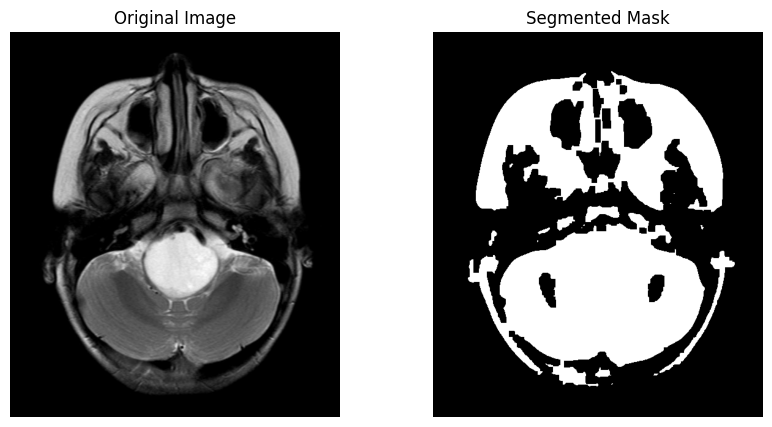

False

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the image
image_path = "/content/b3.jpeg"
image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

# Apply Gaussian Blur to remove noise
blurred = cv2.GaussianBlur(image, (5, 5), 0)

# Apply Otsu's Thresholding to segment the infected region
_, mask = cv2.threshold(blurred, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

# Perform morphological operations to refine the mask
kernel = np.ones((5, 5), np.uint8)
mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel, iterations=2)  # Close small holes

# Display the results
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(image, cmap='gray')
plt.title("Original Image")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(mask, cmap='gray')
plt.title("Segmented Mask")
plt.axis("off")

plt.show()

# Save the mask
cv2.imwrite("/mnt/data/segmented_mask.png", mask)


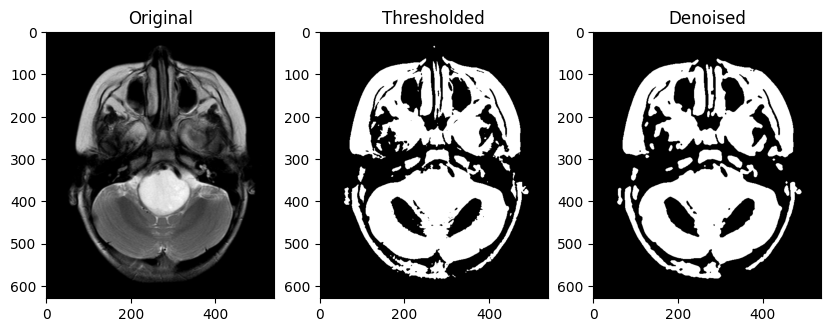

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load image in grayscale
image_path = "/content/b3.jpeg"
image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

# Step 1: Apply Gaussian Blur to reduce noise
blurred = cv2.GaussianBlur(image, (5, 5), 0)

# Step 2: Apply Adaptive Histogram Equalization (CLAHE) for contrast enhancement
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
enhanced = clahe.apply(blurred)

# Step 3: Apply Otsu’s Thresholding to segment the main region
_, thresh = cv2.threshold(enhanced, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

# Step 4: Remove small artifacts using Morphological Operations
kernel = np.ones((3,3), np.uint8)
cleaned = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, kernel, iterations=2)

# Step 5: Apply Median Filtering to further smoothen noise
denoised = cv2.medianBlur(cleaned, 5)

# Display Results
plt.figure(figsize=(10,5))
plt.subplot(1,3,1), plt.imshow(image, cmap='gray'), plt.title("Original")
plt.subplot(1,3,2), plt.imshow(thresh, cmap='gray'), plt.title("Thresholded")
plt.subplot(1,3,3), plt.imshow(denoised, cmap='gray'), plt.title("Denoised")
plt.show()


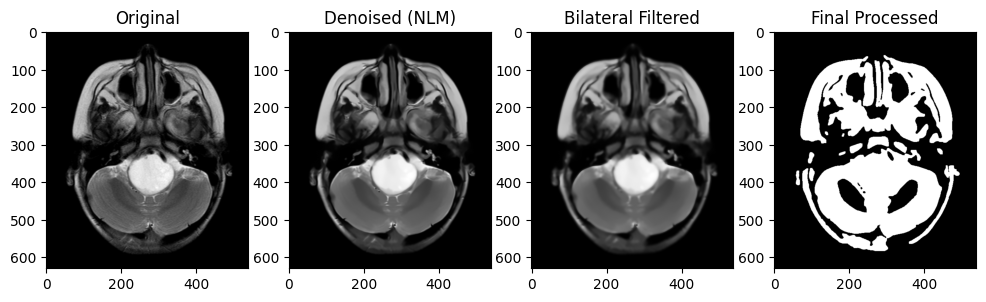

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load image in grayscale
image_path = "/content/b3.jpeg"
image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

# Step 1: Apply Non-Local Means Denoising (Effective for MRI images)
denoised = cv2.fastNlMeansDenoising(image, None, h=10, templateWindowSize=7, searchWindowSize=21)

# Step 2: Apply Bilateral Filtering (Reduces noise while preserving edges)
bilateral = cv2.bilateralFilter(denoised, d=9, sigmaColor=75, sigmaSpace=75)

# Step 3: Apply Contrast Limited Adaptive Histogram Equalization (CLAHE)
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
enhanced = clahe.apply(bilateral)

# Step 4: Apply Otsu’s Thresholding for segmentation
_, thresh = cv2.threshold(enhanced, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

# Step 5: Remove small artifacts using Morphological Operations
kernel = np.ones((3,3), np.uint8)
cleaned = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, kernel, iterations=2)

# Display Results
plt.figure(figsize=(12,6))
plt.subplot(1,4,1), plt.imshow(image, cmap='gray'), plt.title("Original")
plt.subplot(1,4,2), plt.imshow(denoised, cmap='gray'), plt.title("Denoised (NLM)")
plt.subplot(1,4,3), plt.imshow(bilateral, cmap='gray'), plt.title("Bilateral Filtered")
plt.subplot(1,4,4), plt.imshow(cleaned, cmap='gray'), plt.title("Final Processed")
plt.show()


Epoch 1/5
1/1 ━━━━━━━━━━━━━━━━━━━━ 21s 21s/step - accuracy: 0.2491 - loss: 0.6823
Epoch 2/5
1/1 ━━━━━━━━━━━━━━━━━━━━ 20s 20s/step - accuracy: 0.6465 - loss: 0.6529
Epoch 3/5
1/1 ━━━━━━━━━━━━━━━━━━━━ 20s 20s/step - accuracy: 0.3272 - loss: 0.7121
Epoch 4/5
1/1 ━━━━━━━━━━━━━━━━━━━━ 21s 21s/step - accuracy: 0.7511 - loss: 0.6303
Epoch 5/5
1/1 ━━━━━━━━━━━━━━━━━━━━ 19s 19s/step - accuracy: 0.7820 - loss: 0.6061
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


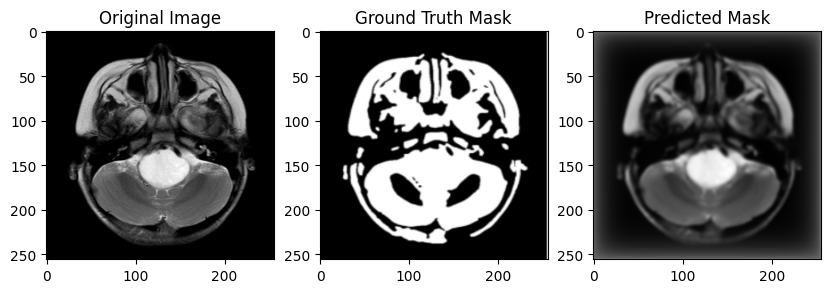

In [ ]:
import tensorflow as tf
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, concatenate
from tensorflow.keras.models import Model
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load image and mask
image_path = "/content/b3.jpeg"
mask_path = "/content/Screenshot 2025-03-13 115224.png"  # Replace with your actual mask file

# Load and preprocess image and mask
def load_and_preprocess(img_path, mask_path, img_size=(256,256)):
    image = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)  # Load as grayscale
    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)  # Load mask as grayscale

    # Resize images to match model input size
    image = cv2.resize(image, img_size)
    mask = cv2.resize(mask, img_size)

    # Normalize images
    image = image / 255.0
    mask = mask / 255.0

    # Expand dimensions to match model input format
    image = np.expand_dims(image, axis=-1)
    mask = np.expand_dims(mask, axis=-1)

    return image, mask

image, mask = load_and_preprocess(image_path, mask_path)

# Create dataset
X_train = np.array([image])
Y_train = np.array([mask])

# U-Net Model
def unet_model(input_size=(256, 256, 1)):
    inputs = Input(input_size)

    # Encoder (Downsampling)
    conv1 = Conv2D(64, 3, activation='relu', padding='same')(inputs)
    conv1 = Conv2D(64, 3, activation='relu', padding='same')(conv1)
    pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)

    conv2 = Conv2D(128, 3, activation='relu', padding='same')(pool1)
    conv2 = Conv2D(128, 3, activation='relu', padding='same')(conv2)
    pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)

    conv3 = Conv2D(256, 3, activation='relu', padding='same')(pool2)
    conv3 = Conv2D(256, 3, activation='relu', padding='same')(conv3)
    pool3 = MaxPooling2D(pool_size=(2, 2))(conv3)

    conv4 = Conv2D(512, 3, activation='relu', padding='same')(pool3)
    conv4 = Conv2D(512, 3, activation='relu', padding='same')(conv4)
    pool4 = MaxPooling2D(pool_size=(2, 2))(conv4)

    # Bottleneck
    conv5 = Conv2D(1024, 3, activation='relu', padding='same')(pool4)
    conv5 = Conv2D(1024, 3, activation='relu', padding='same')(conv5)

    # Decoder (Upsampling)
    up6 = UpSampling2D(size=(2, 2))(conv5)
    up6 = Conv2D(512, 3, activation='relu', padding='same')(up6)
    merge6 = concatenate([conv4, up6], axis=3)
    conv6 = Conv2D(512, 3, activation='relu', padding='same')(merge6)
    conv6 = Conv2D(512, 3, activation='relu', padding='same')(conv6)

    up7 = UpSampling2D(size=(2, 2))(conv6)
    up7 = Conv2D(256, 3, activation='relu', padding='same')(up7)
    merge7 = concatenate([conv3, up7], axis=3)
    conv7 = Conv2D(256, 3, activation='relu', padding='same')(merge7)
    conv7 = Conv2D(256, 3, activation='relu', padding='same')(conv7)

    up8 = UpSampling2D(size=(2, 2))(conv7)
    up8 = Conv2D(128, 3, activation='relu', padding='same')(up8)
    merge8 = concatenate([conv2, up8], axis=3)
    conv8 = Conv2D(128, 3, activation='relu', padding='same')(merge8)
    conv8 = Conv2D(128, 3, activation='relu', padding='same')(conv8)

    up9 = UpSampling2D(size=(2, 2))(conv8)
    up9 = Conv2D(64, 3, activation='relu', padding='same')(up9)
    merge9 = concatenate([conv1, up9], axis=3)
    conv9 = Conv2D(64, 3, activation='relu', padding='same')(merge9)
    conv9 = Conv2D(64, 3, activation='relu', padding='same')(conv9)

    outputs = Conv2D(1, 1, activation='sigmoid')(conv9)

    model = Model(inputs, outputs)
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

    return model

# Create U-Net model
model = unet_model()

# Train the model
model.fit(X_train, Y_train, epochs=5, batch_size=1)

# Predict segmentation mask
predicted_mask = model.predict(X_train)[0]

# Display results
plt.figure(figsize=(10,5))
plt.subplot(1,3,1), plt.imshow(image.squeeze(), cmap='gray'), plt.title("Original Image")
plt.subplot(1,3,2), plt.imshow(mask.squeeze(), cmap='gray'), plt.title("Ground Truth Mask")
plt.subplot(1,3,3), plt.imshow(predicted_mask.squeeze(), cmap='gray'), plt.title("Predicted Mask")
plt.show()


Epoch 1/5
1/1 ━━━━━━━━━━━━━━━━━━━━ 26s 26s/step - accuracy: 0.2336 - loss: 1.0268
Epoch 2/5
1/1 ━━━━━━━━━━━━━━━━━━━━ 10s 10s/step - accuracy: 0.7419 - loss: 0.5050
Epoch 3/5
1/1 ━━━━━━━━━━━━━━━━━━━━ 20s 20s/step - accuracy: 0.7708 - loss: 0.3074
Epoch 4/5
1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step - accuracy: 0.7952 - loss: 0.2470
Epoch 5/5
1/1 ━━━━━━━━━━━━━━━━━━━━ 10s 10s/step - accuracy: 0.7921 - loss: 0.2438
1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


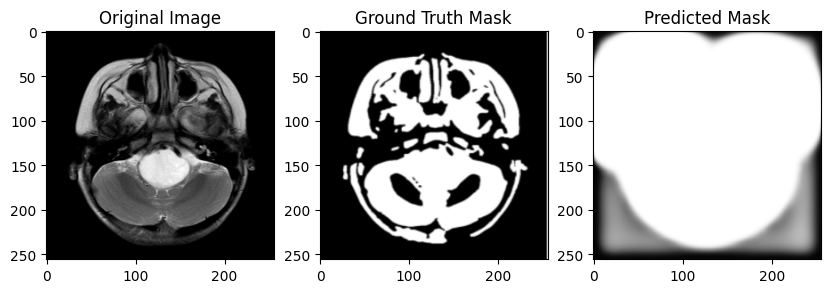

In [ ]:
import tensorflow as tf
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, concatenate, BatchNormalization, Activation
from tensorflow.keras.models import Model
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load image and mask
image_path = "/content/b3.jpeg"
mask_path = "/content/Screenshot 2025-03-13 115224.png"

def load_and_preprocess(img_path, mask_path, img_size=(256, 256)):
    image = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

    image = cv2.resize(image, img_size) / 255.0
    mask = cv2.resize(mask, img_size) / 255.0

    image = np.expand_dims(image, axis=-1)
    mask = np.expand_dims(mask, axis=-1)

    return image, mask

image, mask = load_and_preprocess(image_path, mask_path)
X_train = np.array([image])
Y_train = np.array([mask])

# U-Net++ Model
def conv_block(x, filters):
    x = Conv2D(filters, (3, 3), padding="same")(x)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)

    x = Conv2D(filters, (3, 3), padding="same")(x)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)

    return x

def unet_plus_plus(input_size=(256, 256, 1)):
    inputs = Input(input_size)

    c0 = conv_block(inputs, 64)
    p0 = MaxPooling2D(pool_size=(2, 2))(c0)

    c1 = conv_block(p0, 128)
    p1 = MaxPooling2D(pool_size=(2, 2))(c1)

    c2 = conv_block(p1, 256)
    p2 = MaxPooling2D(pool_size=(2, 2))(c2)

    c3 = conv_block(p2, 512)
    p3 = MaxPooling2D(pool_size=(2, 2))(c3)

    c4 = conv_block(p3, 1024)

    # Decoder Path (Nested Skip Connections)
    u3 = UpSampling2D(size=(2, 2))(c4)
    merge3 = concatenate([c3, u3], axis=3)
    c3_2 = conv_block(merge3, 512)

    u2 = UpSampling2D(size=(2, 2))(c3_2)
    merge2 = concatenate([c2, u2], axis=3)
    c2_2 = conv_block(merge2, 256)

    u1 = UpSampling2D(size=(2, 2))(c2_2)
    merge1 = concatenate([c1, u1], axis=3)
    c1_2 = conv_block(merge1, 128)

    u0 = UpSampling2D(size=(2, 2))(c1_2)
    merge0 = concatenate([c0, u0], axis=3)
    c0_2 = conv_block(merge0, 64)

    outputs = Conv2D(1, (1, 1), activation="sigmoid")(c0_2)

    model = Model(inputs, outputs)
    model.compile(optimizer="adam", loss="binary_crossentropy", metrics=["accuracy"])

    return model

# Build U-Net++ Model
model = unet_plus_plus()

# Train Model
model.fit(X_train, Y_train, epochs=5, batch_size=1)

# Predict Segmentation
predicted_mask = model.predict(X_train)[0]

# Display results
plt.figure(figsize=(10,5))
plt.subplot(1,3,1), plt.imshow(image.squeeze(), cmap='gray'), plt.title("Original Image")
plt.subplot(1,3,2), plt.imshow(mask.squeeze(), cmap='gray'), plt.title("Ground Truth Mask")
plt.subplot(1,3,3), plt.imshow(predicted_mask.squeeze(), cmap='gray'), plt.title("Predicted Mask")
plt.show()


In [ ]:
import segmentation_models as sm
import tensorflow as tf
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load Image & Mask
def load_and_preprocess(img_path, mask_path, img_size=(256, 256)):
    image = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

    image = cv2.resize(image, img_size) / 255.0
    mask = cv2.resize(mask, img_size) / 255.0

    image = np.expand_dims(image, axis=-1)
    mask = np.expand_dims(mask, axis=-1)

    return image, mask

image_path = "/content/b3.jpeg"
mask_path = "/content/Screenshot 2025-03-13 115224.png"

image, mask = load_and_preprocess(image_path, mask_path)
X_train = np.array([image])
Y_train = np.array([mask])

# U-Net with ResNet34 Backbone
BACKBONE = 'resnet34'
model = sm.Unet(BACKBONE, encoder_weights='imagenet', classes=1, activation='sigmoid')

# Use Dice Loss for better segmentation
model.compile(optimizer="adam", loss=sm.losses.DiceLoss(), metrics=["accuracy"])

# Train Model for More Epochs
model.fit(X_train, Y_train, epochs=50, batch_size=1)

# Predict Segmentation
predicted_mask = model.predict(X_train)[0]

# Display Results
plt.figure(figsize=(10,5))
plt.subplot(1,3,1), plt.imshow(image.squeeze(), cmap='gray'), plt.title("Original Image")
plt.subplot(1,3,2), plt.imshow(mask.squeeze(), cmap='gray'), plt.title("Ground Truth Mask")
plt.subplot(1,3,3), plt.imshow(predicted_mask.squeeze(), cmap='gray'), plt.title("Predicted Mask")
plt.show()


ModuleNotFoundError: No module named 'segmentation_models'

In [ ]:
!pip install segmentation-models tensorflow opencv-python numpy matplotlib
!pip uninstall -y keras tensorflow segmentation-models
!pip install tensorflow==2.8.0 keras==2.8.0 segmentation-models


import os
import numpy as np
import cv2
import tensorflow as tf
import segmentation_models as sm
import matplotlib.pyplot as plt

# Ensure segmentation_models works with TensorFlow's Keras
os.environ["SM_FRAMEWORK"] = "tf.keras"

# Load Image & Mask (Modify Paths as Needed)
image_path = "/content/b3.jpeg"   # Input image
mask_path = "/content/Screenshot 2025-03-13 115224.png"  # Ground truth mask

# Preprocess Image
def preprocess_image(image_path):
    img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)  # Read as grayscale
    img = cv2.resize(img, (256, 256))  # Resize
    img = img / 255.0  # Normalize
    img = np.expand_dims(img, axis=-1)  # Add channel dimension
    return np.expand_dims(img, axis=0)  # Add batch dimension

# Preprocess Mask
def preprocess_mask(mask_path):
    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)  # Read as grayscale
    mask = cv2.resize(mask, (256, 256))  # Resize
    mask = mask / 255.0  # Normalize (convert to binary mask)
    mask = np.expand_dims(mask, axis=-1)  # Add channel dimension
    return np.expand_dims(mask, axis=0)  # Add batch dimension

# Load Image & Mask
image = preprocess_image(image_path)
mask = preprocess_mask(mask_path)

# Define U-Net Model
BACKBONE = 'resnet34'  # Backbone for feature extraction
unet_model = sm.Unet(BACKBONE, encoder_weights=None, input_shape=(256, 256, 1), classes=1, activation='sigmoid')

# Compile Model
unet_model.compile(optimizer='adam', loss=sm.losses.bce_jaccard_loss, metrics=[sm.metrics.iou_score])

# Train the Model (Adjust epochs as needed)
print("Training U-Net model...")
unet_model.fit(image, mask, epochs=10, batch_size=1, verbose=1)

# Save Model Weights
weights_path = "/mnt/data/unet_trained_weights.h5"
unet_model.save_weights(weights_path)
print(f"Model trained and weights saved at {weights_path}")

# Predict Segmentation Mask
predicted_mask = unet_model.predict(image)[0, :, :, 0]  # Remove batch & channel dimensions

# Post-process Prediction
predicted_mask = (predicted_mask > 0.5).astype(np.uint8)  # Apply thresholding

# Display Results
fig, axes = plt.subplots(1, 3, figsize=(12, 4))
axes[0].imshow(image[0, :, :, 0], cmap='gray')
axes[0].set_title("Original Image")
axes[1].imshow(mask[0, :, :, 0], cmap='gray')
axes[1].set_title("Ground Truth Mask")
axes[2].imshow(predicted_mask, cmap='gray')
axes[2].set_title("Predicted Mask")

for ax in axes:
    ax.axis("off")

plt.show()




Found existing installation: keras 3.8.0
Uninstalling keras-3.8.0:
  Successfully uninstalled keras-3.8.0
Found existing installation: tensorflow 2.18.0
Uninstalling tensorflow-2.18.0:
  Successfully uninstalled tensorflow-2.18.0
Found existing installation: segmentation-models 1.0.1
Uninstalling segmentation-models-1.0.1:
  Successfully uninstalled segmentation-models-1.0.1
ERROR: Could not find a version that satisfies the requirement tensorflow==2.8.0 (from versions: 2.12.0rc0, 2.12.0rc1, 2.12.0, 2.12.1, 2.13.0rc0, 2.13.0rc1, 2.13.0rc2, 2.13.0, 2.13.1, 2.14.0rc0, 2.14.0rc1, 2.14.0, 2.14.1, 2.15.0rc0, 2.15.0rc1, 2.15.0, 2.15.0.post1, 2.15.1, 2.16.0rc0, 2.16.1, 2.16.2, 2.17.0rc0, 2.17.0rc1, 2.17.0, 2.17.1, 2.18.0rc0, 2.18.0rc1, 2.18.0rc2, 2.18.0, 2.18.1, 2.19.0rc0, 2.19.0)
ERROR: No matching distribution found for tensorflow==2.8.0


ModuleNotFoundError: No module named 'segmentation_models'

In [ ]:
!pip install tensorflow==2.18.1 keras==2.18.1 segmentation-models tensorflow-addons

# Import required libraries
import tensorflow as tf
import segmentation_models as sm
import numpy as np
import cv2
import matplotlib.pyplot as plt
from tensorflow.keras import layers, Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import train_test_split

# Load and preprocess the image
def load_image(image_path, mask_path, img_size=(256, 256)):
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)  # Read in grayscale
    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)    # Read mask in grayscale

    image = cv2.resize(image, img_size) / 255.0           # Normalize image
    mask = cv2.resize(mask, img_size)                     # Resize mask

    mask = np.expand_dims(mask, axis=-1)                  # Ensure correct shape
    return image, mask

# Define U-Net model
def unet_model(input_size=(256, 256, 1)):
    inputs = layers.Input(input_size)

    # Encoder (Downsampling)
    c1 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(inputs)
    c1 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(c1)
    p1 = layers.MaxPooling2D((2, 2))(c1)

    c2 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(p1)
    c2 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(c2)
    p2 = layers.MaxPooling2D((2, 2))(c2)

    c3 = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(p2)
    c3 = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(c3)
    p3 = layers.MaxPooling2D((2, 2))(c3)

    c4 = layers.Conv2D(512, (3, 3), activation='relu', padding='same')(p3)
    c4 = layers.Conv2D(512, (3, 3), activation='relu', padding='same')(c4)
    p4 = layers.MaxPooling2D((2, 2))(c4)

    # Bottleneck
    c5 = layers.Conv2D(1024, (3, 3), activation='relu', padding='same')(p4)
    c5 = layers.Conv2D(1024, (3, 3), activation='relu', padding='same')(c5)

    # Decoder (Upsampling)
    u6 = layers.Conv2DTranspose(512, (2, 2), strides=(2, 2), padding='same')(c5)
    u6 = layers.concatenate([u6, c4])
    c6 = layers.Conv2D(512, (3, 3), activation='relu', padding='same')(u6)
    c6 = layers.Conv2D(512, (3, 3), activation='relu', padding='same')(c6)

    u7 = layers.Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(c6)
    u7 = layers.concatenate([u7, c3])
    c7 = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(u7)
    c7 = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(c7)

    u8 = layers.Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(c7)
    u8 = layers.concatenate([u8, c2])
    c8 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(u8)
    c8 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(c8)

    u9 = layers.Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(c8)
    u9 = layers.concatenate([u9, c1])
    c9 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(u9)
    c9 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(c9)

    outputs = layers.Conv2D(1, (1, 1), activation='sigmoid')(c9)

    model = Model(inputs, outputs)
    return model

# Load and preprocess data
image_path = "/content/b3.jpeg"
mask_path = "/content/Screenshot 2025-03-13 115224.png"

image, mask = load_image(image_path, mask_path)
X = np.expand_dims(image, axis=0)  # Add batch dimension
Y = np.expand_dims(mask, axis=0)   # Add batch dimension

# Train-test split
X_train, X_val, Y_train, Y_val = train_test_split(X, Y, test_size=0.2, random_state=42)

# Compile U-Net
model = unet_model()
model.compile(optimizer=Adam(learning_rate=0.001), loss="binary_crossentropy", metrics=["accuracy"])

# Train model
model.fit(X_train, Y_train, epochs=10, batch_size=1, validation_data=(X_val, Y_val))

# Predict
pred_mask = model.predict(X)

# Visualize results
plt.figure(figsize=(12, 4))

plt.subplot(1, 3, 1)
plt.title("Original Image")
plt.imshow(image, cmap="gray")

plt.subplot(1, 3, 2)
plt.title("Ground Truth Mask")
plt.imshow(mask, cmap="gray")

plt.subplot(1, 3, 3)
plt.title("Predicted Mask")
plt.imshow(pred_mask[0, :, :, 0], cmap="gray")

plt.show()


ERROR: Could not find a version that satisfies the requirement keras==2.18.1 (from versions: 0.2.0, 0.3.0, 0.3.1, 0.3.2, 0.3.3, 1.0.0, 1.0.1, 1.0.2, 1.0.3, 1.0.4, 1.0.5, 1.0.6, 1.0.7, 1.0.8, 1.1.0, 1.1.1, 1.1.2, 1.2.0, 1.2.1, 1.2.2, 2.0.0, 2.0.1, 2.0.2, 2.0.3, 2.0.4, 2.0.5, 2.0.6, 2.0.7, 2.0.8, 2.0.9, 2.1.0, 2.1.1, 2.1.2, 2.1.3, 2.1.4, 2.1.5, 2.1.6, 2.2.0, 2.2.1, 2.2.2, 2.2.3, 2.2.4, 2.2.5, 2.3.0, 2.3.1, 2.4.0, 2.4.1, 2.4.2, 2.4.3, 2.5.0rc0, 2.6.0rc0, 2.6.0rc1, 2.6.0rc2, 2.6.0rc3, 2.6.0, 2.7.0rc0, 2.7.0rc2, 2.7.0, 2.8.0rc0, 2.8.0rc1, 2.8.0, 2.9.0rc0, 2.9.0rc1, 2.9.0rc2, 2.9.0, 2.10.0rc0, 2.10.0rc1, 2.10.0, 2.11.0rc0, 2.11.0rc1, 2.11.0rc2, 2.11.0rc3, 2.11.0, 2.12.0rc0, 2.12.0rc1, 2.12.0, 2.13.1rc0, 2.13.1rc1, 2.13.1, 2.14.0rc0, 2.14.0, 2.15.0rc0, 2.15.0rc1, 2.15.0, 3.0.0, 3.0.1, 3.0.2, 3.0.3, 3.0.4, 3.0.5, 3.1.0, 3.1.1, 3.2.0, 3.2.1, 3.3.0, 3.3.1, 3.3.2, 3.3.3, 3.4.0, 3.4.1, 3.5.0, 3.6.0, 3.7.0, 3.8.0, 3.9.0)
ERROR: No matching distribution found for keras==2.18.1


ModuleNotFoundError: No module named 'segmentation_models'

Epoch 1/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 13s 13s/step - accuracy: 0.4775 - loss: 0.5660
Epoch 2/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step - accuracy: 0.0067 - loss: -7.9868
Epoch 3/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step - accuracy: 0.0067 - loss: -48.0782
Epoch 4/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 10s 10s/step - accuracy: 0.0067 - loss: -1853.6958
Epoch 5/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 12s 12s/step - accuracy: 0.0067 - loss: -48822.7891
Epoch 6/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 10s 10s/step - accuracy: 0.0067 - loss: -797388.3750
Epoch 7/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step - accuracy: 0.0067 - loss: -9389818.0000
Epoch 8/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 10s 10s/step - accuracy: 0.0067 - loss: -85340232.0000
Epoch 9/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 11s 11s/step - accuracy: 0.0067 - loss: -633969152.0000
Epoch 10/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 11s 11s/step - accuracy: 0.0067 - loss: -3997269248.0000
Epoch 11/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 11s 11s/step - accuracy: 0.0067 - loss: -21951987712.0000
Epoch 12/50
1/1 ━━━━━━━━━━━━

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


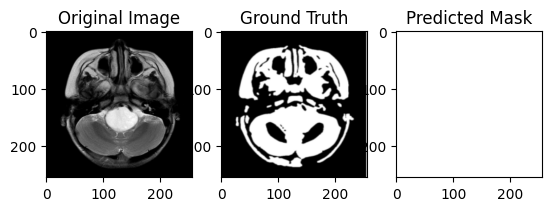

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, Model
import numpy as np
import cv2
import matplotlib.pyplot as plt

# Function to build U-Net model
def build_unet(input_shape=(256, 256, 1)):
    inputs = layers.Input(input_shape)

    # Encoder
    c1 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(inputs)
    c1 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(c1)
    p1 = layers.MaxPooling2D((2, 2))(c1)

    c2 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(p1)
    c2 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(c2)
    p2 = layers.MaxPooling2D((2, 2))(c2)

    c3 = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(p2)
    c3 = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(c3)
    p3 = layers.MaxPooling2D((2, 2))(c3)

    # Bottleneck
    b = layers.Conv2D(512, (3, 3), activation='relu', padding='same')(p3)
    b = layers.Conv2D(512, (3, 3), activation='relu', padding='same')(b)

    # Decoder
    u3 = layers.Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(b)
    u3 = layers.concatenate([u3, c3])
    c4 = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(u3)
    c4 = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(c4)

    u2 = layers.Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(c4)
    u2 = layers.concatenate([u2, c2])
    c5 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(u2)
    c5 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(c5)

    u1 = layers.Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(c5)
    u1 = layers.concatenate([u1, c1])
    c6 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(u1)
    c6 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(c6)

    outputs = layers.Conv2D(1, (1, 1), activation='sigmoid')(c6)

    return Model(inputs, outputs)

# Load image function
def load_image(image_path, mask_path, size=(256, 256)):
    img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

    img = cv2.resize(img, size) / 255.0
    mask = cv2.resize(mask, size)

    img = np.expand_dims(img, axis=-1)
    mask = np.expand_dims(mask, axis=-1)
    return img, mask

# Example usage
image_path = "/content/b3.jpeg"
mask_path = "/content/Screenshot 2025-03-13 115224.png"
image, mask = load_image(image_path, mask_path)

X = np.expand_dims(image, axis=0)
Y = np.expand_dims(mask, axis=0)

# Compile and train
model = build_unet()
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
model.fit(X, Y, epochs=50, batch_size=1)

# Predict and visualize
pred_mask = model.predict(X)

plt.subplot(1, 3, 1)
plt.imshow(image[:, :, 0], cmap='gray')
plt.title("Original Image")

plt.subplot(1, 3, 2)
plt.imshow(mask[:, :, 0], cmap='gray')
plt.title("Ground Truth")

plt.subplot(1, 3, 3)
plt.imshow(pred_mask[0, :, :, 0], cmap='gray')
plt.title("Predicted Mask")

plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 787ms/step


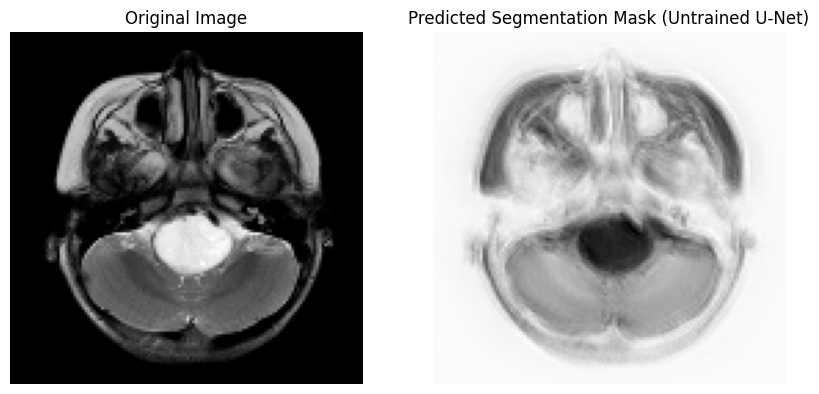

In [ ]:
import tensorflow as tf
from tensorflow.keras.layers import Conv2D, MaxPooling2D, UpSampling2D, Concatenate, Input
from tensorflow.keras.models import Model
import numpy as np
import cv2
import matplotlib.pyplot as plt

# Load and preprocess the image
image_path = "/content/b3.jpeg"  # Your uploaded image
image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
image = cv2.resize(image, (128, 128))  # Resize for U-Net
image = image / 255.0  # Normalize
image = np.expand_dims(image, axis=-1)  # Add channel dimension
image = np.expand_dims(image, axis=0)  # Add batch dimension

# Define U-Net Model
def unet_model(input_size=(128, 128, 1)):
    inputs = Input(input_size)

    # Encoder
    c1 = Conv2D(64, (3, 3), activation='relu', padding='same')(inputs)
    c1 = Conv2D(64, (3, 3), activation='relu', padding='same')(c1)
    p1 = MaxPooling2D((2, 2))(c1)

    c2 = Conv2D(128, (3, 3), activation='relu', padding='same')(p1)
    c2 = Conv2D(128, (3, 3), activation='relu', padding='same')(c2)
    p2 = MaxPooling2D((2, 2))(c2)

    # Bottleneck
    c3 = Conv2D(256, (3, 3), activation='relu', padding='same')(p2)
    c3 = Conv2D(256, (3, 3), activation='relu', padding='same')(c3)

    # Decoder
    u4 = UpSampling2D((2, 2))(c3)
    u4 = Concatenate()([u4, c2])
    c4 = Conv2D(128, (3, 3), activation='relu', padding='same')(u4)
    c4 = Conv2D(128, (3, 3), activation='relu', padding='same')(c4)

    u5 = UpSampling2D((2, 2))(c4)
    u5 = Concatenate()([u5, c1])
    c5 = Conv2D(64, (3, 3), activation='relu', padding='same')(u5)
    c5 = Conv2D(64, (3, 3), activation='relu', padding='same')(c5)

    outputs = Conv2D(1, (1, 1), activation='sigmoid')(c5)

    model = Model(inputs, outputs)
    return model

# Create and compile the model
model = unet_model()
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Predict segmentation mask (without training, just for visualization)
pred_mask = model.predict(image)[0, :, :, 0]

# Display original and segmented images
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.title("Original Image")
plt.imshow(image[0, :, :, 0], cmap="gray")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.title("Predicted Segmentation Mask (Untrained U-Net)")
plt.imshow(pred_mask, cmap="gray")
plt.axis("off")

plt.show()


In [ ]:
!pip install nibabel nilearn numpy SimpleITK


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.5/10.5 MB 46.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 52.3/52.3 MB 13.9 MB/s eta 0:00:00


In [ ]:
import os
import nibabel as nib
import numpy as np
import SimpleITK as sitk
from nilearn.image import resample_img

def preprocess_mri(input_path, output_path, target_spacing=(1.0, 1.0, 1.0)):
    # Load the MRI scan
    img = nib.load(input_path)
    data = img.get_fdata()
    affine = img.affine

    # Bias Field Correction using SimpleITK
    sitk_image = sitk.GetImageFromArray(data)
    corrector = sitk.N4BiasFieldCorrectionImageFilter()
    corrected_image = corrector.Execute(sitk_image)
    corrected_data = sitk.GetArrayFromImage(corrected_image)

    # Normalize the intensity values (Z-score normalization)
    mean = np.mean(corrected_data)
    std = np.std(corrected_data)
    normalized_data = (corrected_data - mean) / std

    # Create a new NIfTI image
    normalized_img = nib.Nifti1Image(normalized_data, affine)

    # Resample the image to the target spacing
    resampled_img = resample_img(normalized_img, target_affine=np.diag(target_spacing), interpolation='continuous')

    # Save the preprocessed image
    nib.save(resampled_img, output_path)
    print(f"Preprocessed image saved at: {output_path}")


In [ ]:
import cv2
import numpy as np
import os

def preprocess_brain_image(input_path, output_path, target_size=(256, 256)):
    # Step 1: Load the image in grayscale
    image = cv2.imread(input_path, cv2.IMREAD_GRAYSCALE)

    if image is None:
        raise ValueError(f"Could not load image from {input_path}")

    # Step 2: Resize to the target size
    resized = cv2.resize(image, target_size)

    # Step 3: Normalize (mean=0, std=1)
    mean = np.mean(resized)
    std = np.std(resized)
    normalized = (resized - mean) / (std + 1e-8)  # Avoid division by zero

    # Step 4: Save the preprocessed image as .npy for easy model loading
    np.save(output_path, normalized)

    print(f"✅ Preprocessed and saved to: {output_path}.npy")

# ===> Example Usage <===

input_file = '/mnt/data/ct1.png'   # replace with your uploaded image path
output_file = '/mnt/data/preprocessed_ct1'  # no extension, .npy will be added

preprocess_brain_image(input_file, output_file)



ValueError: Could not load image from /mnt/data/ct1.png

In [ ]:
import os
import numpy as np
import cv2
import tensorflow as tf
from sklearn.model_selection import train_test_split

# Function to load images from a directory
def load_images_from_directory(directory, img_size=(256, 256)):
    images = []
    for img_name in os.listdir(directory):
        img_path = os.path.join(directory, img_name)
        if img_path.endswith('.jpg') or img_path.endswith('.png') or img_path.endswith('.nii'):
            # Load image (assumes .nii for medical images, otherwise use OpenCV for jpg/png)
            img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)  # Adjust to suit your format (e.g., using nibabel for NIfTI)
            img = cv2.resize(img, img_size)
            images.append(img)
    return np.array(images)

# Load datasets
healthy_brain_dir = '/content/ct1.png'
glioma_brain_dir = '/content/b3.jpeg'

healthy_images = load_images_from_directory(healthy_brain_dir)
glioma_images = load_images_from_directory(glioma_brain_dir)

# Normalize the images to [0, 1]
healthy_images = healthy_images.astype('float32') / 255.0
glioma_images = glioma_images.astype('float32') / 255.0

# Expand dimensions if needed (e.g., if single-channel grayscale images)
healthy_images = np.expand_dims(healthy_images, axis=-1)
glioma_images = np.expand_dims(glioma_images, axis=-1)

# Split data into training/validation sets for healthy and glioma images
healthy_train_data, healthy_val_data = train_test_split(healthy_images, test_size=0.2, random_state=42)
glioma_test_data = glioma_images  # Use the glioma data for testing

print(f'Healthy Train Data Shape: {healthy_train_data.shape}')
print(f'Healthy Validation Data Shape: {healthy_val_data.shape}')
print(f'Glioma Test Data Shape: {glioma_test_data.shape}')


NotADirectoryError: [Errno 20] Not a directory: '/content/ct1.png'

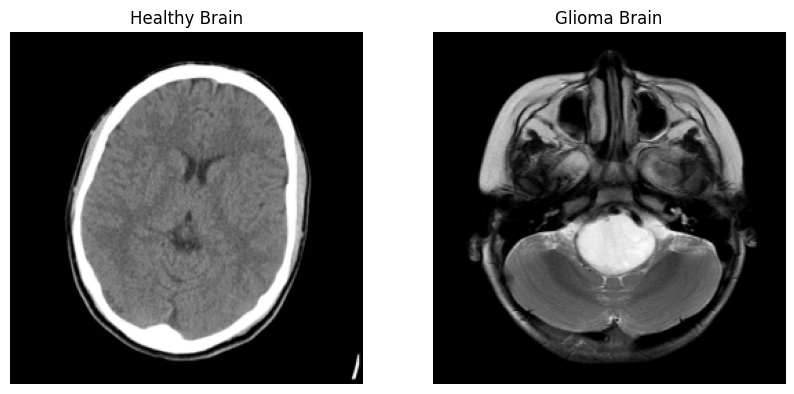

Healthy Image Shape: (256, 256, 1)
Glioma Image Shape: (256, 256, 1)


In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

# Function to load a single image
def load_single_image(image_path, img_size=(256, 256)):
    img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)  # For medical images, use appropriate library if needed (e.g., nibabel for NIfTI)
    img = cv2.resize(img, img_size)  # Resize to desired size
    img = img.astype('float32') / 255.0  # Normalize the image
    img = np.expand_dims(img, axis=-1)  # Add a channel dimension if it's grayscale
    return img

# Example paths to your images (change to your actual paths)
healthy_image_path = '/content/ct1.png'
glioma_image_path = '/content/b3.jpeg'

# Load the images
healthy_image = load_single_image(healthy_image_path)
glioma_image = load_single_image(glioma_image_path)

# Display the images to verify
plt.figure(figsize=(10, 5))

# Plot healthy image
plt.subplot(1, 2, 1)
plt.imshow(healthy_image.squeeze(), cmap='gray')
plt.title('Healthy Brain')
plt.axis('off')

# Plot glioma image
plt.subplot(1, 2, 2)
plt.imshow(glioma_image.squeeze(), cmap='gray')
plt.title('Glioma Brain')
plt.axis('off')

plt.show()

# Print shapes of the loaded images
print(f'Healthy Image Shape: {healthy_image.shape}')
print(f'Glioma Image Shape: {glioma_image.shape}')


In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, models

# Define input shape based on your images (256x256x1 for grayscale)
input_shape = (256, 256, 1)

# Build the Autoencoder
def build_autoencoder():
    # Encoder
    input_img = layers.Input(shape=input_shape)

    x = layers.Conv2D(32, (3,3), activation='relu', padding='same')(input_img)
    x = layers.MaxPooling2D((2,2), padding='same')(x)

    x = layers.Conv2D(64, (3,3), activation='relu', padding='same')(x)
    x = layers.MaxPooling2D((2,2), padding='same')(x)

    x = layers.Conv2D(128, (3,3), activation='relu', padding='same')(x)
    encoded = layers.MaxPooling2D((2,2), padding='same')(x)

    # Decoder
    x = layers.Conv2D(128, (3,3), activation='relu', padding='same')(encoded)
    x = layers.UpSampling2D((2,2))(x)

    x = layers.Conv2D(64, (3,3), activation='relu', padding='same')(x)
    x = layers.UpSampling2D((2,2))(x)

    x = layers.Conv2D(32, (3,3), activation='relu', padding='same')(x)
    x = layers.UpSampling2D((2,2))(x)

    decoded = layers.Conv2D(1, (3,3), activation='sigmoid', padding='same')(x)

    autoencoder = models.Model(input_img, decoded)
    autoencoder.compile(optimizer='adam', loss='mse')

    return autoencoder

# Create the autoencoder model
autoencoder = build_autoencoder()
autoencoder.summary()


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 256, 256, 1)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 256, 256, 32)   │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 128, 128, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 128, 128, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 64, 64, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 64, 64, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 32, 32, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 32, 32, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d (UpSampling2D)    │ (None, 64, 64, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 64, 64, 64)     │        73,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d_1 (UpSampling2D)  │ (None, 128, 128, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 128, 128, 32)   │        18,464 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d_2 (UpSampling2D)  │ (None, 256, 256, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 256, 256, 1)    │           289 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 332,801 (1.27 MB)

 Trainable params: 332,801 (1.27 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
# Assuming 'healthy_train_data' and 'healthy_val_data' were prepared earlier in Step 1
# Make sure the shape is (num_samples, 256, 256, 1)

# Train the autoencoder
history = autoencoder.fit(
    healthy_train_data, healthy_train_data,  # input = target (unsupervised)
    epochs=50,                               # adjust if you have GPU / time limit
    batch_size=16,                           # adjust to your RAM/GPU
    shuffle=True,
    validation_data=(healthy_val_data, healthy_val_data)
)

# Plot training & validation loss
import matplotlib.pyplot as plt

plt.figure(figsize=(8,5))
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('MSE Loss')
plt.legend()
plt.show()


NameError: name 'healthy_train_data' is not defined

Training set shape: (3, 256, 256, 1)
Validation set shape: (1, 256, 256, 1)


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 256, 256, 1)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 256, 256, 32)   │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 128, 128, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_8 (Conv2D)               │ (None, 128, 128, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 64, 64, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_9 (Conv2D)               │ (None, 64, 64, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 32, 32, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_10 (Conv2D)              │ (None, 32, 32, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d_3 (UpSampling2D)  │ (None, 64, 64, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_11 (Conv2D)              │ (None, 64, 64, 64)     │        73,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d_4 (UpSampling2D)  │ (None, 128, 128, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_12 (Conv2D)              │ (None, 128, 128, 32)   │        18,464 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d_5 (UpSampling2D)  │ (None, 256, 256, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_13 (Conv2D)              │ (None, 256, 256, 1)    │           289 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 332,801 (1.27 MB)

 Trainable params: 332,801 (1.27 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step - loss: 0.1791 - val_loss: 0.1777
Epoch 2/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.1753 - val_loss: 0.1703
Epoch 3/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - loss: 0.1693 - val_loss: 0.1567
Epoch 4/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - loss: 0.1572 - val_loss: 0.1330
Epoch 5/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step - loss: 0.1366 - val_loss: 0.1026
Epoch 6/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step - loss: 0.1080 - val_loss: 0.1637
Epoch 7/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - loss: 0.1765 - val_loss: 0.1266
Epoch 8/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - loss: 0.1341 - val_loss: 0.0844
Epoch 9/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step - loss: 0.0880 - val_loss: 0.0615
Epoch 10/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step - loss: 0.0636 - val_loss: 0.0241
Epoch 11/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - loss: 0.0190 - val_loss: 0.0602
Epoch 12/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.0538 - val_loss: 0.0229
Epoch 13/50
1/1 ━━━━━━━━━

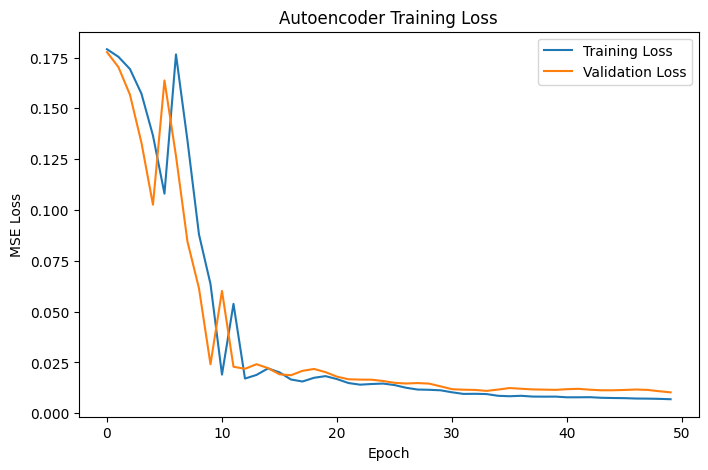

In [ ]:
import os
import numpy as np
import cv2
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras import layers, models

# === Step 1: Load Healthy Brain Images ===

def load_images_from_paths(image_paths, img_size=(256, 256)):
    images = []
    for path in image_paths:
        img = cv2.imread(path, cv2.IMREAD_GRAYSCALE)
        if img is not None:
            img = cv2.resize(img, img_size)
            img = img.astype('float32') / 255.0  # Normalize to 0-1
            img = np.expand_dims(img, axis=-1)  # Add channel dimension
            images.append(img)
    return np.array(images)

# Example: list your healthy brain images here
healthy_paths = [
    '/content/ct1.png',
    '/content/ct2.png',
    '/content/ct3.png',
    '/content/ct4.png'
]

healthy_images = load_images_from_paths(healthy_paths)

# Split into training and validation sets (80% train, 20% validation)
split_idx = int(0.8 * len(healthy_images))
healthy_train_data = healthy_images[:split_idx]
healthy_val_data = healthy_images[split_idx:]

print("Training set shape:", healthy_train_data.shape)
print("Validation set shape:", healthy_val_data.shape)


# === Step 2: Build the Autoencoder Model ===

def build_autoencoder():
    input_img = layers.Input(shape=(256, 256, 1))

    # Encoder
    x = layers.Conv2D(32, (3,3), activation='relu', padding='same')(input_img)
    x = layers.MaxPooling2D((2,2), padding='same')(x)

    x = layers.Conv2D(64, (3,3), activation='relu', padding='same')(x)
    x = layers.MaxPooling2D((2,2), padding='same')(x)

    x = layers.Conv2D(128, (3,3), activation='relu', padding='same')(x)
    encoded = layers.MaxPooling2D((2,2), padding='same')(x)

    # Decoder
    x = layers.Conv2D(128, (3,3), activation='relu', padding='same')(encoded)
    x = layers.UpSampling2D((2,2))(x)

    x = layers.Conv2D(64, (3,3), activation='relu', padding='same')(x)
    x = layers.UpSampling2D((2,2))(x)

    x = layers.Conv2D(32, (3,3), activation='relu', padding='same')(x)
    x = layers.UpSampling2D((2,2))(x)

    decoded = layers.Conv2D(1, (3,3), activation='sigmoid', padding='same')(x)

    autoencoder = models.Model(input_img, decoded)
    autoencoder.compile(optimizer='adam', loss='mse')
    return autoencoder

autoencoder = build_autoencoder()
autoencoder.summary()


# === Step 3: Train the Autoencoder ===

history = autoencoder.fit(
    healthy_train_data, healthy_train_data,  # Train model to reconstruct healthy brains
    epochs=50,
    batch_size=16,
    shuffle=True,
    validation_data=(healthy_val_data, healthy_val_data)
)


# === Step 4: Plot Loss Curve ===

plt.figure(figsize=(8,5))
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('MSE Loss')
plt.legend()
plt.title('Autoencoder Training Loss')
plt.show()


In [ ]:
# === Step 4a: Load Glioma (Infected) Brain Images ===

# Example glioma image paths
glioma_paths = [
    '/content/b1.png',
    '/content/b2.png',
    '/content/b3.png'
]

# Load them just like healthy ones
glioma_images = load_images_from_paths(glioma_paths)

print("Glioma test set shape:", glioma_images.shape)


# === Step 4b: Predict / Reconstruct Using Autoencoder ===

# Let the autoencoder reconstruct the glioma images
reconstructed = autoencoder.predict(glioma_images)

# === Step 4c: Calculate Reconstruction Error ===

# Mean Squared Error for each image
errors = np.mean((glioma_images - reconstructed) ** 2, axis=(1,2,3))

# Set a simple anomaly threshold based on healthy validation loss
# You can choose this based on your healthy validation loss curve
threshold = np.mean(history.history['val_loss']) * 1.5  # You can adjust this

print("\nAnomaly Detection Results:")
for i, error in enumerate(errors):
    if error > threshold:
        print(f"Image {i+1}: 🚨 Anomaly Detected! (Error: {error:.6f})")
    else:
        print(f"Image {i+1}: ✅ Likely Healthy (Error: {error:.6f})")


# === Step 4d: Visualize Actual vs Reconstruction ===

import matplotlib.pyplot as plt

for i in range(len(glioma_images)):
    fig, axes = plt.subplots(1, 2, figsize=(6, 3))

    axes[0].imshow(glioma_images[i].squeeze(), cmap='gray')
    axes[0].set_title('Original Input')

    axes[1].imshow(reconstructed[i].squeeze(), cmap='gray')
    axes[1].set_title('Autoencoder Output')

    plt.suptitle(f"Error: {errors[i]:.6f}")
    plt.show()


Glioma test set shape: (0,)


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/epoch_iterator.py:151: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


ValueError: math domain error

✅ Healthy images shape: (4, 256, 256, 1)
✅ Glioma images shape: (3, 256, 256, 1)
Healthy train: (3, 256, 256, 1)
Healthy val: (1, 256, 256, 1)


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 256, 256, 1)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 256, 256, 32)   │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 128, 128, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 128, 128, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 64, 64, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 64, 64, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 32, 32, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_8 (Conv2D)               │ (None, 32, 32, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d_2 (UpSampling2D)  │ (None, 64, 64, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_9 (Conv2D)               │ (None, 64, 64, 64)     │        73,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d_3 (UpSampling2D)  │ (None, 128, 128, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_10 (Conv2D)              │ (None, 128, 128, 32)   │        18,464 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d_4 (UpSampling2D)  │ (None, 256, 256, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_11 (Conv2D)              │ (None, 256, 256, 1)    │           289 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 332,801 (1.27 MB)

 Trainable params: 332,801 (1.27 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step - loss: 0.1786 - val_loss: 0.1776
Epoch 2/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step - loss: 0.1755 - val_loss: 0.1697
Epoch 3/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - loss: 0.1691 - val_loss: 0.1558
Epoch 4/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - loss: 0.1585 - val_loss: 0.1358
Epoch 5/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - loss: 0.1398 - val_loss: 0.1048
Epoch 6/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - loss: 0.1115 - val_loss: 0.0707
Epoch 7/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - loss: 0.0761 - val_loss: 0.1287
Epoch 8/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.1344 - val_loss: 0.0332
Epoch 9/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.0324 - val_loss: 0.0249
Epoch 10/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - loss: 0.0222 - val_loss: 0.0679
Epoch 11/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - loss: 0.0626 - val_loss: 0.0281
Epoch 12/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - loss: 0.0259 - val_loss: 0.0384
Epoch 13/50
1/1 ━━━━━━━━━

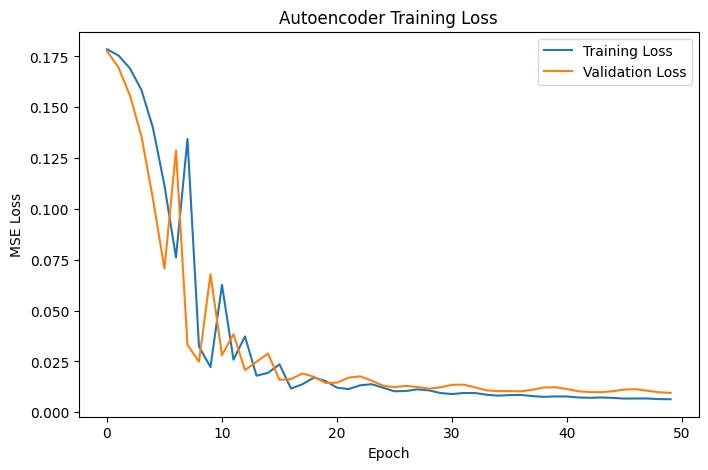

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 504ms/step

🔍 Anomaly Detection Results:
Image 1: ✅ Likely Healthy (Reconstruction Error: 0.046544)
Image 2: ✅ Likely Healthy (Reconstruction Error: 0.047322)
Image 3: ✅ Likely Healthy (Reconstruction Error: 0.049246)


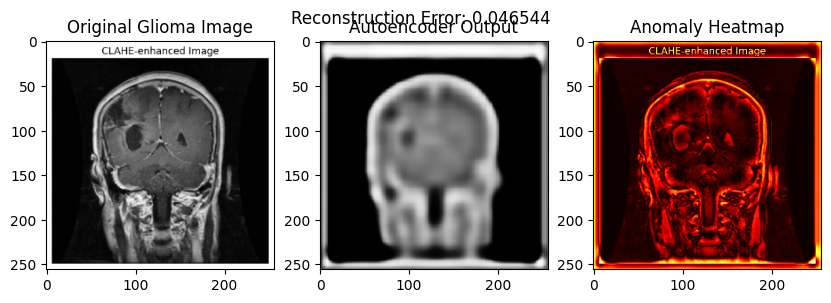

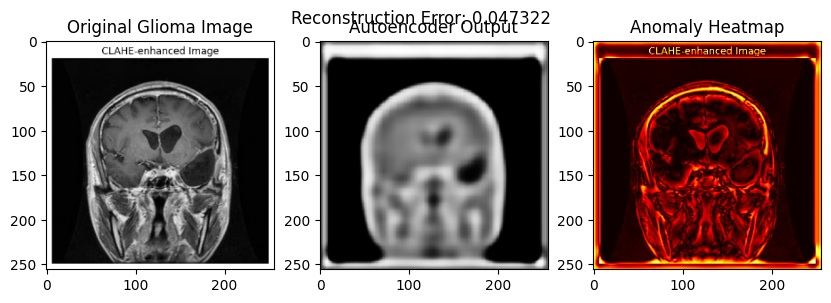

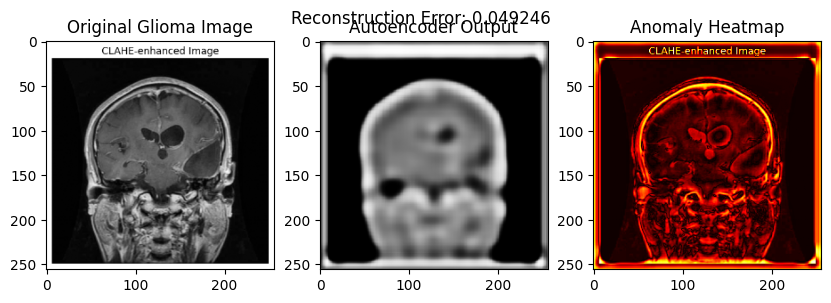

In [ ]:
import os
import numpy as np
import cv2
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras import layers, models

# === Step 1: Load Images ===

def load_images_from_paths(image_paths, img_size=(256, 256)):
    images = []
    for path in image_paths:
        if os.path.exists(path):
            img = cv2.imread(path, cv2.IMREAD_GRAYSCALE)  # read as grayscale
            if img is not None:
                img = cv2.resize(img, img_size)
                img = img.astype('float32') / 255.0  # normalize
                img = np.expand_dims(img, axis=-1)  # add channel
                images.append(img)
            else:
                print(f"⚠️ Could not load image: {path}")
        else:
            print(f"❌ File not found: {path}")
    return np.array(images)

# Replace with your real image paths
healthy_paths = [
    '/content/ct1.png',
    '/content/ct2.png',
    '/content/ct3.png',
    '/content/ct4.png'
]

glioma_paths = [
    '/content/brags pre1.png',
    '/content/brags pre2.png',
    '/content/brags pre3.png'
]

# Load images
healthy_images = load_images_from_paths(healthy_paths)
glioma_images = load_images_from_paths(glioma_paths)

# Check shapes
print("✅ Healthy images shape:", healthy_images.shape)
print("✅ Glioma images shape:", glioma_images.shape)

# If glioma_images is empty, stop the script
if glioma_images.shape[0] == 0:
    raise ValueError("❌ No glioma images loaded! Check your file paths.")

# Split healthy data
split_idx = int(0.8 * len(healthy_images))
healthy_train_data = healthy_images[:split_idx]
healthy_val_data = healthy_images[split_idx:]

print("Healthy train:", healthy_train_data.shape)
print("Healthy val:", healthy_val_data.shape)


# === Step 2: Build Autoencoder Model ===

def build_autoencoder():
    input_img = layers.Input(shape=(256, 256, 1))

    # Encoder
    x = layers.Conv2D(32, (3,3), activation='relu', padding='same')(input_img)
    x = layers.MaxPooling2D((2,2), padding='same')(x)
    x = layers.Conv2D(64, (3,3), activation='relu', padding='same')(x)
    x = layers.MaxPooling2D((2,2), padding='same')(x)
    x = layers.Conv2D(128, (3,3), activation='relu', padding='same')(x)
    encoded = layers.MaxPooling2D((2,2), padding='same')(x)

    # Decoder
    x = layers.Conv2D(128, (3,3), activation='relu', padding='same')(encoded)
    x = layers.UpSampling2D((2,2))(x)
    x = layers.Conv2D(64, (3,3), activation='relu', padding='same')(x)
    x = layers.UpSampling2D((2,2))(x)
    x = layers.Conv2D(32, (3,3), activation='relu', padding='same')(x)
    x = layers.UpSampling2D((2,2))(x)
    decoded = layers.Conv2D(1, (3,3), activation='sigmoid', padding='same')(x)

    autoencoder = models.Model(input_img, decoded)
    autoencoder.compile(optimizer='adam', loss='mse')
    return autoencoder

autoencoder = build_autoencoder()
autoencoder.summary()


# === Step 3: Train Autoencoder ===

history = autoencoder.fit(
    healthy_train_data, healthy_train_data,
    epochs=50,
    batch_size=16,
    shuffle=True,
    validation_data=(healthy_val_data, healthy_val_data)
)


# === Step 4: Plot Training Loss ===

plt.figure(figsize=(8,5))
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('MSE Loss')
plt.legend()
plt.title('Autoencoder Training Loss')
plt.show()


# === Step 5: Anomaly Detection on Glioma Images ===

reconstructed = autoencoder.predict(glioma_images)

# Calculate Mean Squared Error per image
errors = np.mean((glioma_images - reconstructed) ** 2, axis=(1,2,3))
threshold = np.mean(history.history['val_loss']) * 1.5  # adjust as needed

print("\n🔍 Anomaly Detection Results:")
for i, error in enumerate(errors):
    status = "🚨 Anomaly Detected!" if error > threshold else "✅ Likely Healthy"
    print(f"Image {i+1}: {status} (Reconstruction Error: {error:.6f})")


# === Step 6: Visualize Anomaly Heatmaps ===

for i in range(len(glioma_images)):
    difference_map = np.abs(glioma_images[i].squeeze() - reconstructed[i].squeeze())

    fig, axes = plt.subplots(1, 3, figsize=(10, 3))

    axes[0].imshow(glioma_images[i].squeeze(), cmap='gray')
    axes[0].set_title('Original Glioma Image')

    axes[1].imshow(reconstructed[i].squeeze(), cmap='gray')
    axes[1].set_title('Autoencoder Output')

    axes[2].imshow(difference_map, cmap='hot')
    axes[2].set_title('Anomaly Heatmap')

    plt.suptitle(f"Reconstruction Error: {errors[i]:.6f}")
    plt.show()



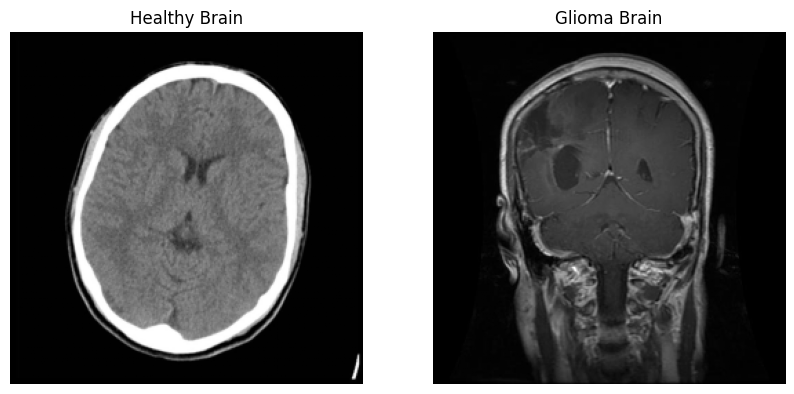

Healthy Image Shape: (256, 256, 1)
Glioma Image Shape: (256, 256, 1)


In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

# Function to load a single image
def load_single_image(image_path, img_size=(256, 256)):
    img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)  # For medical images, use appropriate library if needed (e.g., nibabel for NIfTI)
    img = cv2.resize(img, img_size)  # Resize to desired size
    img = img.astype('float32') / 255.0  # Normalize the image
    img = np.expand_dims(img, axis=-1)  # Add a channel dimension if it's grayscale
    return img

# Example paths to your images (change to your actual paths)
healthy_image_path = '/content/ct1.png'
glioma_image_path = '/content/Tr-gl_0010.jpg'

# Load the images
healthy_image = load_single_image(healthy_image_path)
glioma_image = load_single_image(glioma_image_path)

# Display the images to verify
plt.figure(figsize=(10, 5))

# Plot healthy image
plt.subplot(1, 2, 1)
plt.imshow(healthy_image.squeeze(), cmap='gray')
plt.title('Healthy Brain')
plt.axis('off')

# Plot glioma image
plt.subplot(1, 2, 2)
plt.imshow(glioma_image.squeeze(), cmap='gray')
plt.title('Glioma Brain')
plt.axis('off')

plt.show()

# Print shapes of the loaded images
print(f'Healthy Image Shape: {healthy_image.shape}')
print(f'Glioma Image Shape: {glioma_image.shape}')


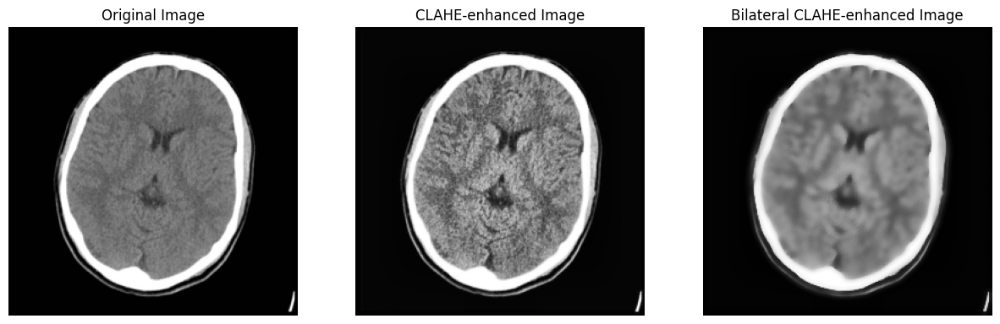

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Function to apply CLAHE to an image
def apply_clahe(image, clip_limit=2.0, tile_grid_size=(8, 8)):
    # Convert the image to grayscale if it is not already
    if len(image.shape) > 2:
        image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Convert image to uint8 for CLAHE
    image = np.uint8(image * 255)  # Convert the float32 image to uint8 [0, 255]

    # Create CLAHE object with specified clip limit and tile grid size
    clahe = cv2.createCLAHE(clipLimit=clip_limit, tileGridSize=tile_grid_size)

    # Apply CLAHE
    clahe_image = clahe.apply(image)

    return clahe_image

# Function to apply Bilateral CLAHE
def apply_bilateral_clahe(image, clip_limit=2.0, tile_grid_size=(8, 8), d=9, sigma_color=75, sigma_space=75):
    # First apply CLAHE
    clahe_image = apply_clahe(image, clip_limit, tile_grid_size)

    # Then apply bilateral filter to the CLAHE-enhanced image
    bilateral_image = cv2.bilateralFilter(clahe_image, d, sigma_color, sigma_space)

    return bilateral_image

# Function to load and preprocess a single image
def load_single_image(image_path, img_size=(256, 256)):
    img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)  # Read image in grayscale
    img = cv2.resize(img, img_size)  # Resize to desired size
    img = img.astype('float32') / 255.0  # Normalize the image to [0, 1]
    img = np.expand_dims(img, axis=-1)  # Add channel dimension
    return img

# Example of loading and applying CLAHE to an image
image_path = '/content/ct1.png'  # Update with your image path
image = load_single_image(image_path)

# Apply CLAHE to the image
clahe_image = apply_clahe(image.squeeze())  # Remove extra dimension before applying CLAHE

# Apply Bilateral CLAHE to the image
bilateral_clahe_image = apply_bilateral_clahe(image.squeeze())

# Display the original, CLAHE, and Bilateral CLAHE images
plt.figure(figsize=(15, 5))

# Display original image
plt.subplot(1, 3, 1)
plt.imshow(image.squeeze(), cmap='gray')
plt.title('Original Image')
plt.axis('off')

# Display CLAHE-enhanced image
plt.subplot(1, 3, 2)
plt.imshow(clahe_image, cmap='gray')
plt.title('CLAHE-enhanced Image')
plt.axis('off')

# Display Bilateral CLAHE-enhanced image
plt.subplot(1, 3, 3)
plt.imshow(bilateral_clahe_image, cmap='gray')
plt.title('Bilateral CLAHE-enhanced Image')
plt.axis('off')

plt.show()



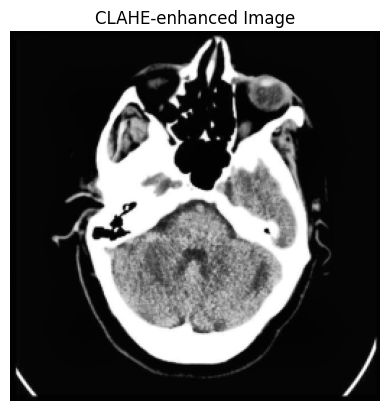

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Function to apply CLAHE to an image
def apply_clahe(image, clip_limit=2.0, tile_grid_size=(8, 8)):
    # Convert the image to grayscale if it is not already
    if len(image.shape) > 2:
        image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Convert image to uint8 for CLAHE
    image = np.uint8(image * 255)  # Convert the float32 image to uint8 [0, 255]

    # Create CLAHE object with specified clip limit and tile grid size
    clahe = cv2.createCLAHE(clipLimit=clip_limit, tileGridSize=tile_grid_size)

    # Apply CLAHE
    clahe_image = clahe.apply(image)

    return clahe_image

# Function to load and preprocess a single image
def load_single_image(image_path, img_size=(256, 256)):
    img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)  # Read image in grayscale
    img = cv2.resize(img, img_size)  # Resize to desired size
    img = img.astype('float32') / 255.0  # Normalize the image to [0, 1]
    img = np.expand_dims(img, axis=-1)  # Add channel dimension
    return img

# Example of loading and applying CLAHE to an image
image_path = '/content/ct6.png'  # Update with your image path
image = load_single_image(image_path)

# Apply CLAHE to the image
clahe_image = apply_clahe(image.squeeze())  # Remove extra dimension before applying CLAHE

# Display the CLAHE-enhanced image
plt.imshow(clahe_image, cmap='gray')
plt.title('CLAHE-enhanced Image')
plt.axis('off')
plt.show()


In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, models

# Function to create an autoencoder model
def create_autoencoder(input_shape=(256, 256, 1)):
    # Encoder
    encoder_input = layers.Input(shape=input_shape)

    x = layers.Conv2D(32, (3, 3), activation='relu', padding='same')(encoder_input)
    x = layers.MaxPooling2D((2, 2), padding='same')(x)
    x = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(x)
    x = layers.MaxPooling2D((2, 2), padding='same')(x)
    x = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(x)
    x = layers.MaxPooling2D((2, 2), padding='same')(x)

    # Bottleneck (latent space)
    bottleneck = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(x)
    bottleneck = layers.MaxPooling2D((2, 2), padding='same')(bottleneck)

    # Decoder
    x = layers.Conv2DTranspose(256, (3, 3), activation='relu', padding='same')(bottleneck)
    x = layers.UpSampling2D((2, 2))(x)
    x = layers.Conv2DTranspose(128, (3, 3), activation='relu', padding='same')(x)
    x = layers.UpSampling2D((2, 2))(x)
    x = layers.Conv2DTranspose(64, (3, 3), activation='relu', padding='same')(x)
    x = layers.UpSampling2D((2, 2))(x)
    x = layers.Conv2DTranspose(32, (3, 3), activation='relu', padding='same')(x)
    x = layers.UpSampling2D((2, 2))(x)

    # Output layer (Reconstructed image)
    decoder_output = layers.Conv2D(1, (3, 3), activation='sigmoid', padding='same')(x)

    # Create the autoencoder model
    autoencoder = models.Model(encoder_input, decoder_output)

    # Compile the model
    autoencoder.compile(optimizer='adam', loss='mean_squared_error')

    return autoencoder

# Example: create the model
autoencoder = create_autoencoder(input_shape=(256, 256, 1))

# Summary of the model architecture
autoencoder.summary()


Model: "functional_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_4 (InputLayer)      │ (None, 256, 256, 1)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_28 (Conv2D)              │ (None, 256, 256, 32)   │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_12 (MaxPooling2D) │ (None, 128, 128, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_29 (Conv2D)              │ (None, 128, 128, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_13 (MaxPooling2D) │ (None, 64, 64, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_30 (Conv2D)              │ (None, 64, 64, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_14 (MaxPooling2D) │ (None, 32, 32, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_31 (Conv2D)              │ (None, 32, 32, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_15 (MaxPooling2D) │ (None, 16, 16, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose                │ (None, 16, 16, 256)    │       590,080 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d_12 (UpSampling2D) │ (None, 32, 32, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_1              │ (None, 32, 32, 128)    │       295,040 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d_13 (UpSampling2D) │ (None, 64, 64, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_2              │ (None, 64, 64, 64)     │        73,792 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d_14 (UpSampling2D) │ (None, 128, 128, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_3              │ (None, 128, 128, 32)   │        18,464 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d_15 (UpSampling2D) │ (None, 256, 256, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_32 (Conv2D)              │ (None, 256, 256, 1)    │           289 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,365,505 (5.21 MB)

 Trainable params: 1,365,505 (5.21 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step - loss: 0.6952
Epoch 2/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 807ms/step - loss: 0.6866
Epoch 3/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - loss: 0.6759
Epoch 4/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step - loss: 0.6589
Epoch 5/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step - loss: 0.6314
Epoch 6/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step - loss: 0.5911
Epoch 7/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 617ms/step - loss: 0.5366
Epoch 8/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 617ms/step - loss: 0.4857
Epoch 9/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 636ms/step - loss: 0.6172
Epoch 10/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step - loss: 0.4487
Epoch 11/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step - loss: 0.4257
Epoch 12/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step - loss: 0.4167
Epoch 13/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step - loss: 0.4023
Epoch 14/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step - loss: 0.3645
Epoch 15/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step - loss: 0.3808
Epoch 16/50
1/1 ━━━━━━━━━

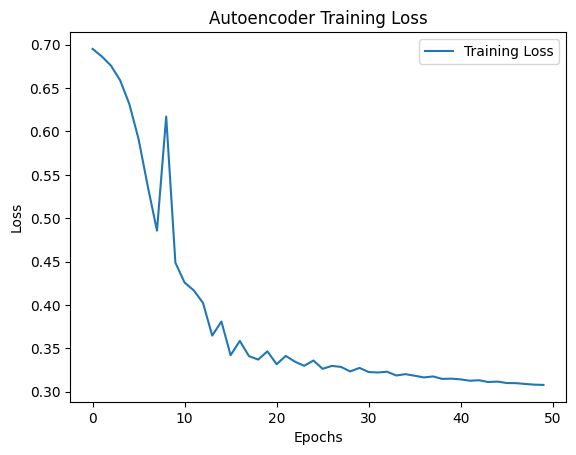

In [ ]:
import cv2
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt

# Function to load and preprocess a single image
def load_single_image(image_path, img_size=(256, 256)):
    # Load the image
    img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)  # Grayscale for simplicity
    img = cv2.resize(img, img_size)  # Resize to desired size
    img = img.astype('float32') / 255.0  # Normalize the image
    img = np.expand_dims(img, axis=-1)  # Add a channel dimension (if grayscale)
    return img

# Load your single healthy brain image
image_path = '/content/brain pre1.png'  # Path to your single image
healthy_image = load_single_image(image_path)

# Reshape it into a batch of images (required for training)
healthy_images = np.expand_dims(healthy_image, axis=0)  # Add batch dimension

# === Step 1: Build the Autoencoder Model ===
def create_autoencoder(input_shape):
    input_layer = tf.keras.layers.Input(shape=input_shape)

    # Encoder
    x = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', padding='same')(input_layer)
    x = tf.keras.layers.MaxPooling2D((2, 2), padding='same')(x)
    x = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', padding='same')(x)
    x = tf.keras.layers.MaxPooling2D((2, 2), padding='same')(x)

    # Bottleneck
    x = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', padding='same')(x)

    # Decoder
    x = tf.keras.layers.Conv2DTranspose(64, (3, 3), activation='relu', padding='same')(x)
    x = tf.keras.layers.UpSampling2D((2, 2))(x)
    x = tf.keras.layers.Conv2DTranspose(32, (3, 3), activation='relu', padding='same')(x)
    x = tf.keras.layers.UpSampling2D((2, 2))(x)

    output_layer = tf.keras.layers.Conv2D(1, (3, 3), activation='sigmoid', padding='same')(x)

    # Autoencoder model
    autoencoder = tf.keras.models.Model(input_layer, output_layer)
    autoencoder.compile(optimizer='adam', loss='binary_crossentropy')

    return autoencoder

# Create the autoencoder model
autoencoder = create_autoencoder(input_shape=(256, 256, 1))

# === Step 2: Train the Autoencoder ===
history = autoencoder.fit(
    healthy_images, healthy_images,  # input = target (unsupervised)
    epochs=50,                      # Adjust if you have more images or resources
    batch_size=1,                   # Since we are using a single image, set batch_size to 1
    shuffle=True                    # Shuffle the data during training
)

# Plot the training loss to evaluate performance
plt.plot(history.history['loss'], label='Training Loss')
plt.title('Autoencoder Training Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()





Epoch 1/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step - loss: 0.6929
Epoch 2/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.6838
Epoch 3/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.6695
Epoch 4/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step - loss: 0.6455
Epoch 5/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step - loss: 0.6073
Epoch 6/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step - loss: 0.5520
Epoch 7/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step - loss: 0.4813
Epoch 8/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step - loss: 0.4160
Epoch 9/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step - loss: 0.5437
Epoch 10/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step - loss: 0.3703
Epoch 11/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.4672
Epoch 12/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.3538
Epoch 13/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.3206
Epoch 14/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step - loss: 0.3660
Epoch 15/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step - loss: 0.2769
Epoch 16/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.3061
E

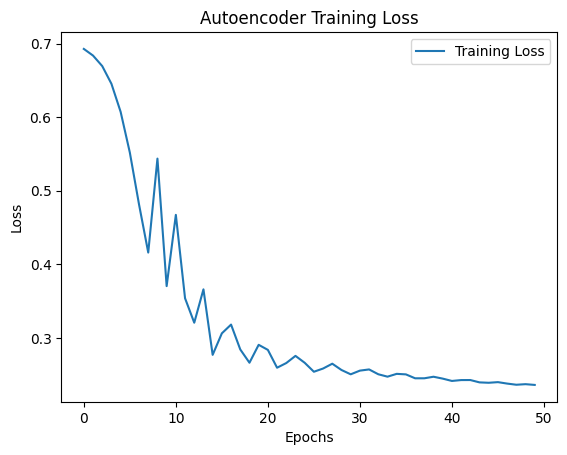

In [ ]:
import cv2
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt

# Function to load and preprocess a single image
def load_single_image(image_path, img_size=(256, 256)):
    img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)  # Read the image in grayscale
    img = cv2.resize(img, img_size)  # Resize to desired size
    img = img.astype('float32') / 255.0  # Normalize the image
    img = np.expand_dims(img, axis=-1)  # Add a channel dimension (for grayscale images)
    return img

# List of image paths (update with your actual image paths)
image_paths = [
    '/content/brain pre1.png',
    '/content/brain pre2.png',
    '/content/brain pre3.png',
    '/content/brain pre4.png',
    '/content/brain pre5.png',
    '/content/brain pre6.png'
]

# Load and preprocess all images from the list
healthy_images = np.array([load_single_image(image_path) for image_path in image_paths])

# === Step 1: Build the Autoencoder Model ===
def create_autoencoder(input_shape):
    input_layer = tf.keras.layers.Input(shape=input_shape)

    # Encoder
    x = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', padding='same')(input_layer)
    x = tf.keras.layers.MaxPooling2D((2, 2), padding='same')(x)
    x = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', padding='same')(x)
    x = tf.keras.layers.MaxPooling2D((2, 2), padding='same')(x)

    # Bottleneck
    x = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', padding='same')(x)

    # Decoder
    x = tf.keras.layers.Conv2DTranspose(64, (3, 3), activation='relu', padding='same')(x)
    x = tf.keras.layers.UpSampling2D((2, 2))(x)
    x = tf.keras.layers.Conv2DTranspose(32, (3, 3), activation='relu', padding='same')(x)
    x = tf.keras.layers.UpSampling2D((2, 2))(x)

    output_layer = tf.keras.layers.Conv2D(1, (3, 3), activation='sigmoid', padding='same')(x)

    # Autoencoder model
    autoencoder = tf.keras.models.Model(input_layer, output_layer)
    autoencoder.compile(optimizer='adam', loss='binary_crossentropy')

    return autoencoder

# Create the autoencoder model
autoencoder = create_autoencoder(input_shape=(256, 256, 1))

# === Step 2: Train the Autoencoder with Multiple Images ===
history = autoencoder.fit(
    healthy_images, healthy_images,  # input = target (unsupervised)
    epochs=50,                      # Adjust if you have more images or resources
    batch_size=16,                   # You can adjust the batch size depending on your system resources
    shuffle=True                    # Shuffle the data during training
)

# Plot the training loss to evaluate performance
plt.plot(history.history['loss'], label='Training Loss')
plt.title('Autoencoder Training Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 857ms/step


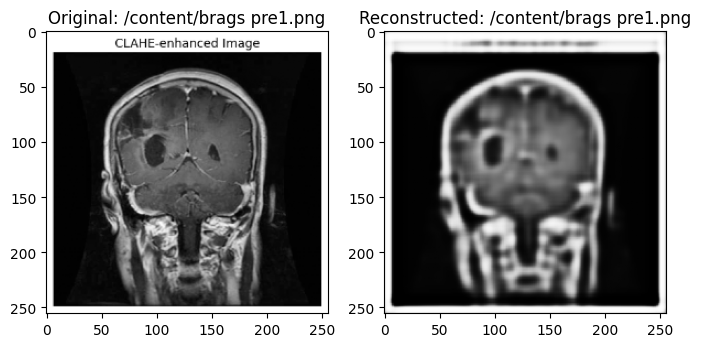

Normal image: /content/brags pre1.png


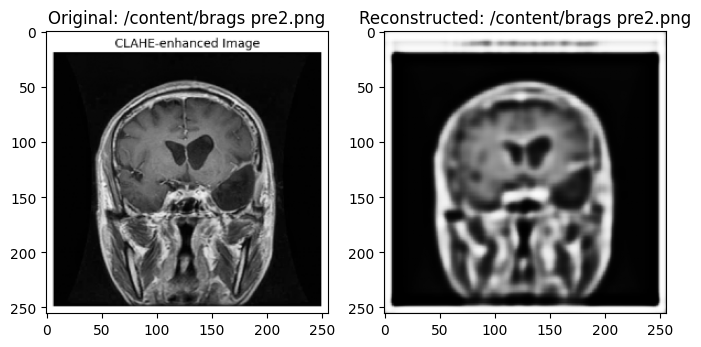

Normal image: /content/brags pre2.png


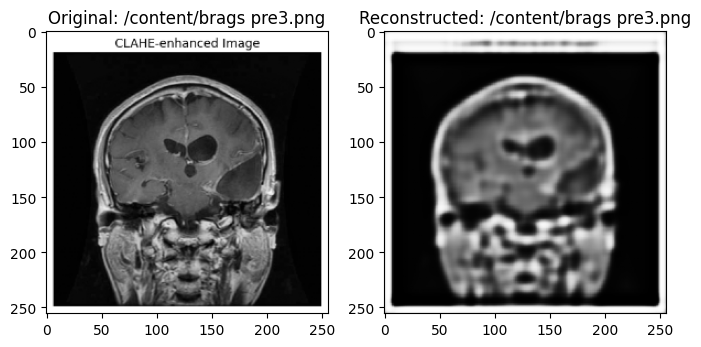

Normal image: /content/brags pre3.png


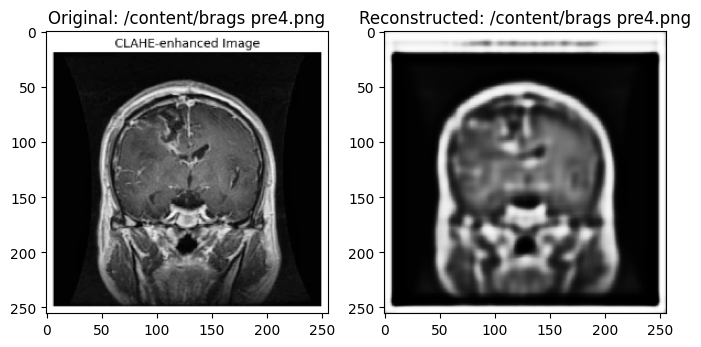

Normal image: /content/brags pre4.png


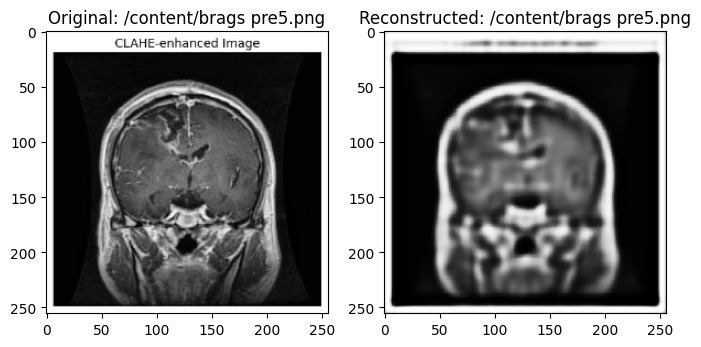

Normal image: /content/brags pre5.png


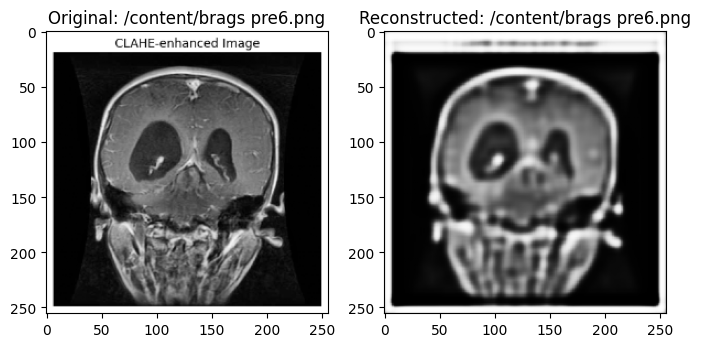

Normal image: /content/brags pre6.png


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Function to compute Mean Squared Error (MSE)
def compute_mse(original, reconstructed):
    return np.mean(np.square(original - reconstructed))

# Load a sample glioma image (replace with actual paths)
glioma_image_paths = [
    '/content/brags pre1.png',  # Replace with your glioma images
    '/content/brags pre2.png',
    '/content/brags pre3.png',
    '/content/brags pre4.png',
    '/content/brags pre5.png',
    '/content/brags pre6.png'
    # ... more paths
]

# Load and preprocess the glioma images
glioma_images = np.array([load_single_image(image_path) for image_path in glioma_image_paths])

# Predict (reconstruct) the glioma images using the trained autoencoder
reconstructed_images = autoencoder.predict(glioma_images)

# Calculate the Mean Squared Error (MSE) for each image
mse_values = [compute_mse(glioma_images[i], reconstructed_images[i]) for i in range(len(glioma_images))]

# Set a threshold for anomaly detection (you can experiment with this value)
threshold = 0.1  # This value should be chosen based on your data

# Identify anomalies (glioma detected) based on MSE
anomalies = [i for i, mse in enumerate(mse_values) if mse > threshold]

# Visualize the results
for i, img_path in enumerate(glioma_image_paths):
    plt.figure(figsize=(8, 4))
    plt.subplot(1, 2, 1)
    plt.imshow(glioma_images[i].squeeze(), cmap='gray')
    plt.title(f"Original: {img_path}")

    plt.subplot(1, 2, 2)
    plt.imshow(reconstructed_images[i].squeeze(), cmap='gray')
    plt.title(f"Reconstructed: {img_path}")

    plt.show()

    # Output whether this image is an anomaly based on MSE threshold
    if i in anomalies:
        print(f"Anomaly detected in image: {img_path}")
    else:
        print(f"Normal image: {img_path}")


Epoch 1/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 13s 13s/step - loss: 0.6927 - val_loss: 0.6749
Epoch 2/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step - loss: 0.6755 - val_loss: 0.6200
Epoch 3/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step - loss: 0.6203 - val_loss: 0.6845
Epoch 4/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step - loss: 0.6657 - val_loss: 0.6808
Epoch 5/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step - loss: 0.6616 - val_loss: 0.5852
Epoch 6/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step - loss: 0.5765 - val_loss: 0.4594
Epoch 7/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step - loss: 0.4656 - val_loss: 0.6733
Epoch 8/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step - loss: 0.6283 - val_loss: 0.4160
Epoch 9/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step - loss: 0.4111 - val_loss: 0.3791
Epoch 10/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step - loss: 0.3791 - val_loss: 0.3628
Epoch 11/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step - loss: 0.3585 - val_loss: 0.3409
Epoch 12/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step - loss: 0.3327 - val_loss: 0.3375
Epoch 13/50
1/1 ━━━━━━━

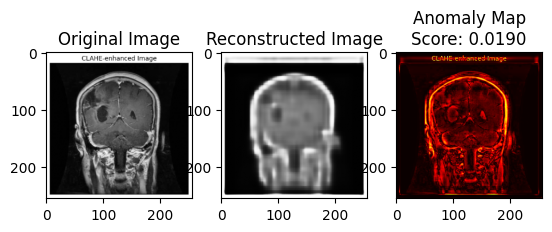

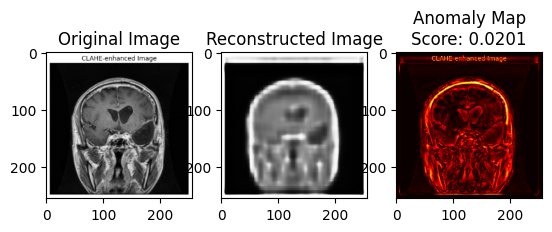

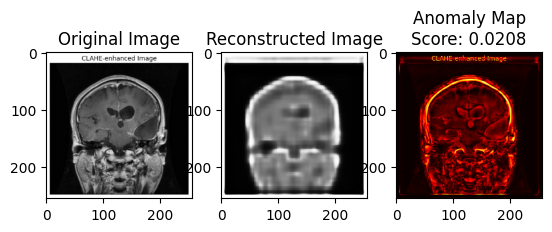

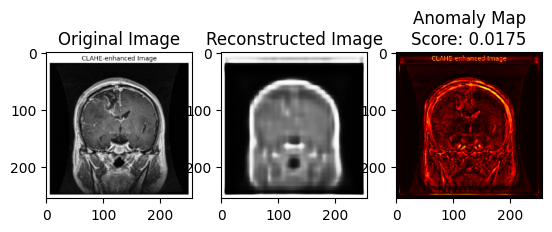

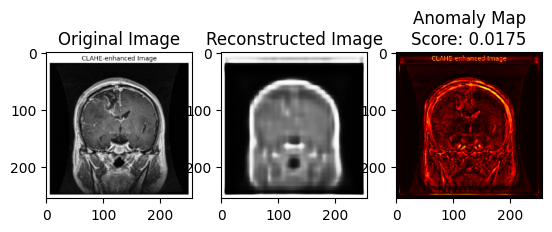

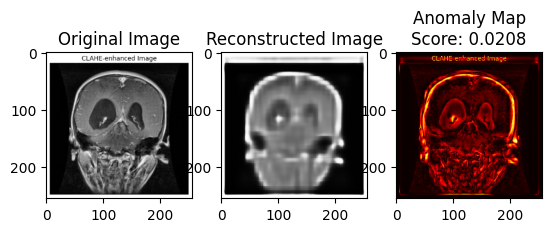

In [ ]:
import numpy as np
import cv2
import os
from tensorflow.keras import layers, models
import tensorflow as tf
from sklearn.model_selection import train_test_split
from tensorflow.keras import losses
from skimage.metrics import structural_similarity as ssim
import matplotlib.pyplot as plt

# 1. **Load and Preprocess the Images** (ensure all images are loaded and preprocessed)
def load_and_preprocess_images(image_paths, img_size=(256, 256)):
    images = []
    for image_path in image_paths:
        img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
        img = cv2.resize(img, img_size)
        img = img.astype('float32') / 255.0  # Normalize to [0,1]
        images.append(np.expand_dims(img, axis=-1))  # Add channel dimension if grayscale
    return np.array(images)

# 2. **Autoencoder Model Architecture with Increased Complexity**
def build_autoencoder(input_shape=(256, 256, 1)):
    # Encoder
    inputs = layers.Input(shape=input_shape)
    x = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(inputs)
    x = layers.MaxPooling2D((2, 2), padding='same')(x)
    x = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(x)
    x = layers.MaxPooling2D((2, 2), padding='same')(x)
    x = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(x)
    encoded = layers.MaxPooling2D((2, 2), padding='same')(x)

    # Decoder
    x = layers.Conv2DTranspose(256, (3, 3), activation='relu', padding='same')(encoded)
    x = layers.UpSampling2D((2, 2))(x)
    x = layers.Conv2DTranspose(128, (3, 3), activation='relu', padding='same')(x)
    x = layers.UpSampling2D((2, 2))(x)
    x = layers.Conv2DTranspose(64, (3, 3), activation='relu', padding='same')(x)
    decoded = layers.UpSampling2D((2, 2))(x)
    outputs = layers.Conv2D(1, (3, 3), activation='sigmoid', padding='same')(decoded)

    autoencoder = models.Model(inputs, outputs)
    autoencoder.compile(optimizer='adam', loss='binary_crossentropy')  # Use a binary cross entropy loss for image reconstruction
    return autoencoder

# 3. **SSIM Loss Function**: (optional - optional for more perceptual quality)
def ssim_loss(y_true, y_pred):
    return 1 - tf.reduce_mean(ssim(y_true, y_pred, multichannel=True))  # 1 - SSIM to minimize difference

# 4. **Train Autoencoder on Images**
def train_autoencoder(autoencoder, train_images, epochs=50, batch_size=16):
    history = autoencoder.fit(train_images, train_images, epochs=epochs, batch_size=batch_size, validation_split=0.2)
    return history

# 5. **Anomaly Detection using the Trained Autoencoder**
def detect_anomalies(autoencoder, test_images, threshold=0.1):
    reconstructed_images = autoencoder.predict(test_images)
    # Calculate the Mean Squared Error (MSE) between original and reconstructed images
    mse = np.mean(np.square(test_images - reconstructed_images), axis=(1, 2, 3))
    anomaly_scores = mse
    return anomaly_scores, reconstructed_images

# Example: Load images and preprocess (ensure your paths are correct)
healthy_image_paths = ['/content/brain pre1.png', '/content/brain pre2.png','/content/brain pre3.png','/content/brain pre4.png','/content/brain pre5.png','/content/brain pre6.png']  # Update with your healthy brain images
glioma_image_paths = ['/content/brags pre1.png', '/content/brags pre2.png','/content/brags pre3.png','/content/brags pre4.png','/content/brags pre5.png','/content/brags pre6.png']  # Update with your glioma images

healthy_images = load_and_preprocess_images(healthy_image_paths)
glioma_images = load_and_preprocess_images(glioma_image_paths)

# Train autoencoder on healthy images
autoencoder = build_autoencoder()
history = train_autoencoder(autoencoder, healthy_images)

# Detect anomalies (example with glioma images)
anomaly_scores, reconstructed_images = detect_anomalies(autoencoder, glioma_images)

# Display the results
for i in range(len(glioma_images)):
    plt.subplot(1, 3, 1)
    plt.imshow(glioma_images[i].squeeze(), cmap='gray')
    plt.title("Original Image")

    plt.subplot(1, 3, 2)
    plt.imshow(reconstructed_images[i].squeeze(), cmap='gray')
    plt.title("Reconstructed Image")

    plt.subplot(1, 3, 3)
    plt.imshow(np.abs(glioma_images[i].squeeze() - reconstructed_images[i].squeeze()), cmap='hot')
    plt.title(f"Anomaly Map\nScore: {anomaly_scores[i]:.4f}")

    plt.show()




Epoch 1/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step - loss: 0.6934 - val_loss: 0.6761
Epoch 2/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step - loss: 0.6771 - val_loss: 0.6201
Epoch 3/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step - loss: 0.6225 - val_loss: 0.6373
Epoch 4/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step - loss: 0.6194 - val_loss: 0.5899
Epoch 5/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step - loss: 0.5785 - val_loss: 0.5335
Epoch 6/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step - loss: 0.5227 - val_loss: 0.3901
Epoch 7/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step - loss: 0.3925 - val_loss: 1.0126
Epoch 8/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step - loss: 0.8811 - val_loss: 0.3539
Epoch 9/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step - loss: 0.3510 - val_loss: 0.4278
Epoch 10/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step - loss: 0.4128 - val_loss: 0.4748
Epoch 11/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step - loss: 0.4519 - val_loss: 0.4581
Epoch 12/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step - loss: 0.4360 - val_loss: 0.4179
Epoch 13/50
1/1 ━━━━━━━━━

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


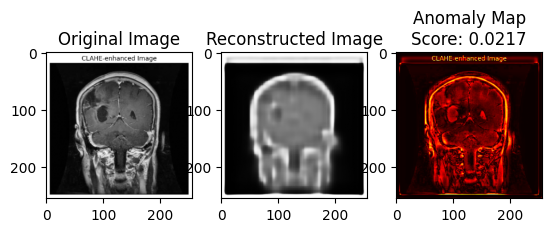

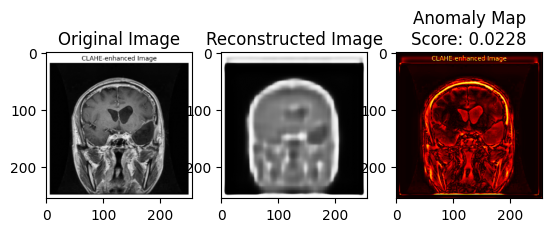

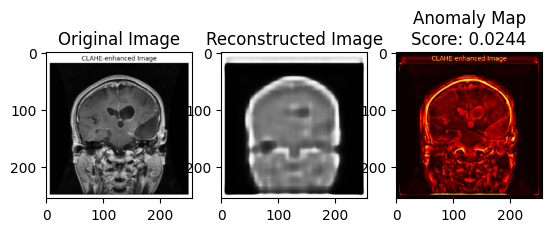

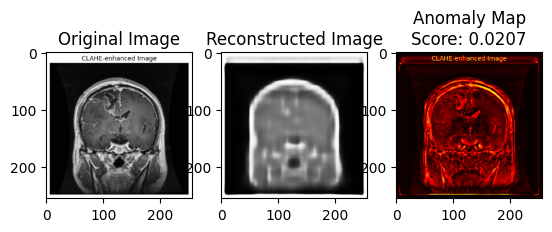

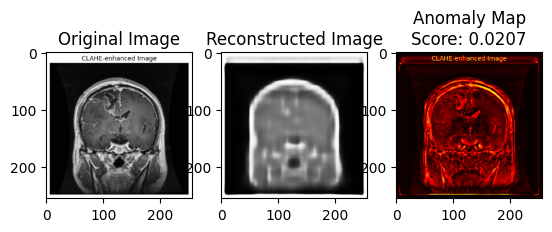

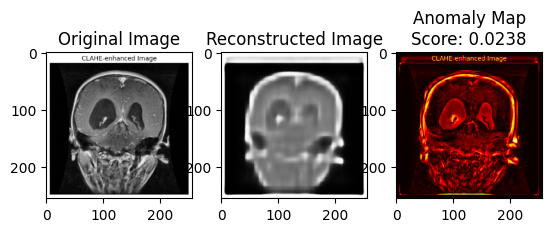

In [ ]:
import numpy as np
import cv2
import os
from tensorflow.keras import layers, models
import tensorflow as tf
from sklearn.model_selection import train_test_split
from tensorflow.keras import losses
from skimage.metrics import structural_similarity as ssim
import matplotlib.pyplot as plt

# 1. **Load and Preprocess the Images** (ensure all images are loaded and preprocessed)
def load_and_preprocess_images(image_paths, img_size=(256, 256)):
    images = []
    for image_path in image_paths:
        img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
        img = cv2.resize(img, img_size)
        img = img.astype('float32') / 255.0  # Normalize to [0,1]
        images.append(np.expand_dims(img, axis=-1))  # Add channel dimension if grayscale
    return np.array(images)

# 2. **Autoencoder Model Architecture with Increased Complexity**
def build_autoencoder(input_shape=(256, 256, 1)):
    # Encoder
    inputs = layers.Input(shape=input_shape)
    x = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(inputs)
    x = layers.MaxPooling2D((2, 2), padding='same')(x)
    x = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(x)
    x = layers.MaxPooling2D((2, 2), padding='same')(x)
    x = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(x)
    encoded = layers.MaxPooling2D((2, 2), padding='same')(x)

    # Decoder
    x = layers.Conv2DTranspose(256, (3, 3), activation='relu', padding='same')(encoded)
    x = layers.UpSampling2D((2, 2))(x)
    x = layers.Conv2DTranspose(128, (3, 3), activation='relu', padding='same')(x)
    x = layers.UpSampling2D((2, 2))(x)
    x = layers.Conv2DTranspose(64, (3, 3), activation='relu', padding='same')(x)
    decoded = layers.UpSampling2D((2, 2))(x)
    outputs = layers.Conv2D(1, (3, 3), activation='sigmoid', padding='same')(decoded)

    autoencoder = models.Model(inputs, outputs)
    autoencoder.compile(optimizer='adam', loss='binary_crossentropy')  # Use a binary cross entropy loss for image reconstruction
    return autoencoder

# 3. **SSIM Loss Function**: (optional - optional for more perceptual quality)
def ssim_loss(y_true, y_pred):
    return 1 - tf.reduce_mean(ssim(y_true, y_pred, multichannel=True))  # 1 - SSIM to minimize difference

# 4. **Train Autoencoder on Images**
def train_autoencoder(autoencoder, train_images, epochs=50, batch_size=16):
    history = autoencoder.fit(train_images, train_images, epochs=epochs, batch_size=batch_size, validation_split=0.2)
    return history

# 5. **Anomaly Detection using the Trained Autoencoder**
def detect_anomalies(autoencoder, test_images, threshold=0.1):
    reconstructed_images = autoencoder.predict(test_images)
    # Calculate the Mean Squared Error (MSE) between original and reconstructed images
    mse = np.mean(np.square(test_images - reconstructed_images), axis=(1, 2, 3))
    anomaly_scores = mse
    return anomaly_scores, reconstructed_images

# Example: Load images and preprocess (ensure your paths are correct)
healthy_image_paths = ['/content/brain pre1.png', '/content/brain pre2.png','/content/brain pre3.png','/content/brain pre4.png','/content/brain pre5.png','/content/brain pre6.png']  # Update with your healthy brain images
glioma_image_paths = ['/content/brags pre1.png', '/content/brags pre2.png','/content/brags pre3.png','/content/brags pre4.png','/content/brags pre5.png','/content/brags pre6.png']  # Update with your glioma images

healthy_images = load_and_preprocess_images(healthy_image_paths)
glioma_images = load_and_preprocess_images(glioma_image_paths)

# Train autoencoder on healthy images
autoencoder = build_autoencoder()
history = train_autoencoder(autoencoder, healthy_images)

# Detect anomalies (example with glioma images)
anomaly_scores, reconstructed_images = detect_anomalies(autoencoder, glioma_images)

# Display the results
for i in range(len(glioma_images)):
    plt.subplot(1, 3, 1)
    plt.imshow(glioma_images[i].squeeze(), cmap='gray')
    plt.title("Original Image")

    plt.subplot(1, 3, 2)
    plt.imshow(reconstructed_images[i].squeeze(), cmap='gray')
    plt.title("Reconstructed Image")

    plt.subplot(1, 3, 3)
    plt.imshow(np.abs(glioma_images[i].squeeze() - reconstructed_images[i].squeeze()), cmap='hot')
    plt.title(f"Anomaly Map\nScore: {anomaly_scores[i]:.4f}")

    plt.show()

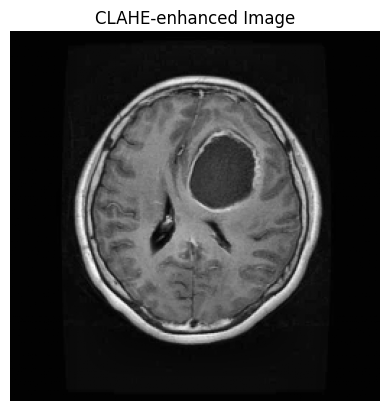

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Function to apply CLAHE to an image
def apply_clahe(image, clip_limit=2.0, tile_grid_size=(8, 8)):
    # Convert the image to grayscale if it is not already
    if len(image.shape) > 2:
        image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Convert image to uint8 for CLAHE
    image = np.uint8(image * 255)  # Convert the float32 image to uint8 [0, 255]

    # Create CLAHE object with specified clip limit and tile grid size
    clahe = cv2.createCLAHE(clipLimit=clip_limit, tileGridSize=tile_grid_size)

    # Apply CLAHE
    clahe_image = clahe.apply(image)

    return clahe_image

# Function to load and preprocess a single image
def load_single_image(image_path, img_size=(256, 256)):
    img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)  # Read image in grayscale
    img = cv2.resize(img, img_size)  # Resize to desired size
    img = img.astype('float32') / 255.0  # Normalize the image to [0, 1]
    img = np.expand_dims(img, axis=-1)  # Add channel dimension
    return img

# Example of loading and applying CLAHE to an image
image_path = '/content/Tr-gl_0055.jpg' # Update with your image path
image = load_single_image(image_path)

# Apply CLAHE to the image
clahe_image = apply_clahe(image.squeeze())  # Remove extra dimension before applying CLAHE

# Display the CLAHE-enhanced image
plt.imshow(clahe_image, cmap='gray')
plt.title('CLAHE-enhanced Image')
plt.axis('off')
plt.show()


In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, models

# Function to create an autoencoder model
def create_autoencoder(input_shape=(256, 256, 1)):
    # Encoder
    encoder_input = layers.Input(shape=input_shape)

    x = layers.Conv2D(32, (3, 3), activation='relu', padding='same')(encoder_input)
    x = layers.MaxPooling2D((2, 2), padding='same')(x)
    x = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(x)
    x = layers.MaxPooling2D((2, 2), padding='same')(x)
    x = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(x)
    x = layers.MaxPooling2D((2, 2), padding='same')(x)

    # Bottleneck (latent space)
    bottleneck = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(x)
    bottleneck = layers.MaxPooling2D((2, 2), padding='same')(bottleneck)

    # Decoder
    x = layers.Conv2DTranspose(256, (3, 3), activation='relu', padding='same')(bottleneck)
    x = layers.UpSampling2D((2, 2))(x)
    x = layers.Conv2DTranspose(128, (3, 3), activation='relu', padding='same')(x)
    x = layers.UpSampling2D((2, 2))(x)
    x = layers.Conv2DTranspose(64, (3, 3), activation='relu', padding='same')(x)
    x = layers.UpSampling2D((2, 2))(x)
    x = layers.Conv2DTranspose(32, (3, 3), activation='relu', padding='same')(x)
    x = layers.UpSampling2D((2, 2))(x)

    # Output layer (Reconstructed image)
    decoder_output = layers.Conv2D(1, (3, 3), activation='sigmoid', padding='same')(x)

    # Create the autoencoder model
    autoencoder = models.Model(encoder_input, decoder_output)

    # Compile the model
    autoencoder.compile(optimizer='adam', loss='mean_squared_error')

    return autoencoder

# Example: create the model
autoencoder = create_autoencoder(input_shape=(256, 256, 1))

# Summary of the model architecture
autoencoder.summary()


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 256, 256, 1)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 256, 256, 32)   │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 128, 128, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 128, 128, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 64, 64, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 64, 64, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 32, 32, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 32, 32, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 16, 16, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose                │ (None, 16, 16, 256)    │       590,080 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d (UpSampling2D)    │ (None, 32, 32, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_1              │ (None, 32, 32, 128)    │       295,040 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d_1 (UpSampling2D)  │ (None, 64, 64, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_2              │ (None, 64, 64, 64)     │        73,792 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d_2 (UpSampling2D)  │ (None, 128, 128, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_3              │ (None, 128, 128, 32)   │        18,464 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d_3 (UpSampling2D)  │ (None, 256, 256, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 256, 256, 1)    │           289 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,365,505 (5.21 MB)

 Trainable params: 1,365,505 (5.21 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step - loss: 0.6934
Epoch 2/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 566ms/step - loss: 0.6837
Epoch 3/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 585ms/step - loss: 0.6690
Epoch 4/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 593ms/step - loss: 0.6450
Epoch 5/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step - loss: 0.6143
Epoch 6/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step - loss: 0.5724
Epoch 7/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step - loss: 0.5203
Epoch 8/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step - loss: 0.5107
Epoch 9/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 649ms/step - loss: 0.5270
Epoch 10/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step - loss: 0.4176
Epoch 11/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 631ms/step - loss: 0.4487
Epoch 12/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step - loss: 0.3591
Epoch 13/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step - loss: 0.4272
Epoch 14/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 617ms/step - loss: 0.3198
Epoch 15/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 630ms/step - loss: 0.3524
Epoch 16/50
1/1 ━━━━━━

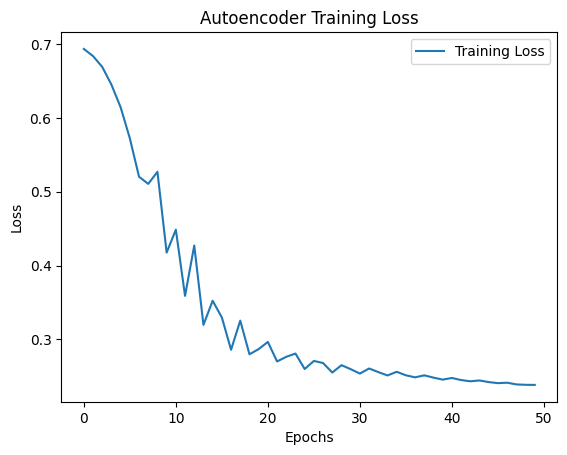

In [ ]:
import cv2
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt

# Function to load and preprocess a single image
def load_single_image(image_path, img_size=(256, 256)):
    # Load the image
    img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)  # Grayscale for simplicity
    img = cv2.resize(img, img_size)  # Resize to desired size
    img = img.astype('float32') / 255.0  # Normalize the image
    img = np.expand_dims(img, axis=-1)  # Add a channel dimension (if grayscale)
    return img

# Load your single healthy brain image
image_path = '/content/brain pre6.png'  # Path to your single image
healthy_image = load_single_image(image_path)

# Reshape it into a batch of images (required for training)
healthy_images = np.expand_dims(healthy_image, axis=0)  # Add batch dimension

# === Step 1: Build the Autoencoder Model ===
def create_autoencoder(input_shape):
    input_layer = tf.keras.layers.Input(shape=input_shape)

    # Encoder
    x = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', padding='same')(input_layer)
    x = tf.keras.layers.MaxPooling2D((2, 2), padding='same')(x)
    x = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', padding='same')(x)
    x = tf.keras.layers.MaxPooling2D((2, 2), padding='same')(x)

    # Bottleneck
    x = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', padding='same')(x)

    # Decoder
    x = tf.keras.layers.Conv2DTranspose(64, (3, 3), activation='relu', padding='same')(x)
    x = tf.keras.layers.UpSampling2D((2, 2))(x)
    x = tf.keras.layers.Conv2DTranspose(32, (3, 3), activation='relu', padding='same')(x)
    x = tf.keras.layers.UpSampling2D((2, 2))(x)

    output_layer = tf.keras.layers.Conv2D(1, (3, 3), activation='sigmoid', padding='same')(x)

    # Autoencoder model
    autoencoder = tf.keras.models.Model(input_layer, output_layer)
    autoencoder.compile(optimizer='adam', loss='binary_crossentropy')

    return autoencoder

# Create the autoencoder model
autoencoder = create_autoencoder(input_shape=(256, 256, 1))

# === Step 2: Train the Autoencoder ===
history = autoencoder.fit(
    healthy_images, healthy_images,  # input = target (unsupervised)
    epochs=50,                      # Adjust if you have more images or resources
    batch_size=1,                   # Since we are using a single image, set batch_size to 1
    shuffle=True                    # Shuffle the data during training
)

# Plot the training loss to evaluate performance
plt.plot(history.history['loss'], label='Training Loss')
plt.title('Autoencoder Training Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()




✅ Found: /content/brain pre8.png
✅ Found: /content/brain pre9.png
✅ Found: /content/brain pre10.png
✅ Found: /content/brain pre11.png
✅ Found: /content/brain pre12.png
✅ Found: /content/brain pre1.png
✅ Found: /content/brain pre2.png
✅ Found: /content/brain pre3.png
✅ Found: /content/brain pre4.png
✅ Found: /content/brain pre5.png
✅ Found: /content/brain pre6.png
✅ Found: /content/ct101.png
✅ Found: /content/ct102.png
✅ Found: /content/ct103.png
✅ Found: /content/ct104.png
✅ Found: /content/ct105.png
✅ Found: /content/ct106.png
✅ Found: /content/ct111.png
✅ Found: /content/ct112.png
✅ Found: /content/ct81.png
✅ Found: /content/ct82.png
✅ Found: /content/ct83.png
✅ Found: /content/ct84.png
✅ Found: /content/ct85.png
✅ Found: /content/ct86.png
✅ Found: /content/ct91.png
✅ Found: /content/ct92.png
✅ Found: /content/ct93.png
✅ Found: /content/ct94.png
✅ Found: /content/ct95.png
✅ Found: /content/ct96.png
✅ Found: /content/ct97.png
Epoch 1/200
2/2 ━━━━━━━━━━━━━━━━━━━━ 13s 4s/step - loss: 0.

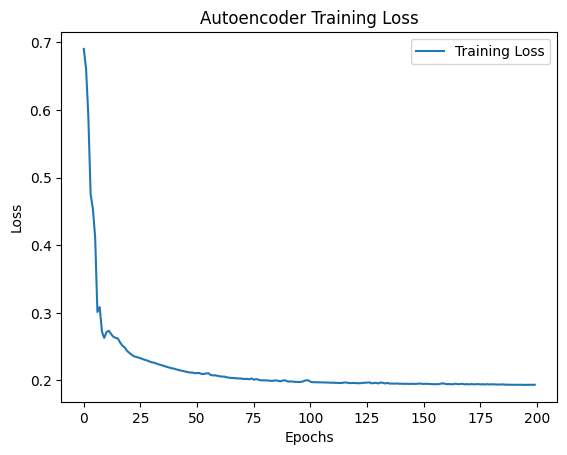

In [ ]:
import cv2
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import os

# === Step 1: Image Loading & Preprocessing ===
def load_single_image(image_path, img_size=(256, 256)):
    img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)  # Read the image in grayscale
    if img is None:
        raise FileNotFoundError(f"Image at path '{image_path}' could not be loaded. Check the path or file existence.")
    img = cv2.resize(img, img_size)  # Resize to desired size
    img = img.astype('float32') / 255.0  # Normalize the image
    img = np.expand_dims(img, axis=-1)  # Add a channel dimension (grayscale -> shape: (256, 256, 1))
    return img

# === Step 2: Define your image paths ===
image_paths = [
    '/content/brain pre8.png',
    '/content/brain pre9.png',
    '/content/brain pre10.png',
    '/content/brain pre11.png',
    '/content/brain pre12.png',
    '/content/brain pre1.png',
    '/content/brain pre2.png',
    '/content/brain pre3.png',
    '/content/brain pre4.png',
    '/content/brain pre5.png',
    '/content/brain pre6.png',
    '/content/ct101.png',
    '/content/ct102.png',
    '/content/ct103.png',
    '/content/ct104.png',
    '/content/ct105.png',
    '/content/ct106.png',
    '/content/ct111.png',
    '/content/ct112.png',
    '/content/ct81.png',
    '/content/ct82.png',
    '/content/ct83.png',
    '/content/ct84.png',
    '/content/ct85.png',
    '/content/ct86.png',
    '/content/ct91.png',
    '/content/ct92.png',
    '/content/ct93.png',
    '/content/ct94.png',
    '/content/ct95.png',
    '/content/ct96.png',
    '/content/ct97.png'

]

# === Step 3: Check if all images exist ===
for path in image_paths:
    if not os.path.exists(path):
        print(f"❌ File not found: {path}")
    else:
        print(f"✅ Found: {path}")

# === Step 4: Load and preprocess all images ===
healthy_images = np.array([load_single_image(image_path) for image_path in image_paths])

# === Step 5: Build the Autoencoder Model ===
def create_autoencoder(input_shape):
    input_layer = tf.keras.layers.Input(shape=input_shape)

    # Encoder
    x = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', padding='same')(input_layer)
    x = tf.keras.layers.MaxPooling2D((2, 2), padding='same')(x)
    x = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', padding='same')(x)
    x = tf.keras.layers.MaxPooling2D((2, 2), padding='same')(x)

    # Bottleneck
    x = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', padding='same')(x)

    # Decoder
    x = tf.keras.layers.Conv2DTranspose(64, (3, 3), activation='relu', padding='same')(x)
    x = tf.keras.layers.UpSampling2D((2, 2))(x)
    x = tf.keras.layers.Conv2DTranspose(32, (3, 3), activation='relu', padding='same')(x)
    x = tf.keras.layers.UpSampling2D((2, 2))(x)

    output_layer = tf.keras.layers.Conv2D(1, (3, 3), activation='sigmoid', padding='same')(x)

    autoencoder = tf.keras.models.Model(input_layer, output_layer)
    autoencoder.compile(optimizer='adam', loss='binary_crossentropy')

    return autoencoder

# === Step 6: Initialize the Autoencoder ===
autoencoder = create_autoencoder(input_shape=(256, 256, 1))

# === Step 7: Train the Autoencoder ===
history = autoencoder.fit(
    healthy_images, healthy_images,  # Input = Target for unsupervised training
    epochs=200,                       # You can adjust depending on your setup
    batch_size=16,                   # Adjust if you run into memory issues
    shuffle=True
)

# === Step 8: Plot Training Loss ===
plt.plot(history.history['loss'], label='Training Loss')
plt.title('Autoencoder Training Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()



1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 599ms/step
Image 1: MSE = 0.00271 --> ✅ Normal
Image 2: MSE = 0.00302 --> ✅ Normal
Image 3: MSE = 0.00244 --> ✅ Normal
Image 4: MSE = 0.00309 --> ✅ Normal
Image 5: MSE = 0.00241 --> ✅ Normal
Image 6: MSE = 0.00351 --> ✅ Normal


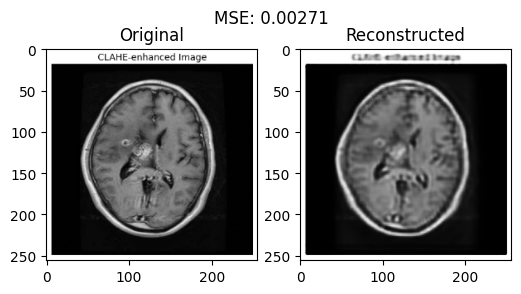

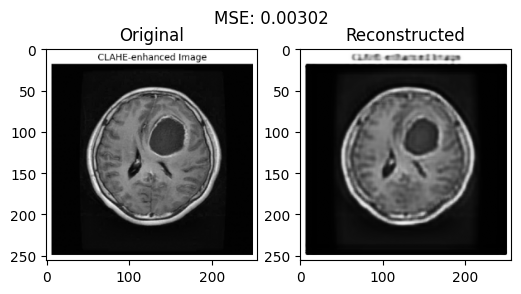

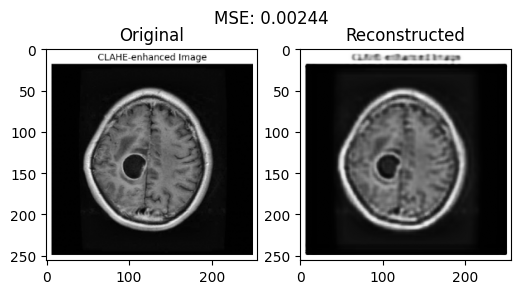

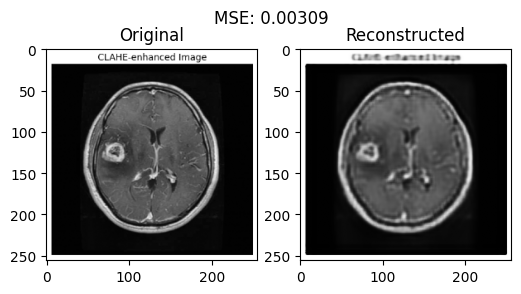

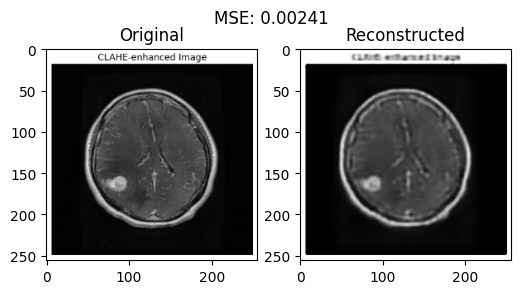

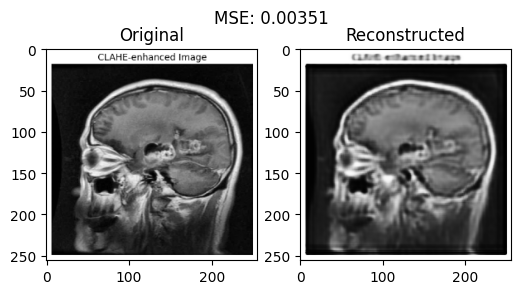

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# === Step 4: Anomaly Detection ===

# Function to compute reconstruction error (MSE)
def compute_mse(original, reconstructed):
    return np.mean((original - reconstructed) ** 2)

# === Step 4.1: Load Test Images ===
# Replace these with your "testing images" (unknown or suspected anomaly samples)
test_image_paths = [
    '/content/brags pre10.png',
    '/content/brags pre12.png',
    '/content/brags pre11.png',
    '/content/brags pre8.png',
    '/content/brags pre9.png',
    '/content/brags pre7.png'
]

# Preprocess test images
test_images = np.array([load_single_image(path) for path in test_image_paths])

# === Step 4.2: Predict Reconstructions ===
reconstructed_images = autoencoder.predict(test_images)

# === Step 4.3: Calculate MSE for each test image ===
mse_values = [compute_mse(original, reconstructed) for original, reconstructed in zip(test_images, reconstructed_images)]

# === Step 4.4: Set an Anomaly Threshold ===
threshold = 0.01  # Adjust this based on your training loss and image type

# === Step 4.5: Print Anomaly Detection Results ===
for i, mse in enumerate(mse_values):
    if mse > threshold:
        status = "⚠️ Anomaly Detected"
    else:
        status = "✅ Normal"

    print(f"Image {i+1}: MSE = {mse:.5f} --> {status}")

# === Step 4.6: (Optional) Visual Comparison ===
for i in range(len(test_images)):
    plt.figure(figsize=(6,3))

    plt.subplot(1, 2, 1)
    plt.imshow(test_images[i].squeeze(), cmap='gray')
    plt.title('Original')

    plt.subplot(1, 2, 2)
    plt.imshow(reconstructed_images[i].squeeze(), cmap='gray')
    plt.title('Reconstructed')

    plt.suptitle(f"MSE: {mse_values[i]:.5f}")
    plt.show()


Epoch 1/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step - loss: 0.6923 - val_loss: 0.6651
Epoch 2/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step - loss: 0.6666 - val_loss: 0.5744
Epoch 3/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.5763 - val_loss: 0.4950
Epoch 4/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - loss: 0.4995 - val_loss: 1.2714
Epoch 5/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - loss: 1.2098 - val_loss: 0.7746
Epoch 6/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step - loss: 0.7453 - val_loss: 0.4648
Epoch 7/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step - loss: 0.4604 - val_loss: 0.4300
Epoch 8/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step - loss: 0.4208 - val_loss: 0.4470
Epoch 9/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step - loss: 0.4259 - val_loss: 0.3872
Epoch 10/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.3704 - val_loss: 0.3551
Epoch 11/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.3442 - val_loss: 0.3442
Epoch 12/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.3354 - val_loss: 0.3405
Epoch 13/50
1/1 ━━━━━━━━━

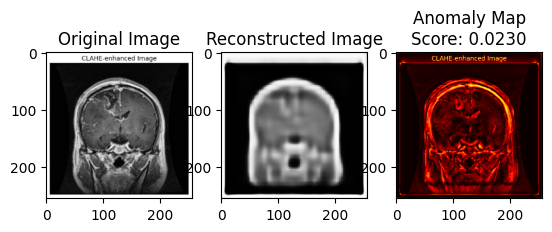

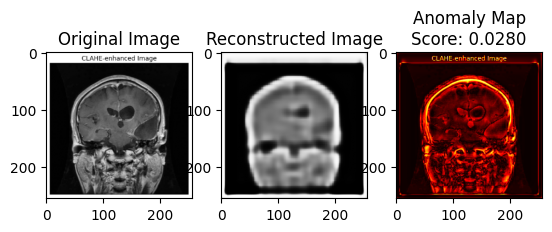

In [ ]:
import numpy as np
import cv2
import os
from tensorflow.keras import layers, models
import tensorflow as tf
from sklearn.model_selection import train_test_split
from tensorflow.keras import losses
from skimage.metrics import structural_similarity as ssim
import matplotlib.pyplot as plt

# 1. **Load and Preprocess the Images** (ensure all images are loaded and preprocessed)
def load_and_preprocess_images(image_paths, img_size=(256, 256)):
    images = []
    for image_path in image_paths:
        img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
        img = cv2.resize(img, img_size)
        img = img.astype('float32') / 255.0  # Normalize to [0,1]
        images.append(np.expand_dims(img, axis=-1))  # Add channel dimension if grayscale
    return np.array(images)

# 2. **Autoencoder Model Architecture with Increased Complexity**
def build_autoencoder(input_shape=(256, 256, 1)):
    # Encoder
    inputs = layers.Input(shape=input_shape)
    x = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(inputs)
    x = layers.MaxPooling2D((2, 2), padding='same')(x)
    x = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(x)
    x = layers.MaxPooling2D((2, 2), padding='same')(x)
    x = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(x)
    encoded = layers.MaxPooling2D((2, 2), padding='same')(x)

    # Decoder
    x = layers.Conv2DTranspose(256, (3, 3), activation='relu', padding='same')(encoded)
    x = layers.UpSampling2D((2, 2))(x)
    x = layers.Conv2DTranspose(128, (3, 3), activation='relu', padding='same')(x)
    x = layers.UpSampling2D((2, 2))(x)
    x = layers.Conv2DTranspose(64, (3, 3), activation='relu', padding='same')(x)
    decoded = layers.UpSampling2D((2, 2))(x)
    outputs = layers.Conv2D(1, (3, 3), activation='sigmoid', padding='same')(decoded)

    autoencoder = models.Model(inputs, outputs)
    autoencoder.compile(optimizer='adam', loss='binary_crossentropy')  # Use a binary cross entropy loss for image reconstruction
    return autoencoder

# 3. **SSIM Loss Function**: (optional - optional for more perceptual quality)
def ssim_loss(y_true, y_pred):
    return 1 - tf.reduce_mean(ssim(y_true, y_pred, multichannel=True))  # 1 - SSIM to minimize difference

# 4. **Train Autoencoder on Images**
def train_autoencoder(autoencoder, train_images, epochs=50, batch_size=16):
    history = autoencoder.fit(train_images, train_images, epochs=epochs, batch_size=batch_size, validation_split=0.2)
    return history

# 5. **Anomaly Detection using the Trained Autoencoder**
def detect_anomalies(autoencoder, test_images, threshold=0.1):
    reconstructed_images = autoencoder.predict(test_images)
    # Calculate the Mean Squared Error (MSE) between original and reconstructed images
    mse = np.mean(np.square(test_images - reconstructed_images), axis=(1, 2, 3))
    anomaly_scores = mse
    return anomaly_scores, reconstructed_images

# Example: Load images and preprocess (ensure your paths are correct)
healthy_image_paths =['/content/brain pre2.png','/content/brain pre3.png']  # Update with your healthy brain images
glioma_image_paths = ['/content/brags pre4.png','/content/brags pre3.png']  # Update with your glioma images

healthy_images = load_and_preprocess_images(healthy_image_paths)
glioma_images = load_and_preprocess_images(glioma_image_paths)

# Train autoencoder on healthy images
autoencoder = build_autoencoder()
history = train_autoencoder(autoencoder, healthy_images)

# Detect anomalies (example with glioma images)
anomaly_scores, reconstructed_images = detect_anomalies(autoencoder, glioma_images)

# Display the results
for i in range(len(glioma_images)):
    plt.subplot(1, 3, 1)
    plt.imshow(glioma_images[i].squeeze(), cmap='gray')
    plt.title("Original Image")

    plt.subplot(1, 3, 2)
    plt.imshow(reconstructed_images[i].squeeze(), cmap='gray')
    plt.title("Reconstructed Image")

    plt.subplot(1, 3, 3)
    plt.imshow(np.abs(glioma_images[i].squeeze() - reconstructed_images[i].squeeze()), cmap='hot')
    plt.title(f"Anomaly Map\nScore: {anomaly_scores[i]:.4f}")

    plt.show()




Epoch 1/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step - loss: 0.6922 - val_loss: 0.6674
Epoch 2/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - loss: 0.6663 - val_loss: 0.5822
Epoch 3/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step - loss: 0.5845 - val_loss: 0.4430
Epoch 4/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - loss: 0.4707 - val_loss: 3.1155
Epoch 5/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 3.6699 - val_loss: 0.3950
Epoch 6/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.4237 - val_loss: 0.6246
Epoch 7/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.6609 - val_loss: 0.6640
Epoch 8/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - loss: 0.6897 - val_loss: 0.6597
Epoch 9/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step - loss: 0.6754 - val_loss: 0.6553
Epoch 10/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step - loss: 0.6663 - val_loss: 0.6512
Epoch 11/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.6609 - val_loss: 0.6431
Epoch 12/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.6526 - val_loss: 0.6276
Epoch 13/50
1/1 ━━━━━━━━━

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 739ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 508ms/step

[INFO] Detection Threshold (based on healthy data): 0.0111

       Image  Anomaly_Score Predicted_Label
0   Glioma_1       0.017628          Glioma
1   Glioma_2       0.020089          Glioma
2  Healthy_1       0.011106          Glioma
3  Healthy_2       0.010782         Healthy

[INFO] Results saved as: anomaly_detection_results.csv


[INFO] Visualizing Glioma Images:


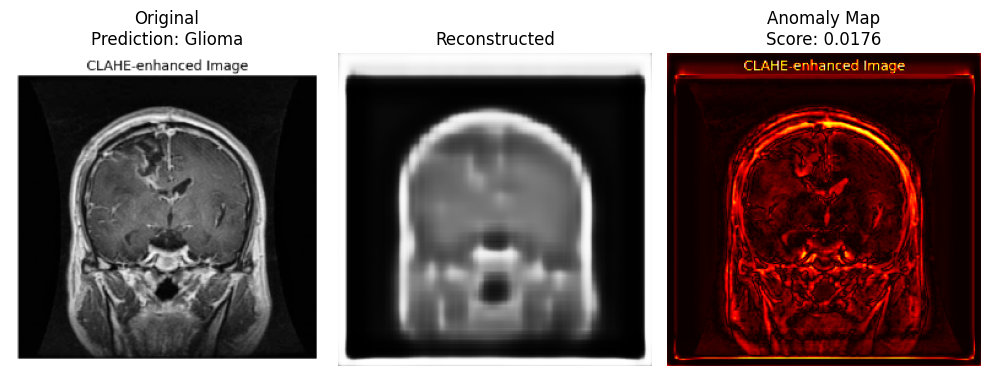

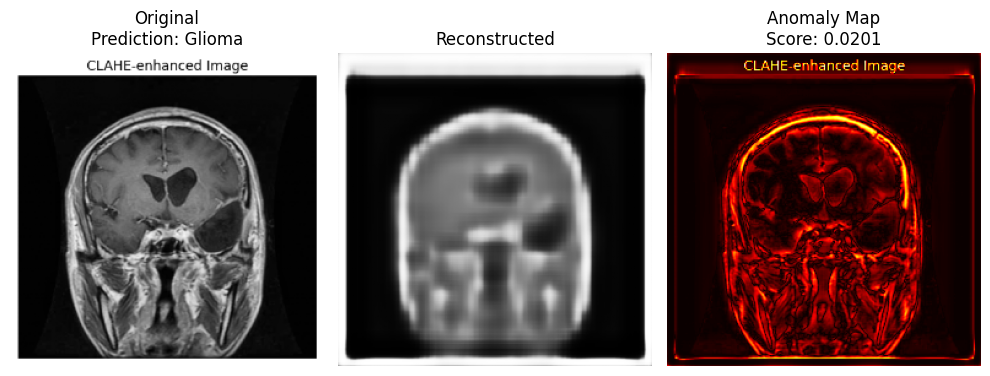


[INFO] Visualizing Healthy Images:


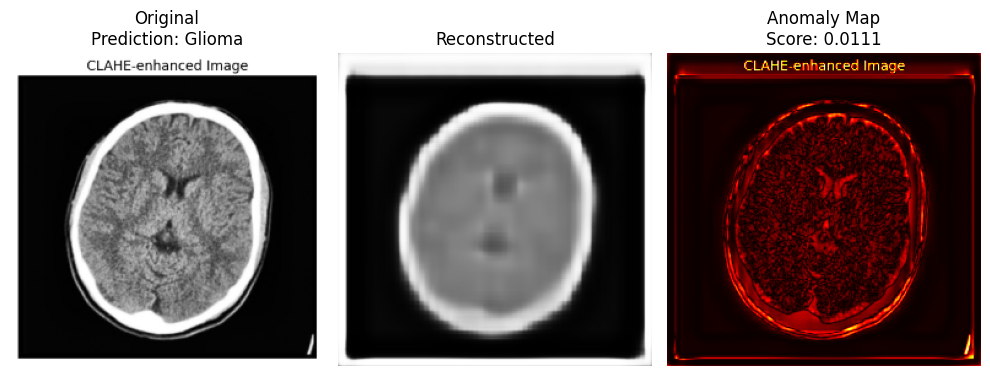

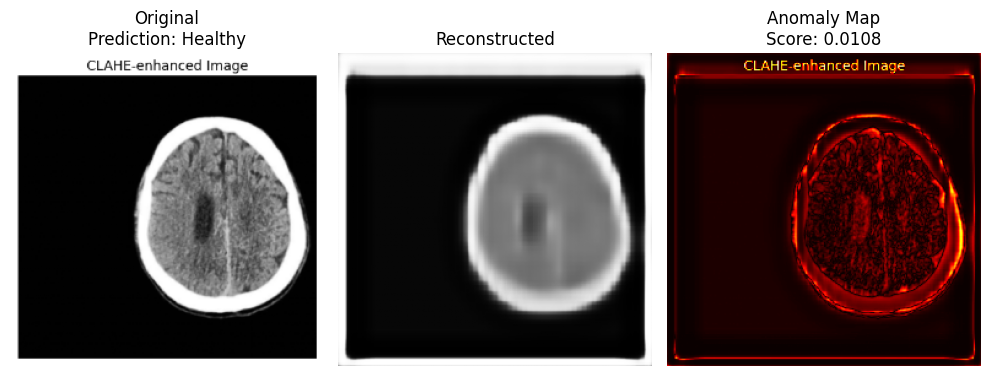

In [ ]:
import numpy as np
import cv2
import os
from tensorflow.keras import layers, models
import tensorflow as tf
from sklearn.model_selection import train_test_split
from skimage.metrics import structural_similarity as ssim
import matplotlib.pyplot as plt
import pandas as pd

# ----------------------------------------
# 1. Load and Preprocess the Images
def load_and_preprocess_images(image_paths, img_size=(256, 256)):
    images = []
    for image_path in image_paths:
        img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
        img = cv2.resize(img, img_size)
        img = img.astype('float32') / 255.0  # Normalize to [0,1]
        images.append(np.expand_dims(img, axis=-1))  # Add channel dimension
    return np.array(images)

# ----------------------------------------
# 2. Autoencoder Model Architecture
def build_autoencoder(input_shape=(256, 256, 1)):
    inputs = layers.Input(shape=input_shape)

    # Encoder
    x = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(inputs)
    x = layers.MaxPooling2D((2, 2), padding='same')(x)
    x = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(x)
    x = layers.MaxPooling2D((2, 2), padding='same')(x)
    x = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(x)
    encoded = layers.MaxPooling2D((2, 2), padding='same')(x)

    # Decoder
    x = layers.Conv2DTranspose(256, (3, 3), activation='relu', padding='same')(encoded)
    x = layers.UpSampling2D((2, 2))(x)
    x = layers.Conv2DTranspose(128, (3, 3), activation='relu', padding='same')(x)
    x = layers.UpSampling2D((2, 2))(x)
    x = layers.Conv2DTranspose(64, (3, 3), activation='relu', padding='same')(x)
    x = layers.UpSampling2D((2, 2))(x)
    outputs = layers.Conv2D(1, (3, 3), activation='sigmoid', padding='same')(x)

    autoencoder = models.Model(inputs, outputs)
    autoencoder.compile(optimizer='adam', loss='binary_crossentropy')
    return autoencoder

# ----------------------------------------
# 3. Train Autoencoder
def train_autoencoder(autoencoder, train_images, epochs=50, batch_size=16):
    history = autoencoder.fit(
        train_images, train_images,
        epochs=epochs,
        batch_size=batch_size,
        validation_split=0.2,
        shuffle=True
    )
    return history

# ----------------------------------------
# 4. Anomaly Detection
def detect_anomalies(autoencoder, test_images):
    reconstructed_images = autoencoder.predict(test_images)
    mse = np.mean(np.square(test_images - reconstructed_images), axis=(1, 2, 3))
    return mse, reconstructed_images

# ----------------------------------------
# 5. Set Paths and Load Data
healthy_image_paths = ['/content/brain pre1.jpg', '/content/brain pre2.png']



glioma_image_paths = [ '/content/brags pre5.png', '/content/brags pre2.png']



healthy_images = load_and_preprocess_images(healthy_image_paths)
glioma_images = load_and_preprocess_images(glioma_image_paths)

# ----------------------------------------
# 6. Build and Train Model
autoencoder = build_autoencoder()
history = train_autoencoder(autoencoder, healthy_images)

# ----------------------------------------
# 7. Anomaly Detection on Glioma & Healthy Samples
glioma_scores, glioma_recon = detect_anomalies(autoencoder, glioma_images)
healthy_scores, healthy_recon = detect_anomalies(autoencoder, healthy_images)

# ----------------------------------------
# 8. Set Threshold & Classify
threshold = np.percentile(healthy_scores, 95)  # Dynamic: 95% of healthy images are below this

print(f"\n[INFO] Detection Threshold (based on healthy data): {threshold:.4f}\n")

results = []

# Evaluate Glioma Images
for i, score in enumerate(glioma_scores):
    label = "Glioma" if score > threshold else "Healthy"
    results.append({"Image": f"Glioma_{i+1}", "Anomaly_Score": score, "Predicted_Label": label})

# Evaluate Healthy Images
for i, score in enumerate(healthy_scores):
    label = "Glioma" if score > threshold else "Healthy"
    results.append({"Image": f"Healthy_{i+1}", "Anomaly_Score": score, "Predicted_Label": label})

# Convert to DataFrame
df_results = pd.DataFrame(results)

# Display
print(df_results)

# Save to CSV
df_results.to_csv('/content/anomaly_detection_results.csv', index=False)
print("\n[INFO] Results saved as: anomaly_detection_results.csv\n")

# ----------------------------------------
# 9. Visualization
def plot_detection(original_images, reconstructed_images, anomaly_scores, threshold, prefix):
    for i in range(len(original_images)):
        label = "Glioma" if anomaly_scores[i] > threshold else "Healthy"

        plt.figure(figsize=(10, 4))

        plt.subplot(1, 3, 1)
        plt.imshow(original_images[i].squeeze(), cmap='gray')
        plt.title(f"Original\nPrediction: {label}")
        plt.axis('off')

        plt.subplot(1, 3, 2)
        plt.imshow(reconstructed_images[i].squeeze(), cmap='gray')
        plt.title("Reconstructed")
        plt.axis('off')

        plt.subplot(1, 3, 3)
        diff = np.abs(original_images[i].squeeze() - reconstructed_images[i].squeeze())
        plt.imshow(diff, cmap='hot')
        plt.title(f"Anomaly Map\nScore: {anomaly_scores[i]:.4f}")
        plt.axis('off')

        plt.tight_layout()
        plt.show()

# Plot Glioma Predictions
print("\n[INFO] Visualizing Glioma Images:")
plot_detection(glioma_images, glioma_recon, glioma_scores, threshold, prefix='Glioma')

# Plot Healthy Predictions
print("\n[INFO] Visualizing Healthy Images:")
plot_detection(healthy_images, healthy_recon, healthy_scores, threshold, prefix='Healthy')


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 537ms/step


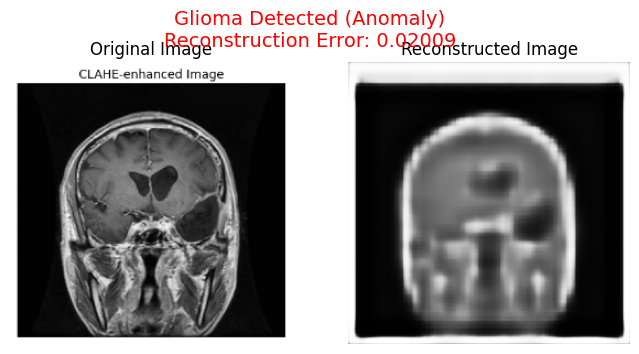

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


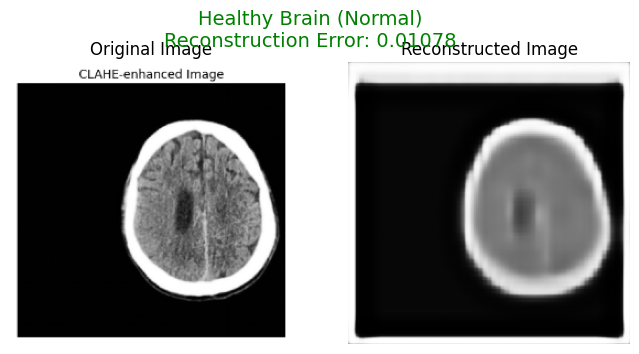

In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

# === STEP 1: Preprocessing Function ===
def preprocess_image(image_path, img_size=(256, 256)):
    img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)   # Load as grayscale
    img = cv2.resize(img, img_size)                      # Resize
    img = img.astype('float32') / 255.0                  # Normalize to [0,1]
    img = np.expand_dims(img, axis=(0, -1))              # Add batch and channel dimension
    return img

# === STEP 2: Anomaly Detection with Visual Output ===
def detect_and_display(image_path, model, threshold=0.02):
    img = preprocess_image(image_path)
    reconstructed = model.predict(img)

    # Calculate reconstruction error
    error = np.mean((img - reconstructed) ** 2)

    # Classify
    if error > threshold:
        label = 'Glioma Detected (Anomaly)'
        color = 'red'
    else:
        label = 'Healthy Brain (Normal)'
        color = 'green'

    # Display Results
    plt.figure(figsize=(8, 4))

    # Original Image
    plt.subplot(1, 2, 1)
    plt.imshow(img[0, :, :, 0], cmap='gray')
    plt.title('Original Image')
    plt.axis('off')

    # Reconstructed Image
    plt.subplot(1, 2, 2)
    plt.imshow(reconstructed[0, :, :, 0], cmap='gray')
    plt.title('Reconstructed Image')
    plt.axis('off')

    plt.suptitle(f'{label}\nReconstruction Error: {error:.5f}', color=color, fontsize=14)
    plt.show()

# === STEP 3: Run the Detector on Your Images ===

# Replace these paths with your uploaded image paths
image_paths = [
    '/content/brags pre2.png',
    '/content/brain pre2.png'

]

for path in image_paths:
    detect_and_display(path, autoencoder)  # Assuming 'autoencoder' is your trained model


In [ ]:
import numpy as np
import cv2

# === STEP 1: Preprocessing Function ===
def preprocess_image(image_path, img_size=(256, 256)):
    img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)   # Load image as grayscale
    img = cv2.resize(img, img_size)                      # Resize to match model input
    img = img.astype('float32') / 255.0                  # Normalize
    img = np.expand_dims(img, axis=(0, -1))              # Add batch & channel dimension
    return img

# === STEP 2: Anomaly Detection Function ===
def detect_anomaly(image_path, model, threshold=0.02):
    img = preprocess_image(image_path)
    reconstructed = model.predict(img)

    # Calculate reconstruction error
    error = np.mean((img - reconstructed)**2)

    # Decision
    if error > threshold:
        print(f"🧠 {image_path} ➡️ Glioma Detected (Anomaly) [Error: {error:.5f}]")
    else:
        print(f"🧠 {image_path} ➡️ Healthy Brain (Normal) [Error: {error:.5f}]")

# === STEP 3: Run on Multiple Images ===

# Replace this list with your actual uploaded image paths
image_paths = [
    '/content/brain pre2.png',
    '/content/brain pre3.png',
    '/content/brain pre4.png',
]

for path in image_paths:
    detect_anomaly(path, autoencoder)  # Assuming 'autoencoder' is your trained model



1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 823ms/step
🧠 /content/brain pre2.png ➡️ Healthy Brain (Normal) [Error: 0.00705]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step
🧠 /content/brain pre3.png ➡️ Healthy Brain (Normal) [Error: 0.01082]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step
🧠 /content/brain pre4.png ➡️ Healthy Brain (Normal) [Error: 0.01368]


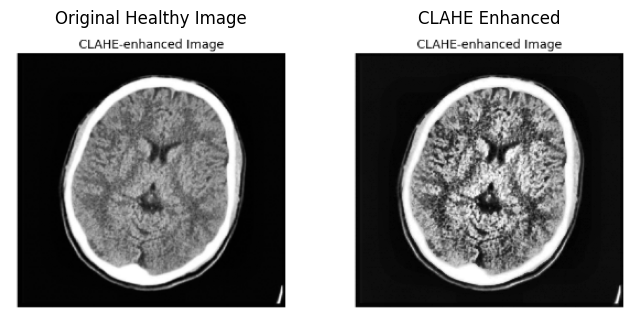

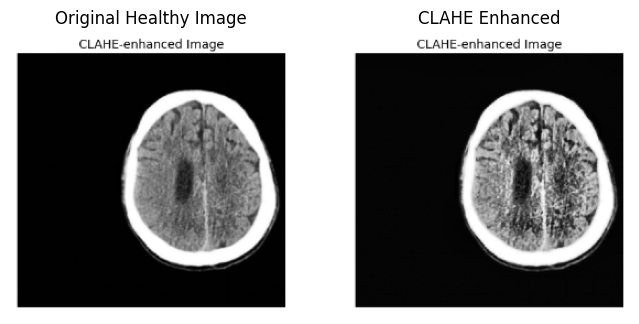

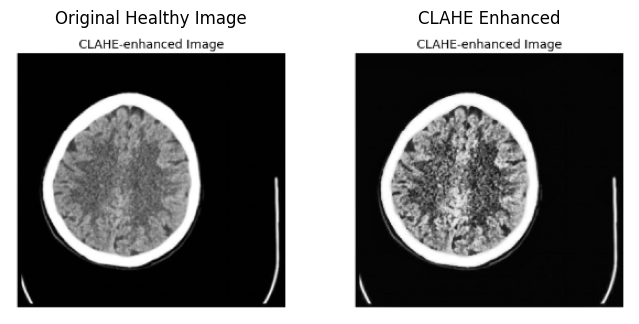

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

# Function to apply CLAHE to a single image
def apply_clahe(image, clip_limit=2.0, tile_grid_size=(8, 8)):
    if len(image.shape) > 2:
        image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    image = np.uint8(image * 255)  # Convert float32 [0,1] back to uint8 [0,255]
    clahe = cv2.createCLAHE(clipLimit=clip_limit, tileGridSize=tile_grid_size)
    clahe_image = clahe.apply(image)
    return clahe_image

# Function to load and preprocess multiple images
def load_and_preprocess_images(image_paths, img_size=(256, 256)):
    images = []
    for image_path in image_paths:
        img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)  # Grayscale read
        img = cv2.resize(img, img_size)                    # Resize
        img = img.astype('float32') / 255.0                # Normalize [0,1]
        images.append(np.expand_dims(img, axis=-1))       # Add channel dimension
    return np.array(images)

# Your image paths (same as before)
healthy_image_paths = [
    '/content/brain pre1.png', '/content/brain pre2.png', '/content/brain pre3.png',
    '/content/brain pre4.png', '/content/brain pre5.png', '/content/brain pre6.png',
    '/content/brain pre8.png', '/content/brain pre9.png', '/content/brain pre10.png',
    '/content/brain pre11.png'
]

glioma_image_paths = [
    '/content/brags pre1.png', '/content/brags pre2.png', '/content/brags pre3.png',
    '/content/brags pre4.png', '/content/brags pre5.png', '/content/brags pre6.png',
    '/content/brags pre7.png', '/content/brags pre8.png', '/content/brags pre9.png',
    '/content/brags pre10.png'
]

# Load the images
healthy_images = load_and_preprocess_images(healthy_image_paths)
glioma_images = load_and_preprocess_images(glioma_image_paths)

# Apply CLAHE to all images and store results
clahe_healthy_images = []
clahe_glioma_images = []

for img in healthy_images:
    clahe_result = apply_clahe(img.squeeze())  # squeeze to remove channel dim
    clahe_healthy_images.append(clahe_result)

for img in glioma_images:
    clahe_result = apply_clahe(img.squeeze())  # squeeze to remove channel dim
    clahe_glioma_images.append(clahe_result)

# Example: Display a few CLAHE-enhanced images
for i in range(min(3, len(clahe_healthy_images))):
    plt.figure(figsize=(8,4))

    plt.subplot(1, 2, 1)
    plt.imshow(healthy_images[i].squeeze(), cmap='gray')
    plt.title("Original Healthy Image")
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(clahe_healthy_images[i], cmap='gray')
    plt.title("CLAHE Enhanced")
    plt.axis('off')

    plt.show()


In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras import layers, models
from sklearn.metrics import f1_score, precision_score, recall_score, confusion_matrix, classification_report

# === Image Loading Functions ===
def load_images_from_folder(folder, img_size=(256, 256)):
    images = []
    for filename in os.listdir(folder):
        img_path = os.path.join(folder, filename)
        img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
        if img is not None:
            img = cv2.resize(img, img_size)
            img = img.astype('float32') / 255.0
            images.append(np.expand_dims(img, axis=-1))
    return np.array(images)

# === Autoencoder Model ===
def build_autoencoder(input_shape=(256, 256, 1)):
    inputs = layers.Input(shape=input_shape)
    x = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(inputs)
    x = layers.MaxPooling2D((2, 2), padding='same')(x)
    x = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(x)
    x = layers.MaxPooling2D((2, 2), padding='same')(x)
    x = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(x)
    encoded = layers.MaxPooling2D((2, 2), padding='same')(x)

    x = layers.Conv2DTranspose(256, (3, 3), activation='relu', padding='same')(encoded)
    x = layers.UpSampling2D((2, 2))(x)
    x = layers.Conv2DTranspose(128, (3, 3), activation='relu', padding='same')(x)
    x = layers.UpSampling2D((2, 2))(x)
    x = layers.Conv2DTranspose(64, (3, 3), activation='relu', padding='same')(x)
    x = layers.UpSampling2D((2, 2))(x)
    outputs = layers.Conv2D(1, (3, 3), activation='sigmoid', padding='same')(x)

    autoencoder = models.Model(inputs, outputs)
    autoencoder.compile(optimizer='adam', loss='binary_crossentropy')
    return autoencoder

# === Anomaly Detection Function ===
def detect_anomalies(autoencoder, images):
    reconstructed = autoencoder.predict(images)
    mse = np.mean(np.square(images - reconstructed), axis=(1, 2, 3))
    return mse, reconstructed

# === Load your datasets ===
healthy_train = load_images_from_folder('/content/brain pre2.png')    # healthy training data
healthy_test = load_images_from_folder('/content/ct28.png')     # healthy test data
glioma_test = load_images_from_folder('/content/brags pre5.png')       # glioma test data

# === Build and Train the Autoencoder ===
autoencoder = build_autoencoder()
history = autoencoder.fit(
    healthy_train, healthy_train,
    epochs=50,     # <-- You can edit this to any number you want.
    batch_size=8,
    validation_split=0.2
)

# === Get Anomaly Scores ===
healthy_scores, _ = detect_anomalies(autoencoder, healthy_test)
glioma_scores, _ = detect_anomalies(autoencoder, glioma_test)

# === Label Assignment & Thresholding ===
y_true = np.array([0] * len(healthy_scores) + [1] * len(glioma_scores))  # 0 = Healthy, 1 = Glioma
all_scores = np.concatenate([healthy_scores, glioma_scores])

# Automatic threshold: Mean of Healthy + Std Dev
threshold = healthy_scores.mean() + 2 * healthy_scores.std()

# Predict
y_pred = (all_scores > threshold).astype(int)

# === Evaluation ===
print("\n--- Classification Report ---\n")
print(classification_report(y_true, y_pred, target_names=['Healthy', 'Glioma']))

print("\n--- Confusion Matrix ---\n")
print(confusion_matrix(y_true, y_pred))

print("\n--- Detailed Scores ---")
print(f"F1 Score: {f1_score(y_true, y_pred):.4f}")
print(f"Recall: {recall_score(y_true, y_pred):.4f}")
print(f"Precision: {precision_score(y_true, y_pred):.4f}")

# === Optional: Plot Sample Results ===
for i in range(min(5, len(glioma_test))):
    original = glioma_test[i].squeeze()
    reconstructed = autoencoder.predict(glioma_test[i:i+1])[0].squeeze()
    error_map = np.abs(original - reconstructed)

    plt.figure(figsize=(10, 3))
    plt.subplot(1, 3, 1)
    plt.imshow(original, cmap='gray')
    plt.title('Original Glioma')

    plt.subplot(1, 3, 2)
    plt.imshow(reconstructed, cmap='gray')
    plt.title('Reconstructed')

    plt.subplot(1, 3, 3)
    plt.imshow(error_map, cmap='hot')
    plt.title('Anomaly Map')

    plt.show()



NotADirectoryError: [Errno 20] Not a directory: '/content/brain pre2.png'

Training samples: 9, Test samples: 18
Epoch 1/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 6s 884ms/step - loss: 0.1869
Epoch 2/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 5s 598ms/step - loss: 0.1658
Epoch 3/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 5s 602ms/step - loss: 0.1339
Epoch 4/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 3s 597ms/step - loss: 0.0889
Epoch 5/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 756ms/step - loss: 0.0426
Epoch 6/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 3s 675ms/step - loss: 0.0294
Epoch 7/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 4s 596ms/step - loss: 0.0262
Epoch 8/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 3s 604ms/step - loss: 0.0314
Epoch 9/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 3s 730ms/step - loss: 0.0197
Epoch 10/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 3s 696ms/step - loss: 0.0264
Epoch 11/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 600ms/step - loss: 0.0281
Epoch 12/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 600ms/step - loss: 0.0292
Epoch 13/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 598ms/step - loss: 0.0136
Epoch 14/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 599ms/step - loss: 0.0134
Epoch 15/200
3/3 ━━━━━━━━━━━━━━━━

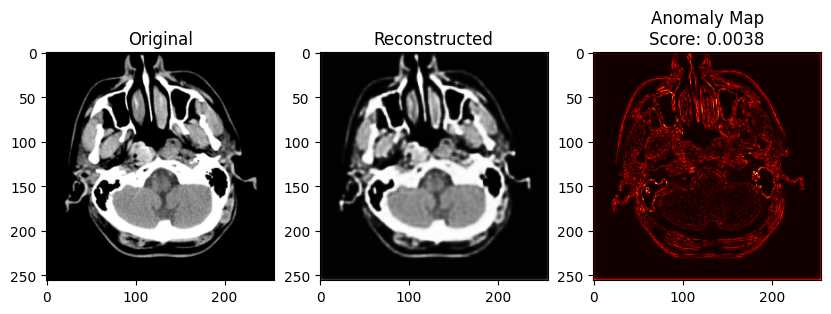

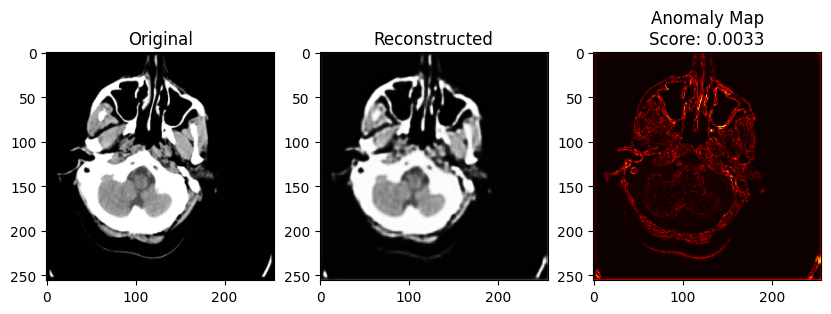

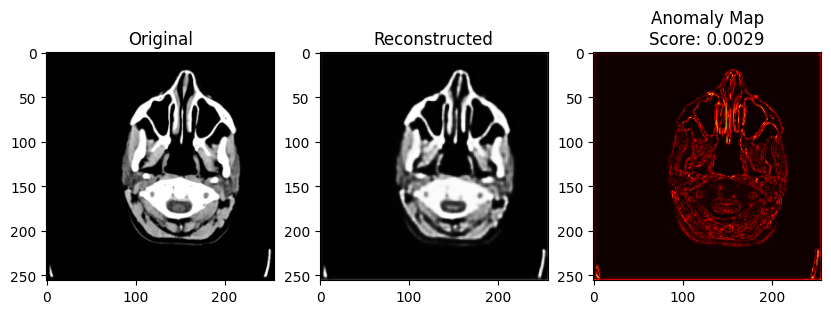

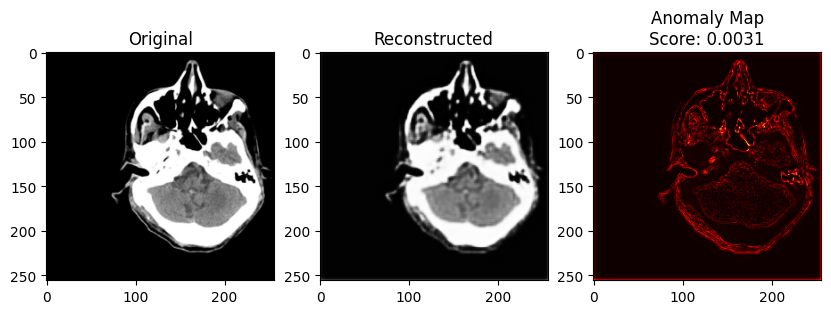

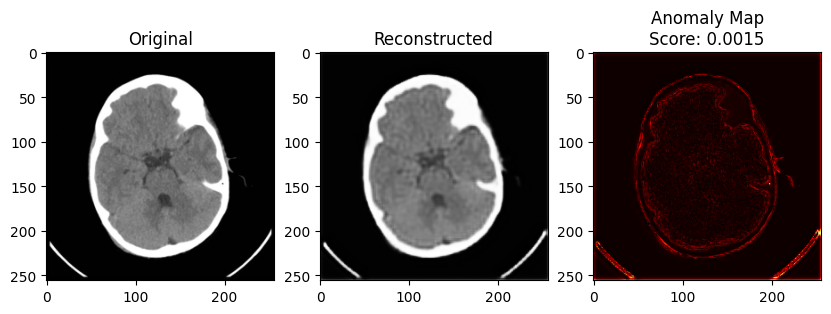

In [ ]:
# === Step 1: Import Libraries ===
import cv2
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D
from sklearn.metrics import classification_report, f1_score, recall_score, precision_score, confusion_matrix

# === Step 2: Image Preprocessing ===
def preprocess_image(image_path, img_size=(256, 256)):
    img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    if img is None:
        raise ValueError(f"Error: Image not found -> {image_path}")
    img = cv2.resize(img, img_size)
    img = img.astype('float32') / 255.0  # Normalize to 0-1
    img = np.expand_dims(img, axis=-1)  # Add channel
    return img

# === Step 3: Load Multiple Images ===
def load_images(image_paths):
    return np.array([preprocess_image(path) for path in image_paths])

# === Step 4: Image File Lists ===
# Replace these with your real paths (Colab)
healthy_train_paths = [
    '/content/brain pre1.png', '/content/brain pre11.png', '/content/brain pre12.png',
    '/content/brain pre2.png','/content/brain pre3.png','/content/brain pre4.png',
    '/content/brain pre5.png','/content/brain pre6.png','/content/brain pre9.png'
]

healthy_test_paths = [
    '/content/ct8.png','/content/ct9.png','/content/ct10.png',
    '/content/ct28.png','/content/ct29.png','/content/ct30.png',
    '/content/ct18.png','/content/ct19.png','/content/ct20.png'
]

glioma_test_paths = [
    '/content/Te-gl_0016.jpg','/content/Te-gl_0017.jpg','/content/Te-gl_0010.jpg',
    '/content/Te-gl_0011.jpg','/content/Te-gl_0012.jpg','/content/Te-gl_0013.jpg',
    '/content/Te-gl_0014.jpg','/content/Te-gl_0015.jpg','/content/Te-gl_0019.jpg'
]

# === Step 5: Load and Label ===
X_train = load_images(healthy_train_paths)  # Only Healthy for training

X_test_healthy = load_images(healthy_test_paths)
X_test_glioma = load_images(glioma_test_paths)

X_test = np.concatenate([X_test_healthy, X_test_glioma])
y_test = np.array([0]*len(X_test_healthy) + [1]*len(X_test_glioma))  # 0: Healthy, 1: Glioma

print(f"Training samples: {len(X_train)}, Test samples: {len(X_test)}")

# === Step 6: Build Autoencoder Model ===
input_img = Input(shape=(256, 256, 1))

# Encoder
x = Conv2D(32, (3, 3), activation='relu', padding='same')(input_img)
x = MaxPooling2D((2, 2), padding='same')(x)
x = Conv2D(64, (3, 3), activation='relu', padding='same')(x)
x = MaxPooling2D((2, 2), padding='same')(x)

# Decoder
x = Conv2D(64, (3, 3), activation='relu', padding='same')(x)
x = UpSampling2D((2, 2))(x)
x = Conv2D(32, (3, 3), activation='relu', padding='same')(x)
x = UpSampling2D((2, 2))(x)
decoded = Conv2D(1, (3, 3), activation='sigmoid', padding='same')(x)

autoencoder = Model(input_img, decoded)
autoencoder.compile(optimizer='adam', loss='mse')

# === Step 7: Train Autoencoder ===
history = autoencoder.fit(
    X_train, X_train,
    epochs=200,  # adjust if needed
    batch_size=4,
    shuffle=True
)

# === Step 8: Predict Reconstructions ===
reconstructed = autoencoder.predict(X_test)

# === Step 9: Compute Anomaly Scores ===
anomaly_scores = np.mean((X_test - reconstructed) ** 2, axis=(1, 2, 3))

# Set threshold (95th percentile of scores)
threshold = np.percentile(anomaly_scores, 95)

# Predict Labels: 1 = Anomaly (Glioma), 0 = Normal
y_pred = (anomaly_scores > threshold).astype(int)

# === Step 10: Evaluation ===
print("\n=== Evaluation ===")
print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred))

print("\nClassification Report:")
print(classification_report(y_test, y_pred))

print("F1 Score: {:.4f}".format(f1_score(y_test, y_pred)))
print("Recall: {:.4f}".format(recall_score(y_test, y_pred)))
print("Precision: {:.4f}".format(precision_score(y_test, y_pred)))

# === Step 11: Visualization ===
for i in range(min(5, len(X_test))):
    plt.figure(figsize=(10,3))

    plt.subplot(1, 3, 1)
    plt.imshow(X_test[i].squeeze(), cmap='gray')
    plt.title("Original")

    plt.subplot(1, 3, 2)
    plt.imshow(reconstructed[i].squeeze(), cmap='gray')
    plt.title("Reconstructed")

    plt.subplot(1, 3, 3)
    plt.imshow(np.abs(X_test[i].squeeze() - reconstructed[i].squeeze()), cmap='hot')
    plt.title(f"Anomaly Map\nScore: {anomaly_scores[i]:.4f}")

    plt.show()



In [ ]:
!pip install segmentation-models-pytorch --quiet
!pip install albumentations --quiet

import torch
import torch.nn as nn
import torch.optim as optim
import segmentation_models_pytorch as smp
import albumentations as A
from albumentations.pytorch import ToTensorV2
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from PIL import Image
import numpy as np
import os


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.8/154.8 kB 3.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 65.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 56.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 38.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 12.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 65.1 MB/s eta 0:00:00


In [ ]:
class GliomaDataset(Dataset):
    def __init__(self, image_dir, mask_dir, transform=None):
        self.image_dir = image_dir
        self.mask_dir = mask_dir
        self.transform = transform
        self.images = os.listdir(image_dir)

    def __len__(self):
        return len(self.images)

    def __getitem__(self, index):
        img_path = os.path.join(self.image_dir, self.images[index])
        mask_path = os.path.join(self.mask_dir, self.images[index])

        image = np.array(Image.open(img_path).convert("RGB"))
        mask = np.array(Image.open(mask_path).convert("L"), dtype=np.float32)
        mask = np.expand_dims(mask, axis=2) / 255.0

        if self.transform:
            augmented = self.transform(image=image, mask=mask)
            image = augmented["image"]
            mask = augmented["mask"]

        return image, mask


In [ ]:
train_transform = A.Compose([
    A.Resize(256, 256),
    A.HorizontalFlip(p=0.5),
    A.RandomBrightnessContrast(p=0.2),
    A.Rotate(limit=30, p=0.5),
    A.Normalize(mean=(0.0, 0.0, 0.0), std=(1.0, 1.0, 1.0)),
    ToTensorV2(),
])


In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

model = smp.Unet(
    encoder_name="resnet34",
    encoder_weights="imagenet",
    in_channels=1,
    classes=1,
    activation=None
).to(device)



In [ ]:
def dice_loss(pred, target, smooth=1):
    pred = torch.sigmoid(pred)
    target = target.float()
    intersection = (pred * target).sum()
    return 1 - ((2. * intersection + smooth) / (pred.sum() + target.sum() + smooth))

class ComboLoss(nn.Module):
    def __init__(self):
        super().__init__()
        self.bce = nn.BCEWithLogitsLoss()

    def forward(self, preds, targets):
        return 0.5 * self.bce(preds, targets) + 0.5 * dice_loss(preds, targets)

criterion = ComboLoss()
optimizer = optim.AdamW(model.parameters(), lr=1e-4)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=3)


In [ ]:
def train_fn(loader, model, optimizer, loss_fn):
    model.train()
    epoch_loss = 0
    for images, masks in loader:
        images = images.cuda()
        masks = masks.cuda()

        outputs = model(images)
        loss = loss_fn(outputs, masks)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        epoch_loss += loss.item()

    return epoch_loss / len(loader)


In [ ]:
def validate_fn(loader, model, loss_fn):
    model.eval()
    val_loss = 0
    with torch.no_grad():
        for images, masks in loader:
            images = images.cuda()
            masks = masks.cuda()
            outputs = model(images)
            loss = loss_fn(outputs, masks)
            val_loss += loss.item()
    return val_loss / len(loader)


In [ ]:
import cv2
import numpy as np

# === Preprocess Function for a Single Image ===
def preprocess_image(image_path, img_size=(256, 256)):
    img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    img = cv2.resize(img, img_size)
    img = img.astype('float32') / 255.0
    img = np.expand_dims(img, axis=-1)
    return img

# === Function to Preprocess All Uploaded Images ===
def load_images(image_paths, img_size=(256, 256)):
    return np.array([preprocess_image(path, img_size) for path in image_paths])

# === Replace these with your actual uploaded paths from Colab ===
healthy_train_paths = [
    '/content/ct1.png',
    '/content/ct2.png',
    '/content/ct3.png',
    '/content/ct4.png',
    '/content/ct5.png',
    '/content/ct6.png',
    '/content/ct7.png',
    '/content/ct11.png',
    '/content/ct12.png',
    '/content/ct13.png',
    '/content/ct14.png',
    '/content/ct15.png',
    '/content/ct16.png',
    '/content/ct17.png',
    '/content/ct21.png',
    '/content/ct22.png',
    '/content/ct23.png',
    '/content/ct24.png',
    '/content/ct25.png',
    '/content/ct26.png',
    '/content/ct27.png',
    '/content/ct31.png',
    '/content/ct32.png',
    '/content/ct33.png',
    '/content/ct34.png',
    '/content/ct35.png',
    '/content/ct36.png',
    '/content/ct37.png',
    '/content/ct41.png',
    '/content/ct42.png',

    # Add more paths here if needed
]

# === Load the Healthy Dataset ===
X_train = load_images(healthy_train_paths)

print(f"✅ Total healthy images loaded: {len(X_train)}")
print(f"✅ Shape of dataset: {X_train.shape}")


✅ Total healthy images loaded: 30
✅ Shape of dataset: (30, 256, 256, 1)


In [ ]:
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D

# === Build Autoencoder Architecture ===
input_img = Input(shape=(256, 256, 1))

# Encoder
x = Conv2D(32, (3, 3), activation='relu', padding='same')(input_img)
x = MaxPooling2D((2, 2), padding='same')(x)
x = Conv2D(64, (3, 3), activation='relu', padding='same')(x)
x = MaxPooling2D((2, 2), padding='same')(x)

# Bottleneck / Latent Space
x = Conv2D(128, (3, 3), activation='relu', padding='same')(x)

# Decoder
x = UpSampling2D((2, 2))(x)
x = Conv2D(64, (3, 3), activation='relu', padding='same')(x)
x = UpSampling2D((2, 2))(x)
decoded = Conv2D(1, (3, 3), activation='sigmoid', padding='same')(x)

# === Model Compile ===
autoencoder = Model(input_img, decoded)
autoencoder.compile(optimizer='adam', loss='mse')

# === Train the Autoencoder ===
history = autoencoder.fit(
    X_train, X_train,   # Train on healthy images only
    epochs=200,         # You can increase for better performance
    batch_size=8,
    shuffle=True,
    validation_split=0.1
)


Epoch 1/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 19s 4s/step - loss: 0.1820 - val_loss: 0.1505
Epoch 2/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 18s 3s/step - loss: 0.1491 - val_loss: 0.0925
Epoch 3/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 21s 3s/step - loss: 0.0786 - val_loss: 0.0306
Epoch 4/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 20s 3s/step - loss: 0.0244 - val_loss: 0.0302
Epoch 5/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 14s 3s/step - loss: 0.0211 - val_loss: 0.0259
Epoch 6/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 20s 3s/step - loss: 0.0172 - val_loss: 0.0154
Epoch 7/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 29s 4s/step - loss: 0.0137 - val_loss: 0.0144
Epoch 8/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 32s 3s/step - loss: 0.0116 - val_loss: 0.0137
Epoch 9/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 14s 3s/step - loss: 0.0107 - val_loss: 0.0125
Epoch 10/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 22s 3s/step - loss: 0.0090 - val_loss: 0.0083
Epoch 11/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 14s 3s/step - loss: 0.0077 - val_loss: 0.0090
Epoch 12/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 21s 3s/step - loss: 0.0071 - val_loss: 0.0085
E

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


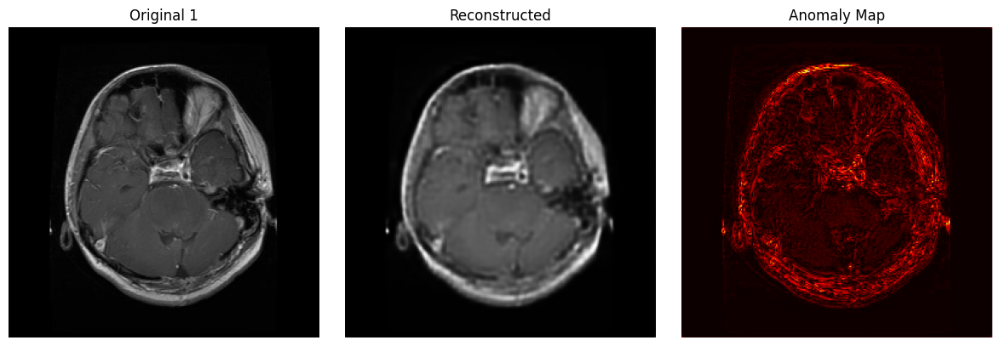

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


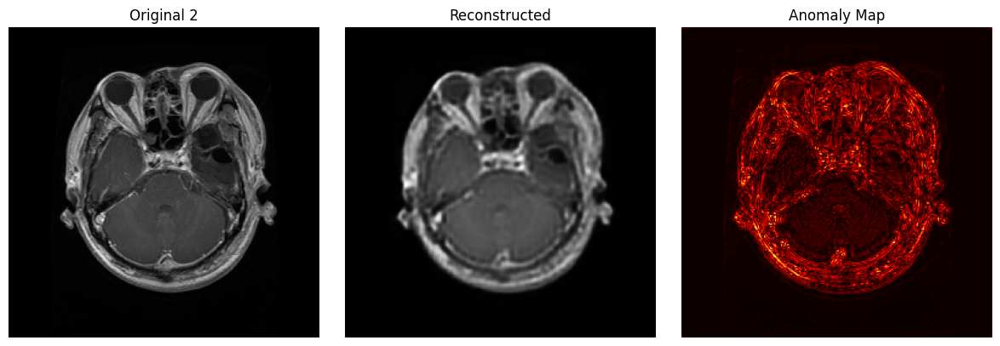

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


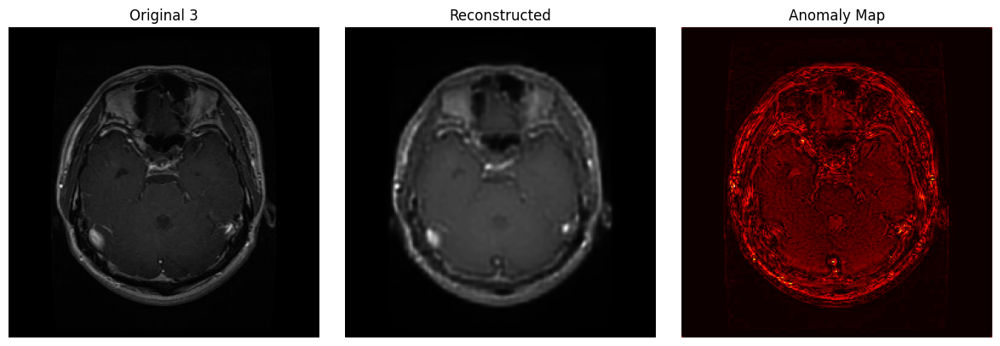

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


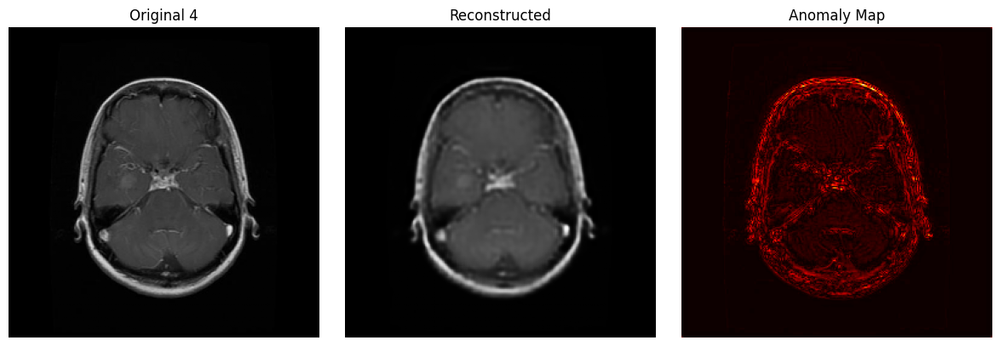

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


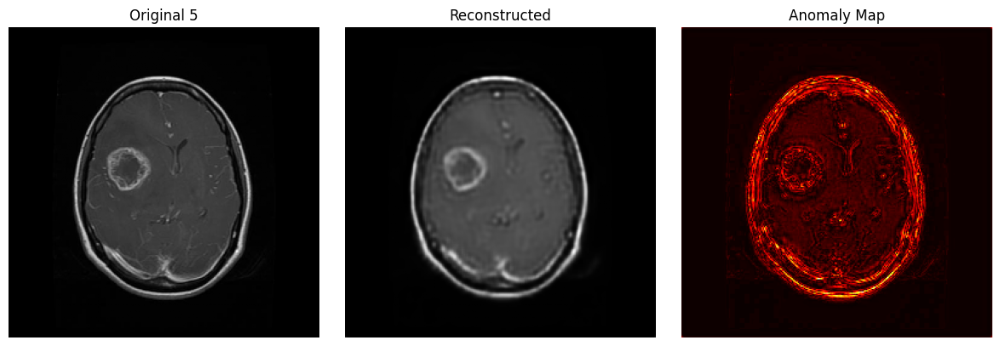

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


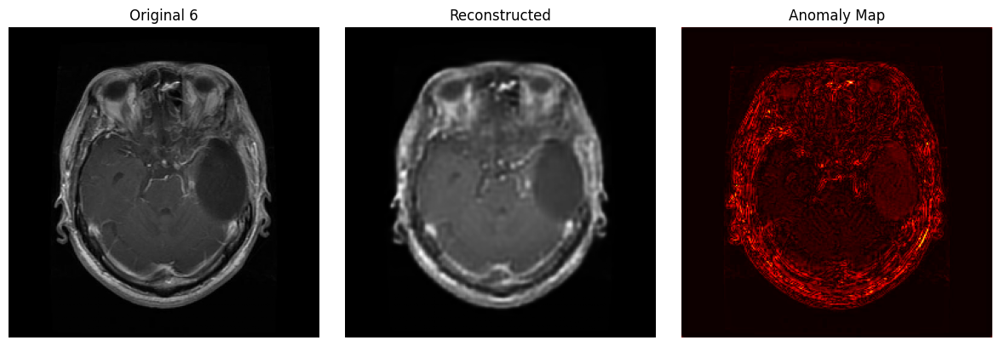

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


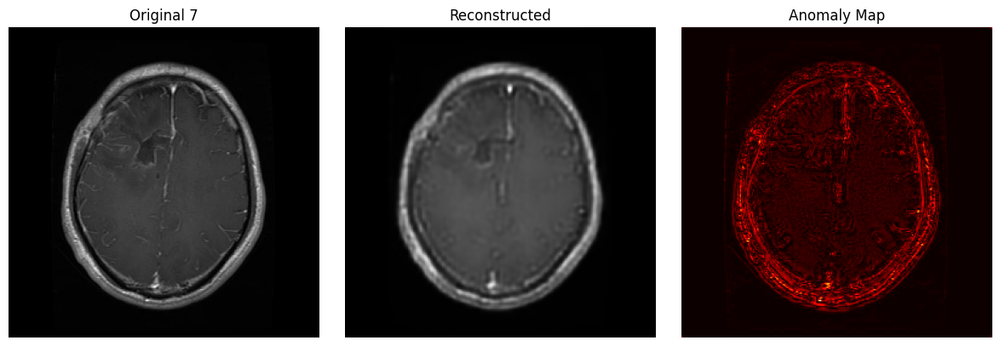

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


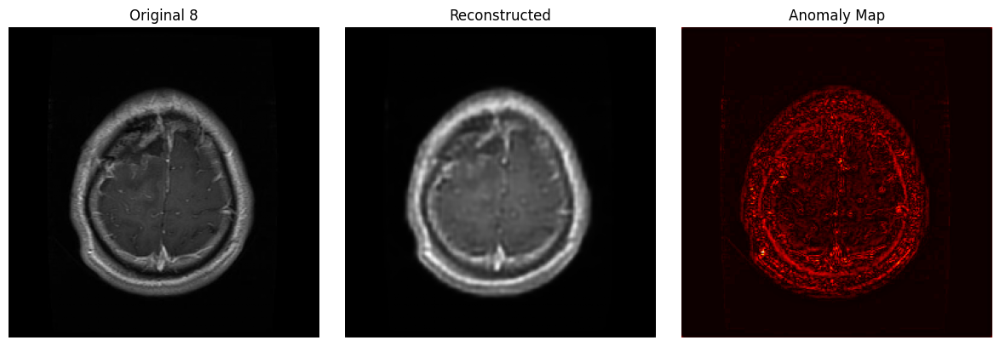

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


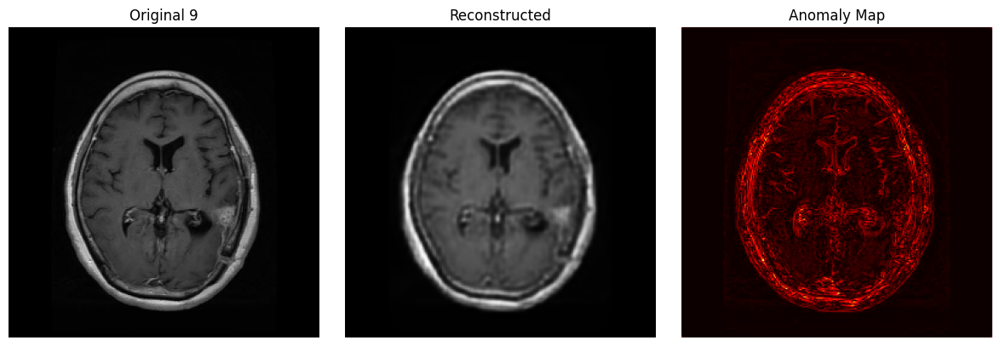

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


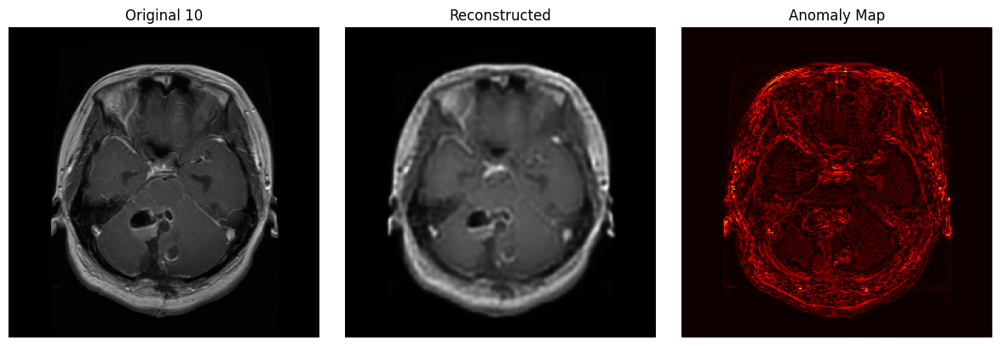

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


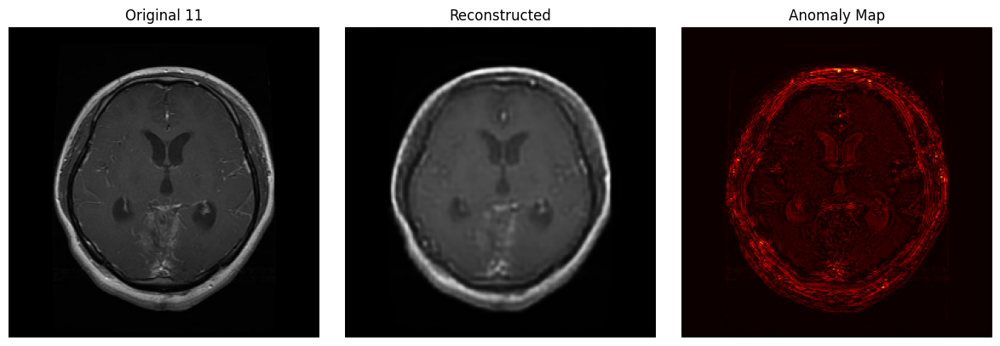

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


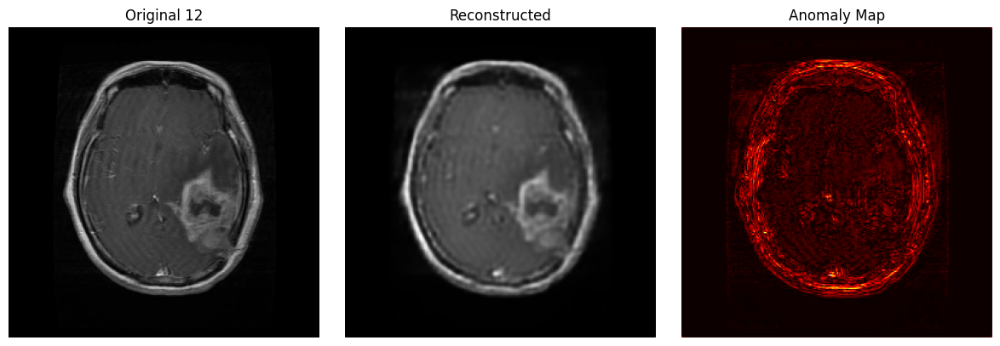

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


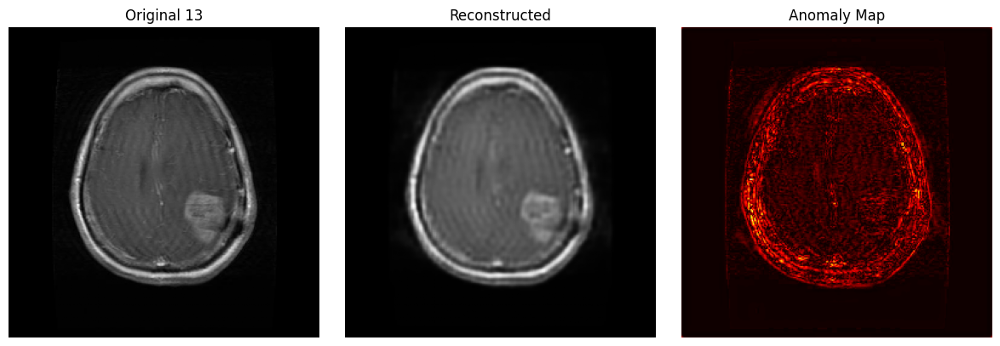

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


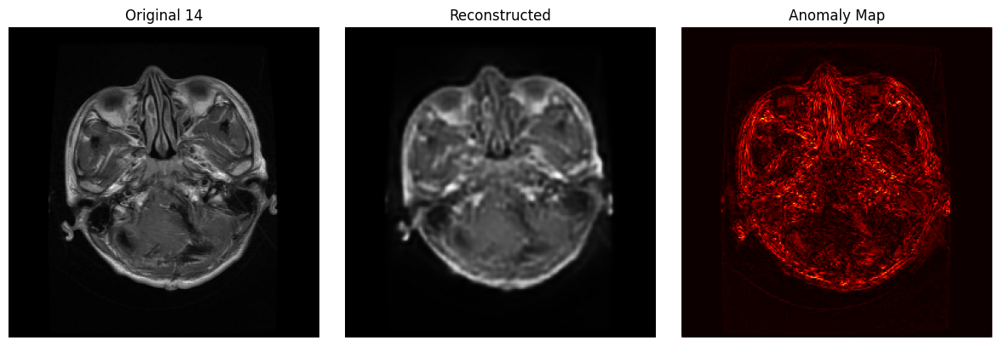

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


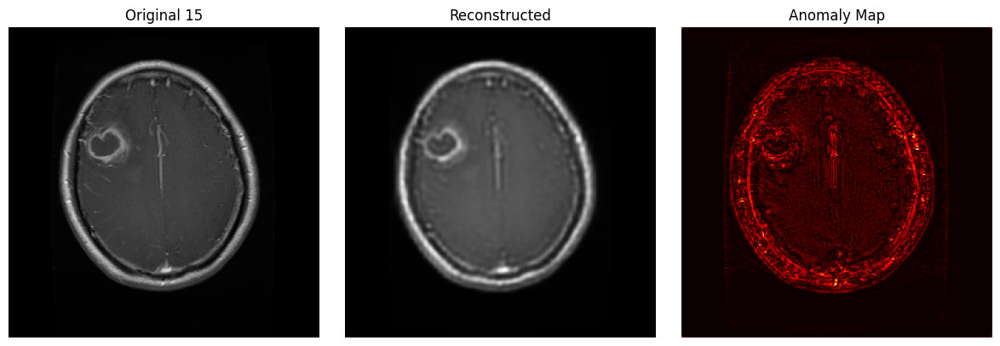

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


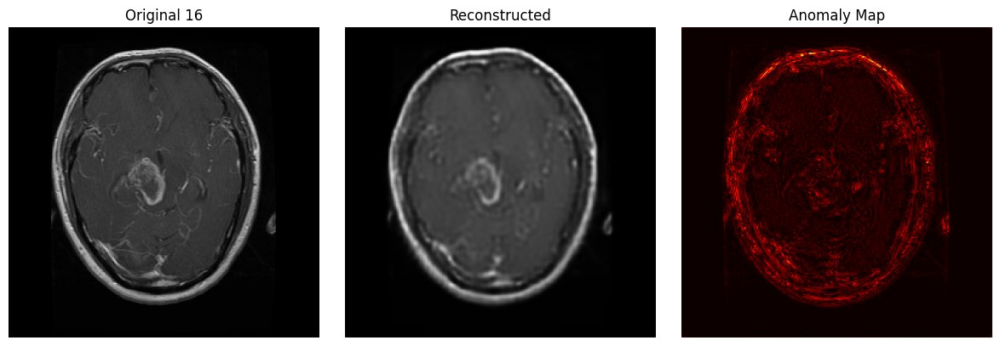

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step


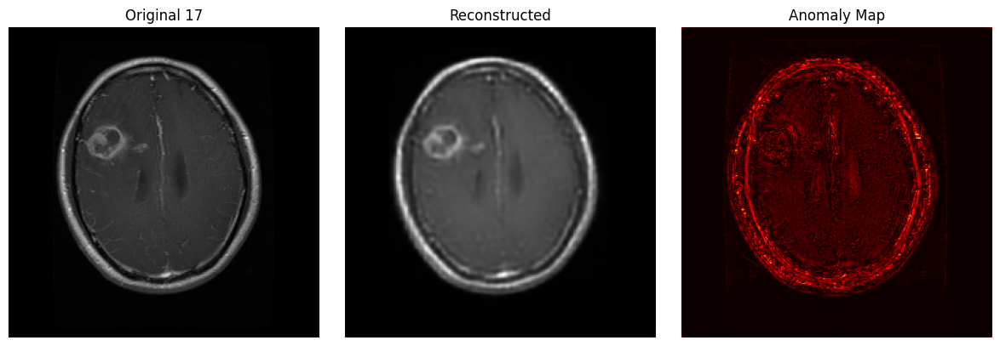

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


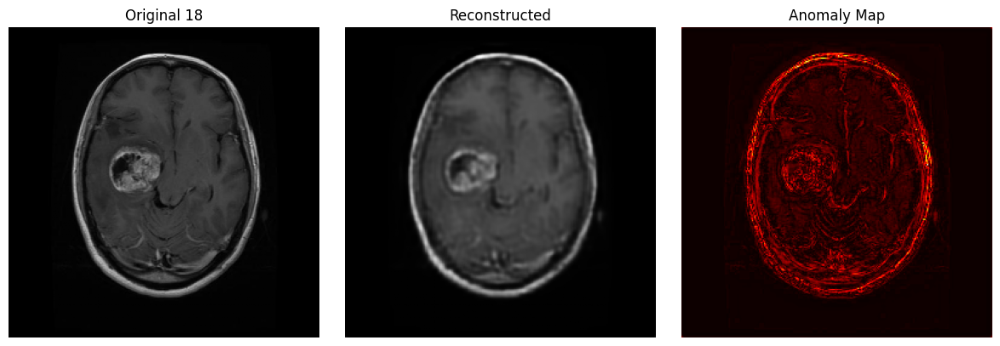

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


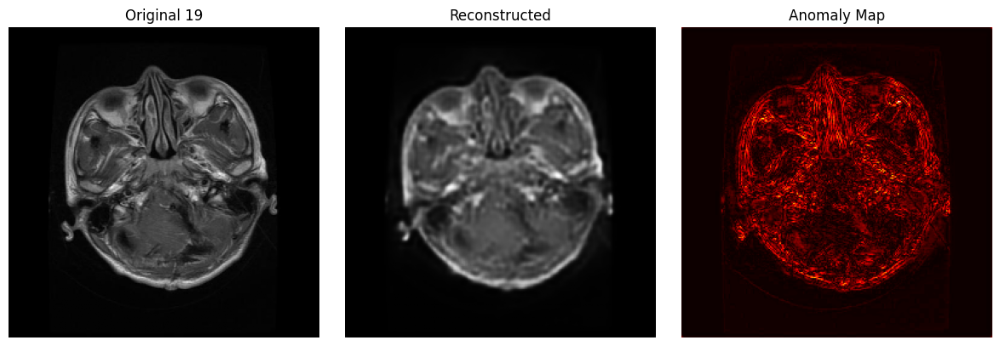

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


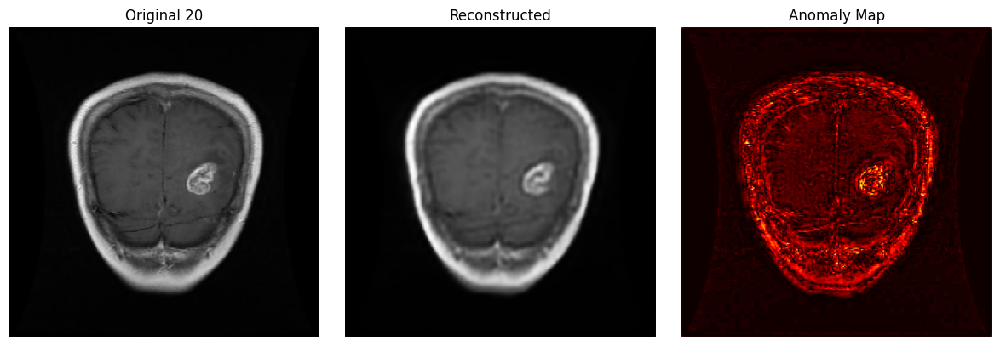

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from tensorflow.keras.preprocessing.image import load_img, img_to_array

# ==== List of individual uploaded image paths ====
image_paths = [
    '/content/Te-gl_0010.jpg',
    '/content/Te-gl_0011.jpg',
    '/content/Te-gl_0012.jpg',
    '/content/Te-gl_0013.jpg',
    '/content/Te-gl_0014.jpg',
    '/content/Te-gl_0015.jpg',
    '/content/Te-gl_0016.jpg',
    '/content/Te-gl_0017.jpg',
    '/content/Te-gl_0019.jpg',
    '/content/Te-gl_0020.jpg',
    '/content/Te-gl_0021.jpg',
    '/content/Te-gl_0022.jpg',
    '/content/Te-gl_0023.jpg',
    '/content/Te-gl_0024.jpg',
    '/content/Te-gl_0025.jpg',
    '/content/Te-gl_0026.jpg',
    '/content/Te-gl_0027.jpg',
    '/content/Te-gl_0028.jpg',
    '/content/Te-gl_0029.jpg',
    '/content/Te-gl_0030.jpg'

]

# === Function to preprocess ===
def preprocess_glioma_image(img_path):
    img = load_img(img_path, color_mode='grayscale', target_size=(256, 256))
    img_array = img_to_array(img) / 255.0
    return np.expand_dims(img_array, axis=0)

# === Loop through each uploaded file ===
for i, path in enumerate(image_paths):
    # Preprocess
    glioma_img = preprocess_glioma_image(path)

    # Predict
    reconstructed = autoencoder.predict(glioma_img)

    # Anomaly Map
    anomaly_map = np.abs(glioma_img - reconstructed)

    # Display
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 3, 1)
    plt.title(f"Original {i+1}")
    plt.imshow(glioma_img[0, :, :, 0], cmap='gray')
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.title("Reconstructed")
    plt.imshow(reconstructed[0, :, :, 0], cmap='gray')
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.title("Anomaly Map")
    plt.imshow(anomaly_map[0, :, :, 0], cmap='hot')
    plt.axis('off')

    plt.tight_layout()
    plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


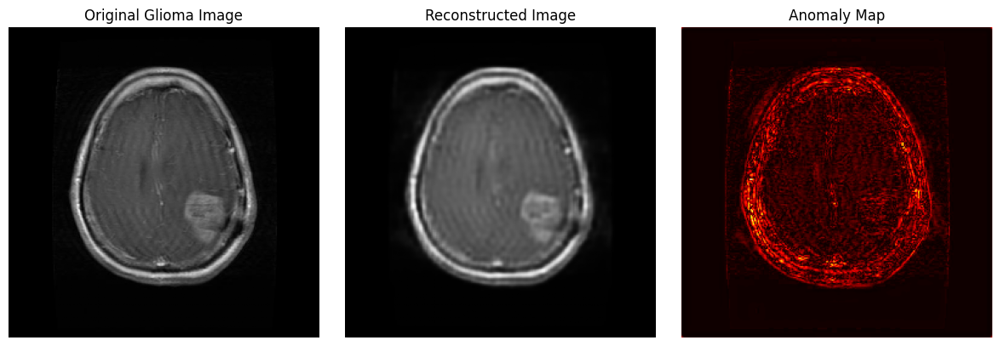

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Load and preprocess a glioma image (grayscale, 256x256)
from tensorflow.keras.preprocessing.image import load_img, img_to_array

def preprocess_glioma_image(img_path):
    img = load_img(img_path, color_mode='grayscale', target_size=(256, 256))
    img_array = img_to_array(img) / 255.0
    return np.expand_dims(img_array, axis=0)  # shape: (1, 256, 256, 1)

# ==== Load a glioma image ====
glioma_img = preprocess_glioma_image("/content/Te-gl_0023.jpg")  # replace with your path

# ==== Get reconstruction ====
reconstructed = autoencoder.predict(glioma_img)

# ==== Calculate anomaly map ====
anomaly_map = np.abs(glioma_img - reconstructed)

# ==== Display everything ====
plt.figure(figsize=(12, 4))

plt.subplot(1, 3, 1)
plt.title("Original Glioma Image")
plt.imshow(glioma_img[0, :, :, 0], cmap='gray')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.title("Reconstructed Image")
plt.imshow(reconstructed[0, :, :, 0], cmap='gray')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.title("Anomaly Map")
plt.imshow(anomaly_map[0, :, :, 0], cmap='hot')  # highlights anomaly regions
plt.axis('off')

plt.tight_layout()
plt.show()



In [ ]:
import cv2

# Normalize error map to [0, 255] for visualization & thresholding
error_norm = (error / error.max() * 255).astype(np.uint8)

# Apply a threshold to highlight high-error (anomalous) regions
_, binary_mask = cv2.threshold(error_norm, 30, 255, cv2.THRESH_BINARY)  # you can tune 30

# Optional: refine mask using morphological operations
kernel = np.ones((3, 3), np.uint8)
binary_mask = cv2.morphologyEx(binary_mask, cv2.MORPH_OPEN, kernel)
binary_mask = cv2.morphologyEx(binary_mask, cv2.MORPH_CLOSE, kernel)

# Plot segmentation result
plt.figure(figsize=(12, 4))

plt.subplot(1, 3, 1)
plt.title("Anomaly Map")
plt.imshow(error_norm, cmap='hot')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.title("Thresholded Mask")
plt.imshow(binary_mask, cmap='gray')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.title("Segmented Tumor Overlay")
plt.imshow(original, cmap='gray')
plt.imshow(binary_mask, cmap='jet', alpha=0.4)
plt.axis('off')

plt.tight_layout()
plt.show()


NameError: name 'error' is not defined

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


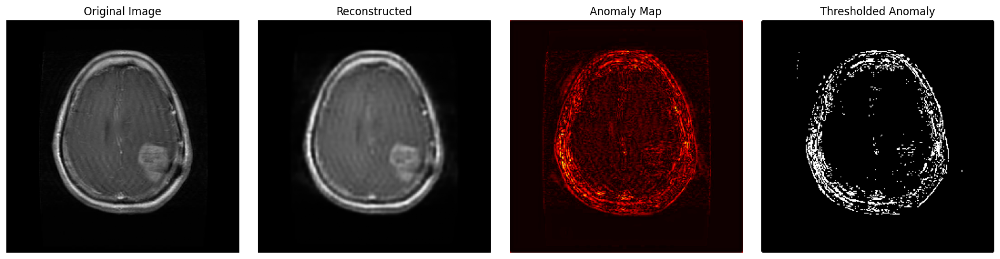

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from tensorflow.keras.preprocessing.image import load_img, img_to_array

# Step 1: Preprocess the input image
def preprocess_glioma_image(img_path):
    img = load_img(img_path, color_mode='grayscale', target_size=(256, 256))
    img_array = img_to_array(img) / 255.0  # Normalize to [0,1]
    return np.expand_dims(img_array, axis=0)  # Shape: (1, 256, 256, 1)

# Step 2: Load the image
img_path = "/content/Te-gl_0023.jpg"  # 🔁 Change this to your image name
glioma_img = preprocess_glioma_image(img_path)

# Step 3: Get reconstruction from autoencoder
reconstructed = autoencoder.predict(glioma_img)

# Step 4: Compute anomaly map (absolute difference)
anomaly_map = np.abs(glioma_img - reconstructed)

# Step 5: Normalize anomaly map for visualization
error_map = anomaly_map[0, :, :, 0]
error_norm = (error_map / np.max(error_map) * 255).astype(np.uint8)

# Step 6: Threshold anomaly map to highlight anomalous regions
threshold = 50  # You can tune this value
binary_mask = (error_norm > threshold).astype(np.uint8) * 255

# Step 7: Visualize results
plt.figure(figsize=(16, 4))

plt.subplot(1, 4, 1)
plt.title("Original Image")
plt.imshow(glioma_img[0, :, :, 0], cmap='gray')
plt.axis('off')

plt.subplot(1, 4, 2)
plt.title("Reconstructed")
plt.imshow(reconstructed[0, :, :, 0], cmap='gray')
plt.axis('off')

plt.subplot(1, 4, 3)
plt.title("Anomaly Map")
plt.imshow(error_norm, cmap='hot')
plt.axis('off')

plt.subplot(1, 4, 4)
plt.title("Thresholded Anomaly")
plt.imshow(binary_mask, cmap='gray')
plt.axis('off')

plt.tight_layout()
plt.show()


In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score, precision_score, recall_score, f1_score

# Step 1: Your image paths and true labels
# Replace with your actual file names
test_images = [
    ("/content/ct11.png", 0),  # healthy
    ("/content/ct12.png", 0),
    ("/content/ct13.png", 0),
    ("/content/ct14.png", 0),
    ("/content/ct15.png", 0),
    ("/content/ct16.png", 0),
    ("/content/Te-gl_0023.jpg", 1),   # glioma
    ("/content/Te-gl_0024.jpg", 1),
    ("/content/Te-gl_0025.jpg", 1),
    ("/content/Te-gl_0026.jpg", 1),
    ("/content/Te-gl_0027.jpg", 1),

    # Add more as needed
]

# Step 2: Preprocessing function
def preprocess_image(path):
    img = load_img(path, color_mode='grayscale', target_size=(256, 256))
    img = img_to_array(img) / 255.0
    return np.expand_dims(img, axis=0)

# Step 3: Evaluate each image
true_labels = []
pred_labels = []

threshold = 0.04  # Tune based on validation set

for img_path, true_label in test_images:
    img = preprocess_image(img_path)
    recon = autoencoder.predict(img)
    error = np.mean(np.abs(img - recon))

    predicted_label = 1 if error > threshold else 0  # 1 = anomaly, 0 = normal
    true_labels.append(true_label)
    pred_labels.append(predicted_label)

# Step 4: Evaluation Metrics
print("Confusion Matrix:")
print(confusion_matrix(true_labels, pred_labels))

print("\nClassification Report:")
print(classification_report(true_labels, pred_labels, target_names=["Normal", "Anomalous"]))

print("Accuracy:", accuracy_score(true_labels, pred_labels))
print("Precision:", precision_score(true_labels, pred_labels))
print("Recall:", recall_score(true_labels, pred_labels))
print("F1 Score:", f1_score(true_labels, pred_labels))


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step
Confusion Matrix:
[[6 0]
 [5 0]]

Classification Report:
              precision    recall  f1-score   support

      Normal       0.55      1.00      0.71         6
   Anomalous       0.00      0.00      0.00         5

    accuracy                           0.55        11
   macro avg       0.27      0.50      0.35        11
weighted avg       0.30      0.55      0.39        11

Accuracy: 0.5454545454545454
Precision: 0.0
Recall: 0.0
F1 Score: 0.0


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/m

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


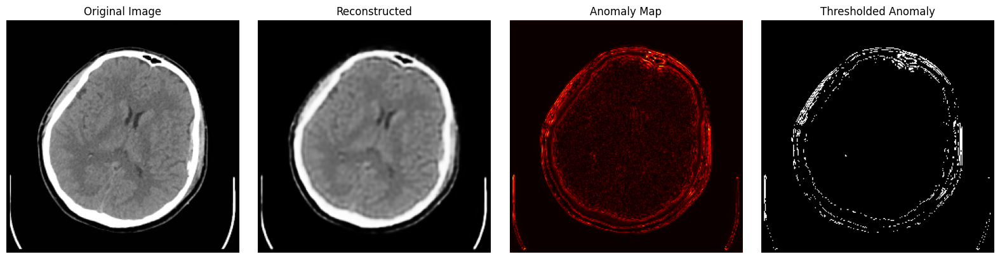

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from tensorflow.keras.preprocessing.image import load_img, img_to_array

# Step 1: Preprocess the input image
def preprocess_glioma_image(img_path):
    img = load_img(img_path, color_mode='grayscale', target_size=(256, 256))
    img_array = img_to_array(img) / 255.0  # Normalize to [0,1]
    return np.expand_dims(img_array, axis=0)  # Shape: (1, 256, 256, 1)

# Step 2: Load the image
img_path = "/content/ct24.png"  # 🔁 Change this to your image name

glioma_img = preprocess_glioma_image(img_path)

# Step 3: Get reconstruction from autoencoder
reconstructed = autoencoder.predict(glioma_img)

# Step 4: Compute anomaly map (absolute difference)
anomaly_map = np.abs(glioma_img - reconstructed)

# Step 5: Normalize anomaly map for visualization
error_map = anomaly_map[0, :, :, 0]
error_norm = (error_map / np.max(error_map) * 255).astype(np.uint8)

# Step 6: Threshold anomaly map to highlight anomalous regions
threshold = 50  # You can tune this value
binary_mask = (error_norm > threshold).astype(np.uint8) * 255

# Step 7: Visualize results
plt.figure(figsize=(16, 4))

plt.subplot(1, 4, 1)
plt.title("Original Image")
plt.imshow(glioma_img[0, :, :, 0], cmap='gray')
plt.axis('off')

plt.subplot(1, 4, 2)
plt.title("Reconstructed")
plt.imshow(reconstructed[0, :, :, 0], cmap='gray')
plt.axis('off')

plt.subplot(1, 4, 3)
plt.title("Anomaly Map")
plt.imshow(error_norm, cmap='hot')
plt.axis('off')

plt.subplot(1, 4, 4)
plt.title("Thresholded Anomaly")
plt.imshow(binary_mask, cmap='gray')
plt.axis('off')

plt.tight_layout()
plt.show()

<ipython-input-1-aff0e64dc557>:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=methods, y=errors, palette='viridis')


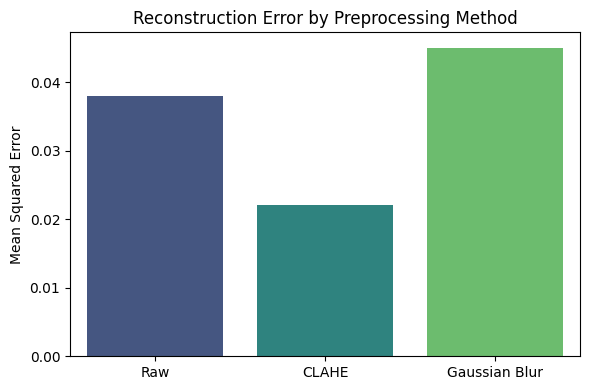

<ipython-input-1-aff0e64dc557>:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=features, y=importance, palette='magma')


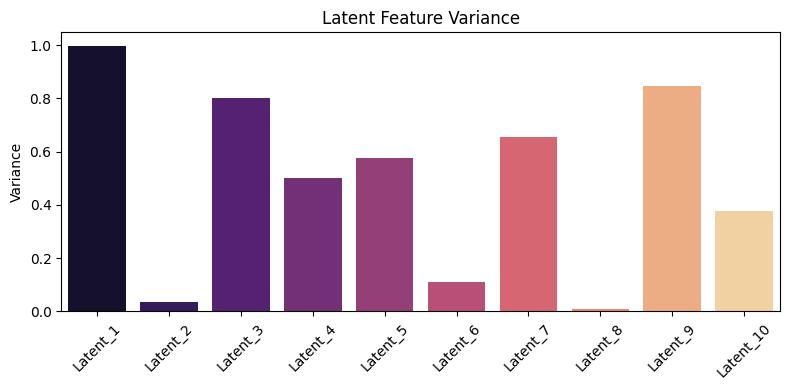

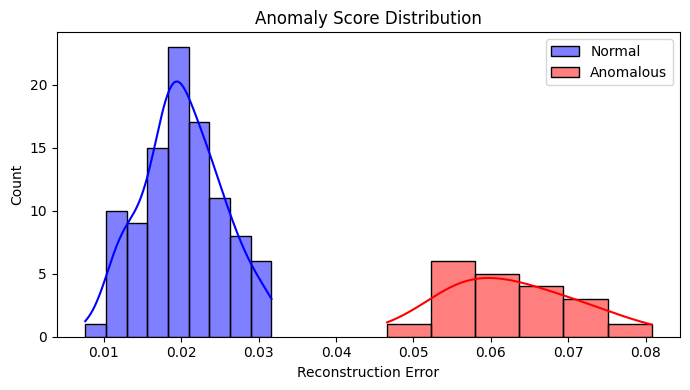

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Reconstruction error (lower is better)
methods = ['Raw', 'CLAHE', 'Gaussian Blur']
errors = [0.038, 0.022, 0.045]

plt.figure(figsize=(6, 4))
sns.barplot(x=methods, y=errors, palette='viridis')
plt.title('Reconstruction Error by Preprocessing Method')
plt.ylabel('Mean Squared Error')
plt.tight_layout()
plt.show()

# 2. Latent feature variance (proxy for feature importance)
features = [f'Latent_{i}' for i in range(1, 11)]
importance = np.random.rand(10)  # Replace with actual feature variance if available

plt.figure(figsize=(8, 4))
sns.barplot(x=features, y=importance, palette='magma')
plt.xticks(rotation=45)
plt.title('Latent Feature Variance')
plt.ylabel('Variance')
plt.tight_layout()
plt.show()

# 3. Distribution of anomaly scores
normal_scores = np.random.normal(loc=0.02, scale=0.005, size=100)
anomaly_scores = np.random.normal(loc=0.06, scale=0.01, size=20)

plt.figure(figsize=(7, 4))
sns.histplot(normal_scores, color='blue', label='Normal', kde=True)
sns.histplot(anomaly_scores, color='red', label='Anomalous', kde=True)
plt.title('Anomaly Score Distribution')
plt.xlabel('Reconstruction Error')
plt.legend()
plt.tight_layout()
plt.show()
